In [1]:
import torch
import numpy as np
import os
from collections import defaultdict

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from einops import rearrange, asnumpy

from matplotlib.animation import ArtistAnimation
from IPython import display

from irwg.data.mnist_gmm import MNIST_GMM
from irwg.utils.mog_utils import compute_conditional_mog_parameters, sample_sparse_mog
from irwg.models import VAE

from irwg.utils.stats import load_stats, load_imputations

In [2]:
mpl.rc('font',**{'family':'serif'})
mpl.rc('text', usetex=True)
mpl.rcParams['text.latex.preamble']=r"\usepackage{amsmath} \usepackage{amsfonts}"

plt.style.use('seaborn-colorblind')

In [3]:
def plot_custom_stripplot(ax, data, labels, showmedians=False, showquartiles=False, show_whiskers=False, colors=None, 
                           *, no_trim=False, only_trim_up=False, use_log_scale=False, stripplot_kw={}):
    # See https://matplotlib.org/stable/gallery/statistics/customized_violin.html#sphx-glr-gallery-statistics-customized-violin-py
    def adjacent_values(vals, q1, q3):
        upper_adjacent_value = q3 + (q3 - q1) * 1.5
        upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

        lower_adjacent_value = q1 - (q3 - q1) * 1.5
        lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
        return lower_adjacent_value, upper_adjacent_value
    
    data = [np.array(sorted(x)) for x in data]

    assert not (no_trim and only_trim_up)
    if no_trim:
        whiskers_min = [np.nanmin(x) for x in data]
        whiskers_max = [np.nanmax(x) for x in data]
        medians = [np.nanmedian(x) for x in data]
        quartile1=None
        quartile3=None
        
        data = [x[~np.isnan(x)] for x in data]
    elif only_trim_up:
        quartile1, medians, quartile3 = np.nanpercentile(data, [25, 50, 75], axis=1)
        whiskers = np.array([
            adjacent_values(sorted_array, q1, q3)
            for sorted_array, q1, q3 in zip(data, quartile1, quartile3)])
        whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
        whiskers_min = [np.nanmin(x) for x in data]

        # Filtering equivalent to boxplot, see https://matplotlib.org/stable/gallery/statistics/boxplot_vs_violin.html
        data = [x[np.logical_and(x >= whiskers_min[i], x <= whiskers_max[i])] for i, x in enumerate(data)]
    else:
        quartile1, medians, quartile3 = np.nanpercentile(data, [25, 50, 75], axis=1)
        whiskers = np.array([
            adjacent_values(sorted_array, q1, q3)
            for sorted_array, q1, q3 in zip(data, quartile1, quartile3)])
        whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]

        # Filtering equivalent to boxplot, see https://matplotlib.org/stable/gallery/statistics/boxplot_vs_violin.html
        data = [x[np.logical_and(x >= whiskers_min[i], x <= whiskers_max[i])] for i, x in enumerate(data)]
    
    if use_log_scale:
        data = [np.log10(x) for x in data]
        whiskers_min = np.log10(whiskers_min)
        whiskers_max = np.log10(whiskers_max)
        medians = np.log10(medians)
        if quartile1 is not None:
            quartile1 = np.log10(quartile1)
        if quartile3 is not None:
            quartile3 = np.log10(quartile3)
    
#     for i, x in enumerate(data):
#         sns.stripplot(
#             ax=ax,
#             data=x,
# #             x=i,
#             c=colors[i],
#         )
    sns.stripplot(
        ax=ax,
        data=data,
        palette=colors,
        jitter=0.4,
        **stripplot_kw,
    )
    
    if use_log_scale:
        ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("$10^{{{x:.0f}}}$"))
        ymin, ymax = ax.get_ylim()
        tick_range = np.arange(np.floor(ymin), ymax)
        ax.yaxis.set_ticks(tick_range)
        ax.yaxis.set_ticks([np.log10(x) for p in tick_range for x in np.linspace(10 ** p, 10 ** (p + 1), 10)], minor=True)
    

    inds = np.arange(0, len(medians))
    if showmedians:
        ax.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    if showquartiles:
        ax.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    if show_whiskers:
        ax.vlines(inds, whiskers_min, whiskers_max, color='k', linestyle='-', lw=1)

In [4]:
def plot_custom_snsviolinplot(ax, data, labels, showmedians=False, showquartiles=False, colors=None, 
                           *, violin_kwargs={}, no_trim=False, only_trim_up=False, use_log_scale=False):
    # See https://matplotlib.org/stable/gallery/statistics/customized_violin.html#sphx-glr-gallery-statistics-customized-violin-py
    def adjacent_values(vals, q1, q3):
        upper_adjacent_value = q3 + (q3 - q1) * 1.5
        upper_adjacent_value = np.clip(upper_adjacent_value, q3, vals[-1])

        lower_adjacent_value = q1 - (q3 - q1) * 1.5
        lower_adjacent_value = np.clip(lower_adjacent_value, vals[0], q1)
        return lower_adjacent_value, upper_adjacent_value
    
    data = [np.array(sorted(x)) for x in data]

    assert not (no_trim and only_trim_up)
    if no_trim:
        whiskers_min = [np.nanmin(x) for x in data]
        whiskers_max = [np.nanmax(x) for x in data]
        medians = [np.nanmedian(x) for x in data]
        quartile1=None
        quartile3=None
        
        data = [x[~np.isnan(x)] for x in data]
    elif only_trim_up:
        quartile1, medians, quartile3 = np.nanpercentile(data, [25, 50, 75], axis=1)
        whiskers = np.array([
            adjacent_values(sorted_array, q1, q3)
            for sorted_array, q1, q3 in zip(data, quartile1, quartile3)])
        whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]
        whiskers_min = [np.nanmin(x) for x in data]

        # Filtering equivalent to boxplot, see https://matplotlib.org/stable/gallery/statistics/boxplot_vs_violin.html
        data = [x[np.logical_and(x >= whiskers_min[i], x <= whiskers_max[i])] for i, x in enumerate(data)]
    else:
        quartile1, medians, quartile3 = np.nanpercentile(data, [25, 50, 75], axis=1)
        whiskers = np.array([
            adjacent_values(sorted_array, q1, q3)
            for sorted_array, q1, q3 in zip(data, quartile1, quartile3)])
        whiskers_min, whiskers_max = whiskers[:, 0], whiskers[:, 1]

        # Filtering equivalent to boxplot, see https://matplotlib.org/stable/gallery/statistics/boxplot_vs_violin.html
        data = [x[np.logical_and(x >= whiskers_min[i], x <= whiskers_max[i])] for i, x in enumerate(data)]
    
    if use_log_scale:
        data = [np.log10(x) for x in data]
        whiskers_min = np.log10(whiskers_min)
        whiskers_max = np.log10(whiskers_max)
        medians = np.log10(medians)
        if quartile1 is not None:
            quartile1 = np.log10(quartile1)
        if quartile3 is not None:
            quartile3 = np.log10(quartile3)
            
    if 'scale' not in violin_kwargs:
        violin_kwargs['scale'] = 'area'
    
    parts = sns.violinplot(ax=ax, 
                   data=data, 
                   palette=colors,
                   inner=None,
                   linewidth=1,
                   cut=0,
                   **violin_kwargs)
    
#     index = 0
#     for art in ax.get_children():
#           if isinstance(art, mpl.collections.PolyCollection):
#             art.set_edgecolor(colors[index])
#             index += 1
        
    if use_log_scale:
        ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("$10^{{{x:.0f}}}$"))
        ymin, ymax = ax.get_ylim()
        tick_range = np.arange(np.floor(ymin), ymax)
        ax.yaxis.set_ticks(tick_range)
        ax.yaxis.set_ticks([np.log10(x) for p in tick_range for x in np.linspace(10 ** p, 10 ** (p + 1), 10)], minor=True)

    inds = np.arange(0, len(medians))
    if showmedians:
        ax.scatter(inds, medians, marker='o', color='white', s=30, zorder=3)
    if showquartiles:
        ax.vlines(inds, quartile1, quartile3, color='k', linestyle='-', lw=5)
    ax.vlines(inds, whiskers_min, whiskers_max, color='k', linestyle='-', lw=1)

In [5]:
def compute_marginal_stddev_of_mog(means_mog, comp_probs_mog, covs_mog):
    # Compute the mean of the MoG
    mean = (means_mog*comp_probs_mog[:, None]).sum(0)
    # Compute the covariance of the MoG
    dif = means_mog - mean
    cov = covs_mog + dif[..., None] @ dif[:, None, :]
    cov *= comp_probs_mog[:, None, None]
    cov = cov.sum(0)

    # Get standard deviation of marginals
    std = np.diagonal(cov)**(0.5)
    
    return std

In [6]:
def load_mog_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mogs_and_distances.npz'))
    
    return f['all_kldivs_fow'], f['all_kldivs_rev'], f['all_jsds']

In [7]:
def load_mog_compprob_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_comp_log_probs.npz'))
    
    return f['kl_fow'], f['kl_rev'], f['jsd']

def load_supervisedmog_compprob_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_comp_log_probs.npz'))
    
    return f['mog_kl_fow'], f['mog_kl_rev'], f['mog_jsd']

def load_supervisedmog_diag_compprob_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'diag_mog_comp_log_probs.npz'))
    
    return f['mog_kl_fow'], f['mog_kl_rev'], f['mog_jsd'], f['compweightavg_wasserstein_d']

def load_fid_classifier_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_fid_scores.npz'))
    
    return f['fid_scores']

def load_fid_encoder_results(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_fid_scores2.npz'))
    
    return f['fid_scores']

In [8]:
def load_mog_compprob_results_irwg_resampled(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_comp_log_probs_irwg_resampled.npz'))
    
    return f['kl_fow'], f['kl_rev'], f['jsd']

def load_supervisedmog_compprob_results_irwg_resampled(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_comp_log_probs_irwg_resampled.npz'))
    
    return f['mog_kl_fow'], f['mog_kl_rev'], f['mog_jsd']

def load_supervisedmog_diag_compprob_results_irwg_resampled(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'diag_mog_comp_log_probs_irwg_resampled.npz'))
    
    return f['mog_kl_fow'], f['mog_kl_rev'], f['mog_jsd'], f['compweightavg_wasserstein_d']

def load_fid_classifier_results_irwg_resampled(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_fid_scores_irwg_resampled.npz'))
    
    return f['fid_scores']

def load_fid_encoder_results_irwg_resampled(path):
    versions = os.listdir(path)
    if len(versions) > 1:
        versions = list(sorted([int(v.split('version_')[1]) for v in versions]))
        v = versions[-1]
        v = f'version_{v}'
        print(f'Multiple versions found in {path}, loading {v}.')
    else:
        v = versions[0]
        
    path = os.path.join(path, v)
    
    f = np.load(os.path.join(path, 'mog_fid_scores2_irwg_resampled.npz'))
    
    return f['fid_scores']

def load_imputations_irwg_resampled(path, version=None, *, verbose=False,):
    return load_imputations(path, version=version, verbose=verbose, 
                            filename_prefix='irwg_imputations_after_final_resampling_')

In [9]:
dataset = MNIST_GMM(root='../data', filename='mnist_gmm_data', return_targets=True, split = 'test')
data, labels = dataset[:]

comp_log_probs = torch.tensor(np.log(dataset.data_file['comp_probs']))
means = torch.tensor(dataset.data_file['means'])
covs = torch.tensor(dataset.data_file['covs'])

## Overview of samples 

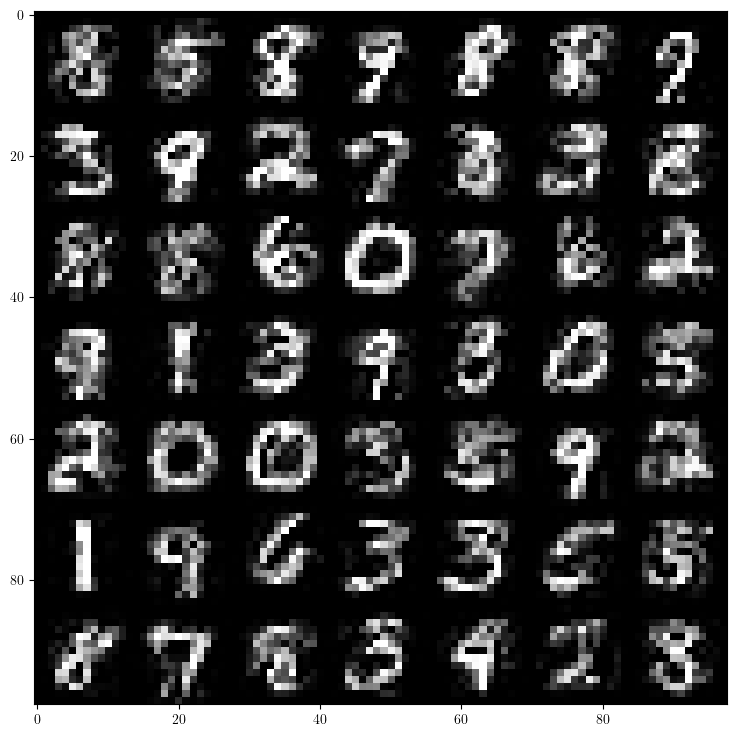

In [10]:
idx = np.arange(196, 245)
X_i = data[idx]
X_i = dataset.postprocess(X_i)

X_i = rearrange(X_i, '(n1 n2) (h w) -> (n1 h) (n2 w)', n1=7, n2=7, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

/tmp/ipykernel_3850789/1568391885.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


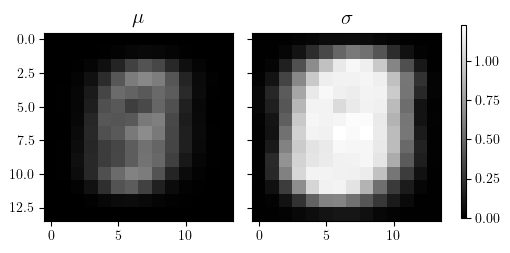

In [11]:
X_i = data[:]

data_mean = X_i.mean(axis=0)
# data_std = X_i.std(axis=0, ddof=1)
data_std = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_i).std(axis=0, ddof=1)

fig, axes = plt.subplots(1, 2, figsize=(5, 3.5), sharex=True, sharey=True)

data_mean = dataset.postprocess(data_mean)
data_mean = rearrange(data_mean, '(h w) -> h w', h=14, w=14)
data_std = rearrange(data_std, '(h w) -> h w', h=14, w=14)

std_max = data_std.max()

axes[0].imshow(data_mean, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('$\mu$', fontsize=15)
im = axes[1].imshow(data_std, cmap='gray', vmin=0, vmax=std_max)
axes[1].set_title('$\sigma$', fontsize=15)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.24, 0.01, 0.55])
fig.colorbar(im, cax=cbar_ax)

fig.tight_layout(rect=[0, 0, .9, 1])

## Sample VAE

/home/vaidas/miniconda3/envs/irwg/lib/python3.8/site-packages/pytorch_lightning/utilities/parsing.py:261: UserWarning: Attribute 'generator_network' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['generator_network'])`.
  rank_zero_warn(
/home/vaidas/miniconda3/envs/irwg/lib/python3.8/site-packages/pytorch_lightning/utilities/parsing.py:261: UserWarning: Attribute 'var_latent_network' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['var_latent_network'])`.
  rank_zero_warn(


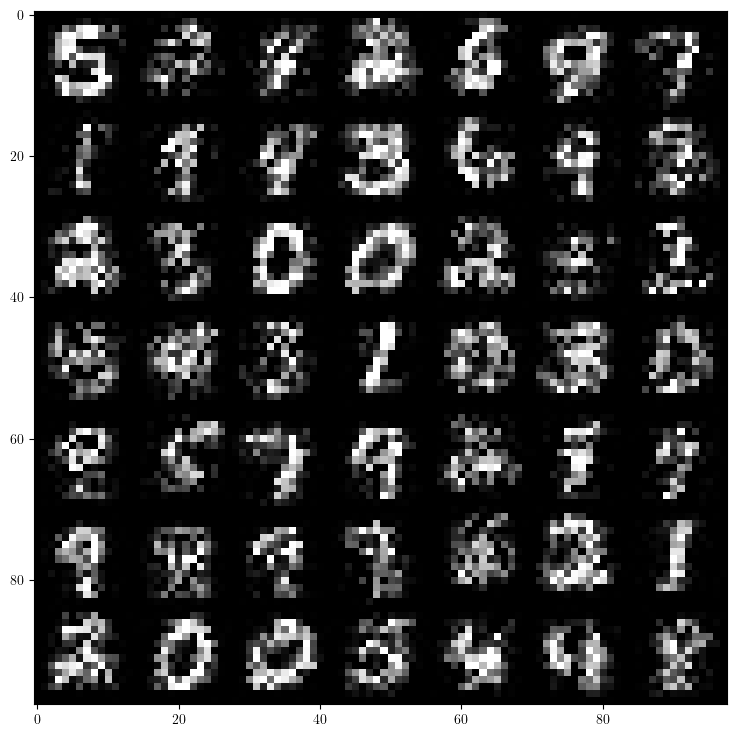

In [12]:
ds = 'mnist_gmm'
vae_path = (f'../logs/{ds}/imputation/vae_convresnet3/seed_m20220118_d20220118/lightning_logs/'
            'version_0/checkpoints/epoch=5999-step=540000.ckpt')
vae = VAE.load_from_checkpoint(vae_path)
vae = vae.eval()

num_datapoints = 49
vae_samples = vae.sample(num_datapoints)
vae_samples = dataset.postprocess(vae_samples)

vae_samples = rearrange(vae_samples, '(n1 n2) (h w) -> (n1 h) (n2 w)', n1=7, n2=7, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(vae_samples, cmap='gray')

/tmp/ipykernel_4056705/56600148.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


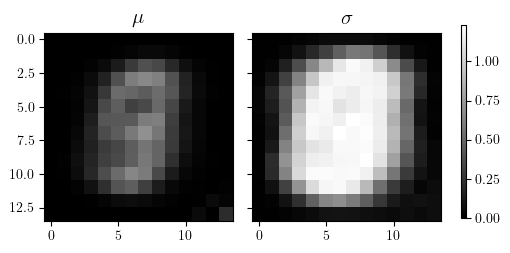

In [11]:
num_datapoints = 10000
vae_samples = vae.sample(num_datapoints)

vae_mean = vae_samples.mean(dim=0)
vae_std = dataset.clip_unconstrained_samples_to_unconstraineddatarange(vae_samples).std(dim=0, unbiased=True)

fig, axes = plt.subplots(1, 2, figsize=(5, 3.5), sharex=True, sharey=True)

vae_mean = dataset.postprocess(vae_mean)
vae_mean = rearrange(vae_mean, '(h w) -> h w', h=14, w=14)
vae_std = rearrange(vae_std, '(h w) -> h w', h=14, w=14)

std_max = vae_std.max()

axes[0].imshow(vae_mean, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('$\mu$', fontsize=15)
im = axes[1].imshow(vae_std, cmap='gray', vmin=0, vmax=std_max)
axes[1].set_title('$\sigma$', fontsize=15)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.24, 0.01, 0.55])
fig.colorbar(im, cax=cbar_ax)

fig.tight_layout(rect=[0, 0, .9, 1])

## Preparing missingness masks for specific test samples  v1

### Sample 32

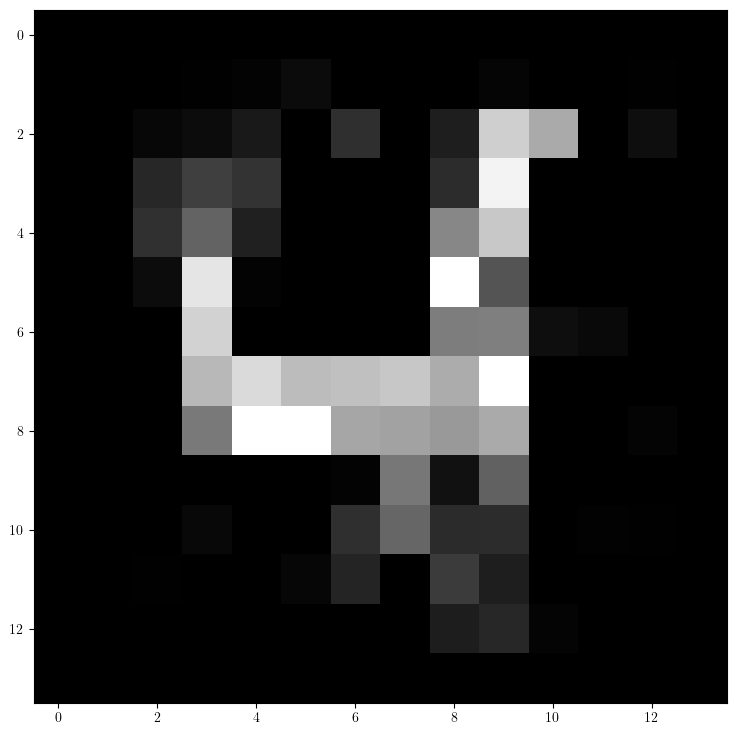

In [8]:
idx = 32

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

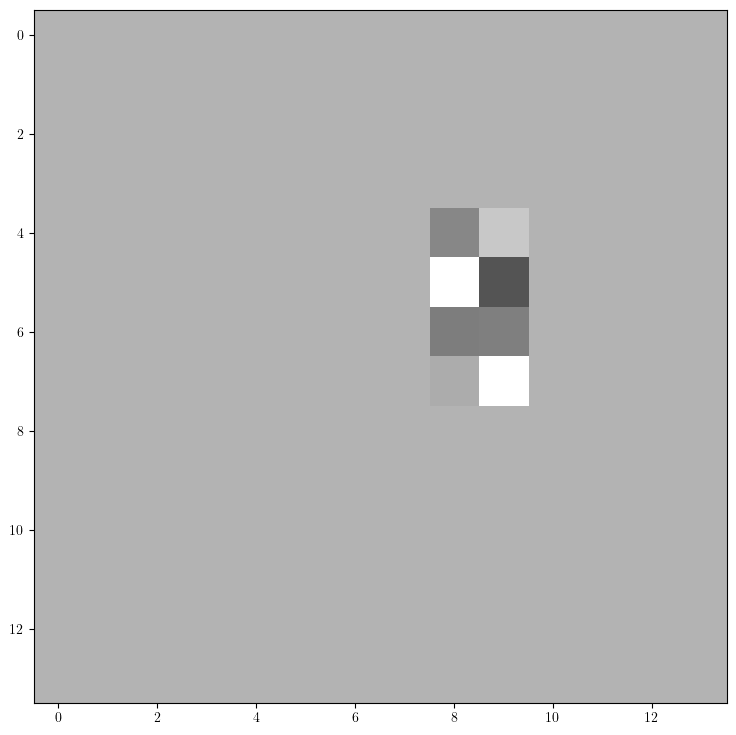

In [9]:
M = np.zeros_like(X_i, dtype=bool)
# M[0:4, 3:11] = 0
# M[8:14, 3:11] = 0
# M[3:9, 2:8] = 0
M[4:8, 8:10] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [10]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

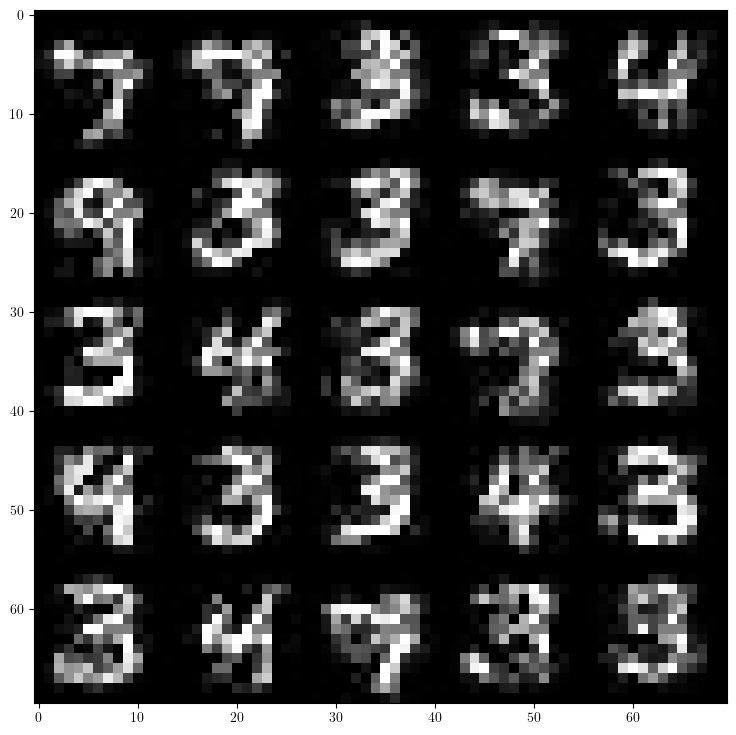

In [11]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 36

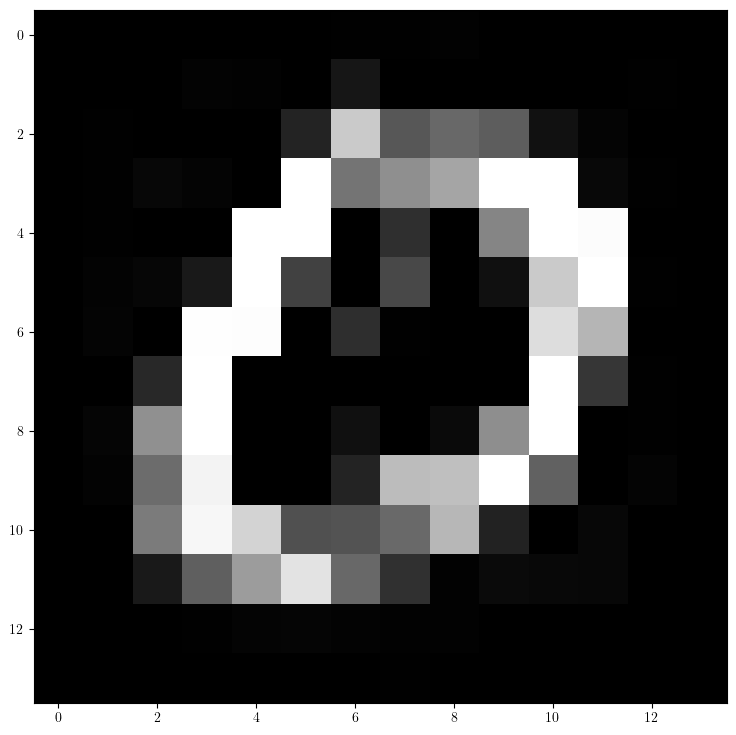

In [12]:
idx = 36

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

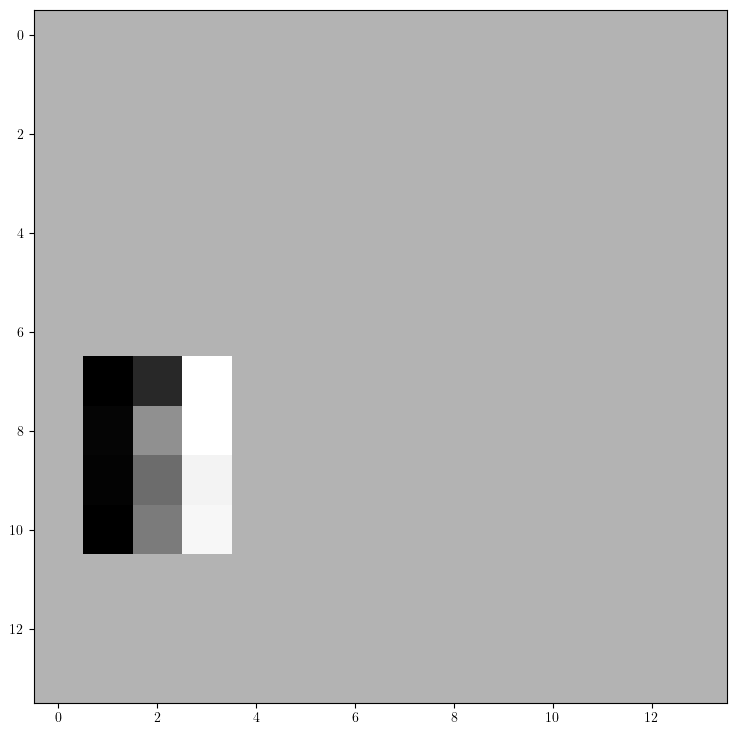

In [13]:
M = np.zeros_like(X_i, dtype=bool)
M[7:11, 1:4] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [14]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,

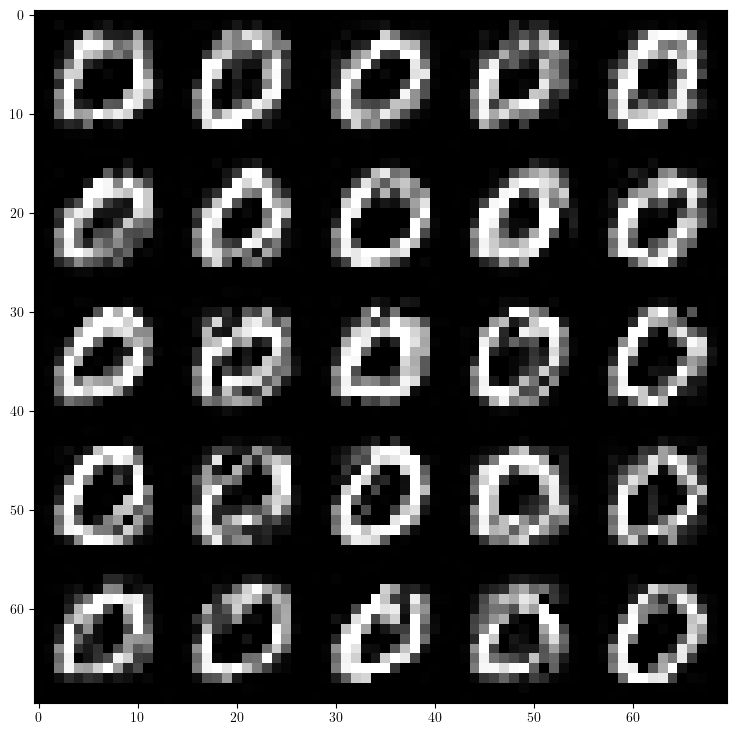

In [15]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 45

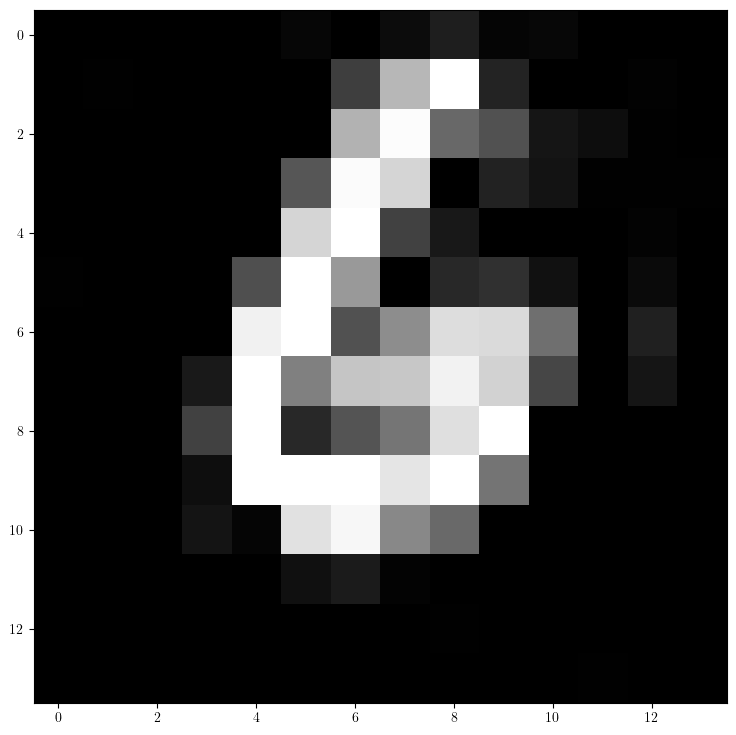

In [16]:
idx = 45

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

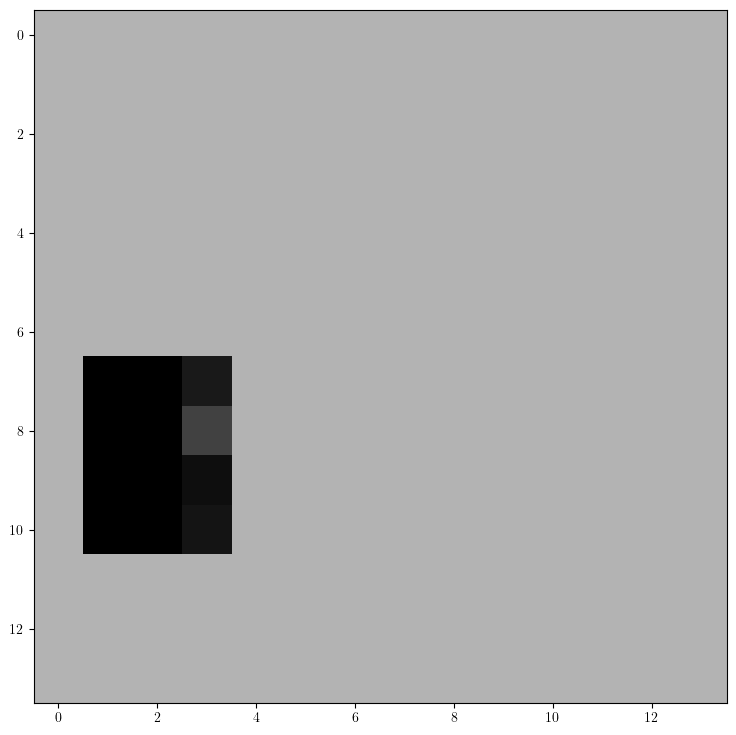

In [17]:
M = np.zeros_like(X_i, dtype=bool)
M[7:11, 1:4] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [18]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,

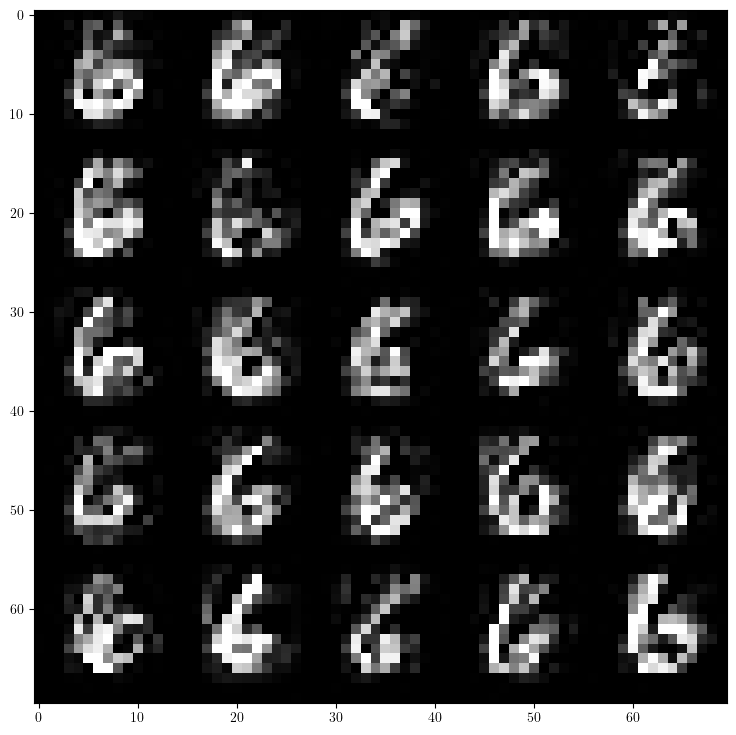

In [19]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 119

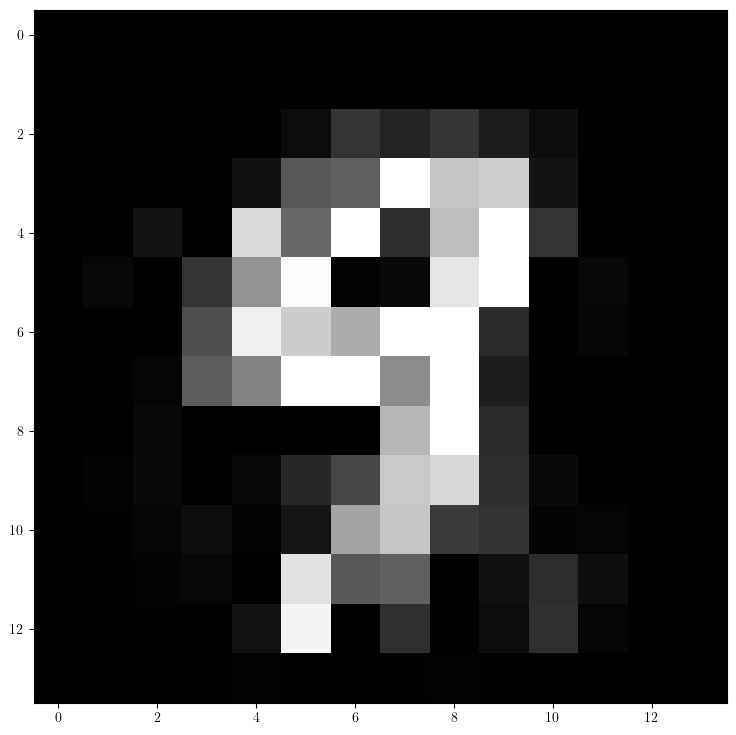

In [20]:
idx = 119

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

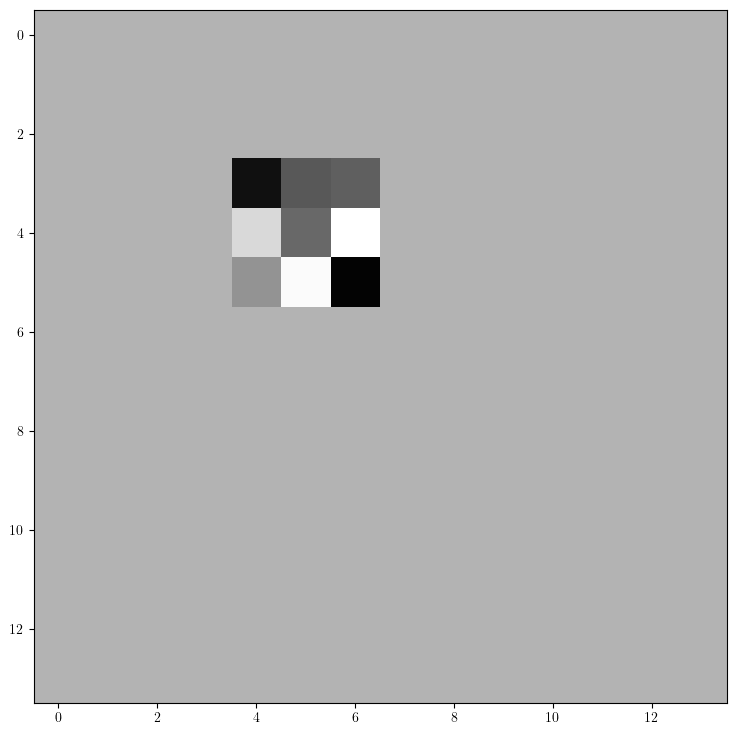

In [21]:
M = np.zeros_like(X_i, dtype=bool)
M[3:6, 4:7] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [22]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

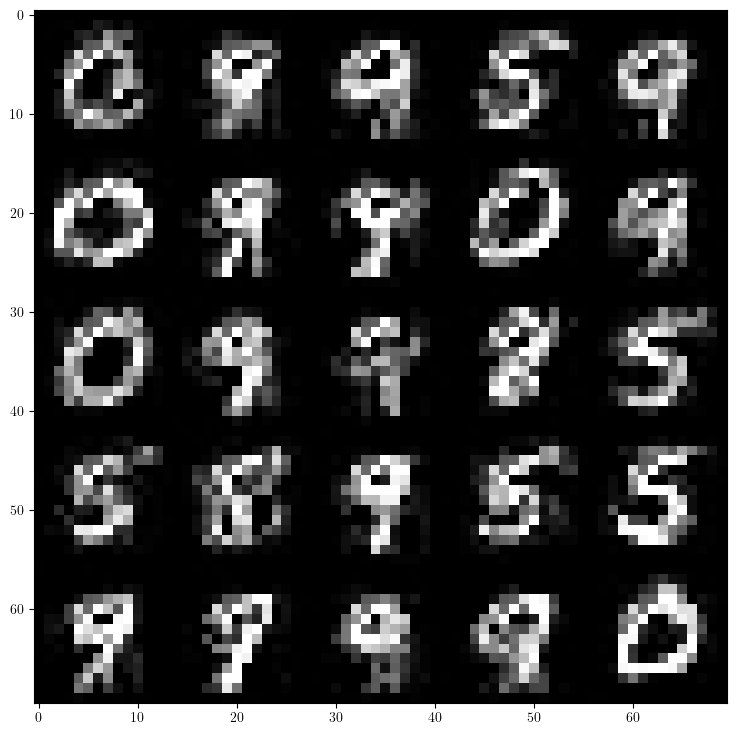

In [23]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 136

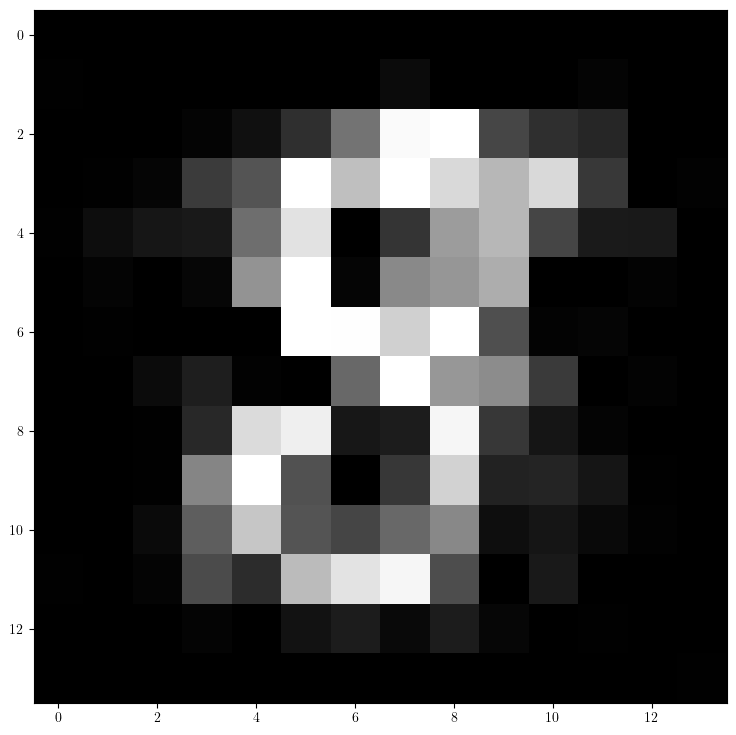

In [24]:
idx = 136

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

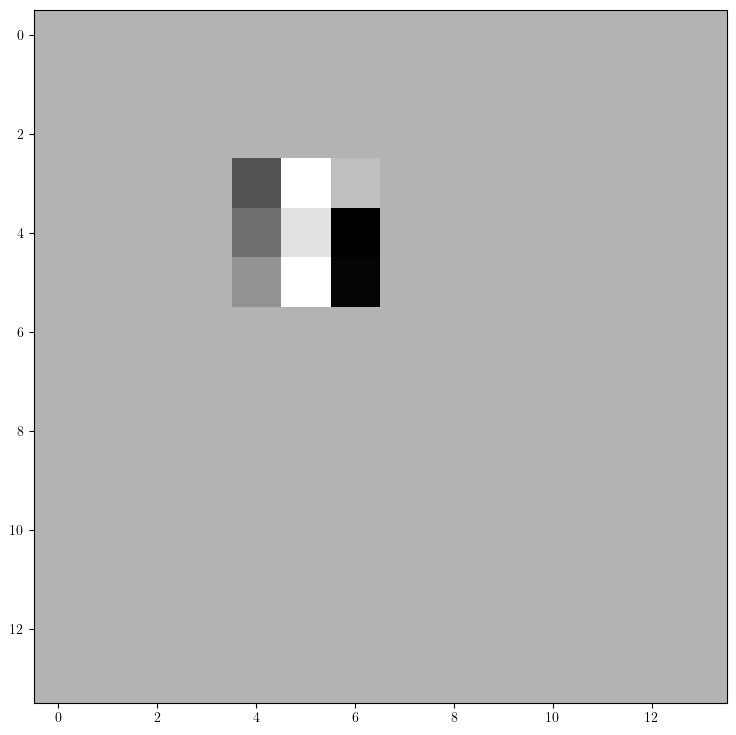

In [25]:
M = np.zeros_like(X_i, dtype=bool)
M[3:6, 4:7] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [26]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

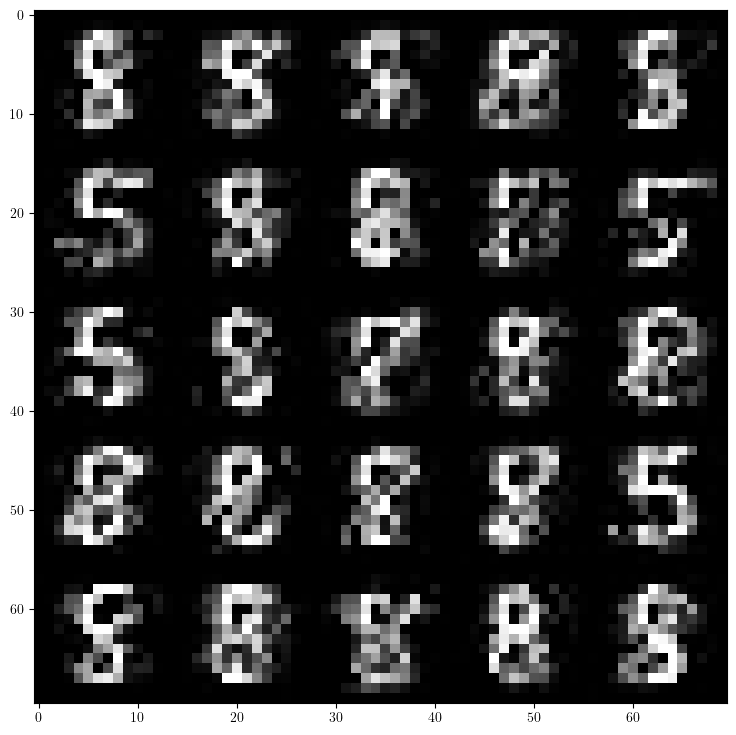

In [27]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 176

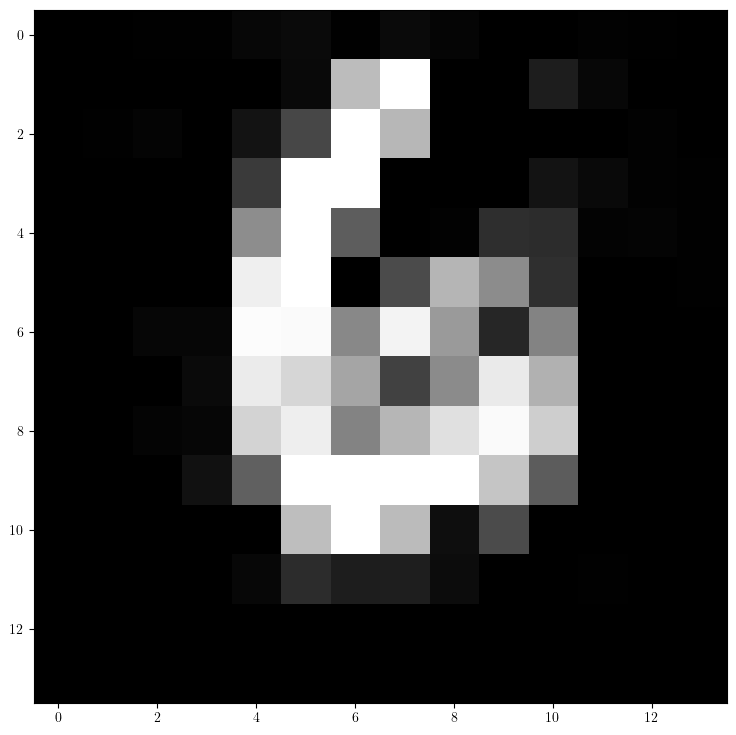

In [28]:
idx = 176

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

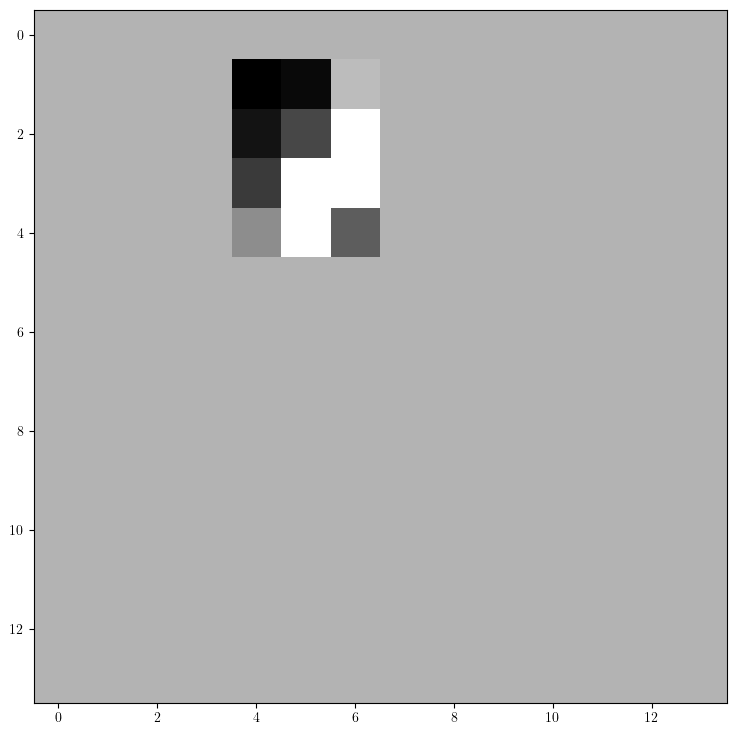

In [29]:
M = np.zeros_like(X_i, dtype=bool)
M[1:5, 4:7] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [30]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

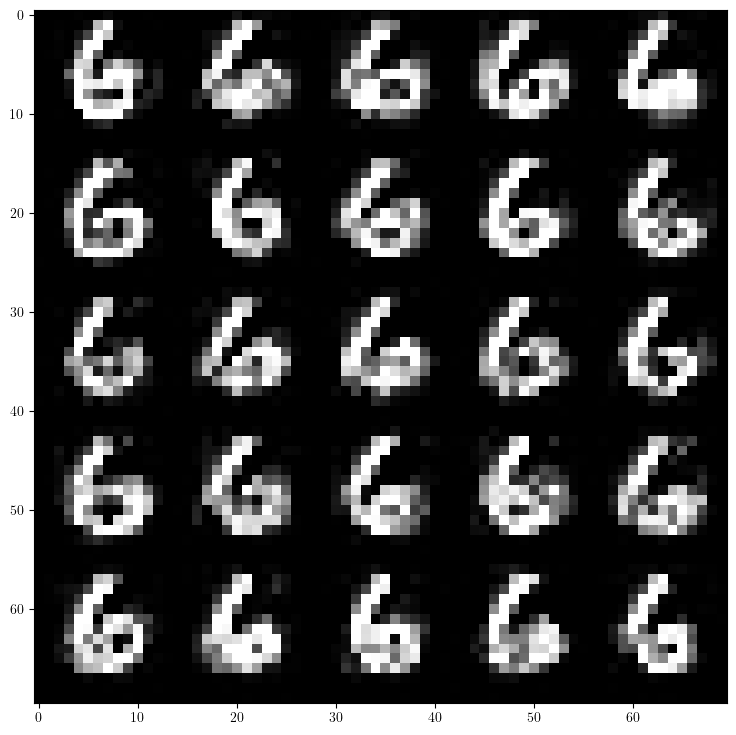

In [31]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 176

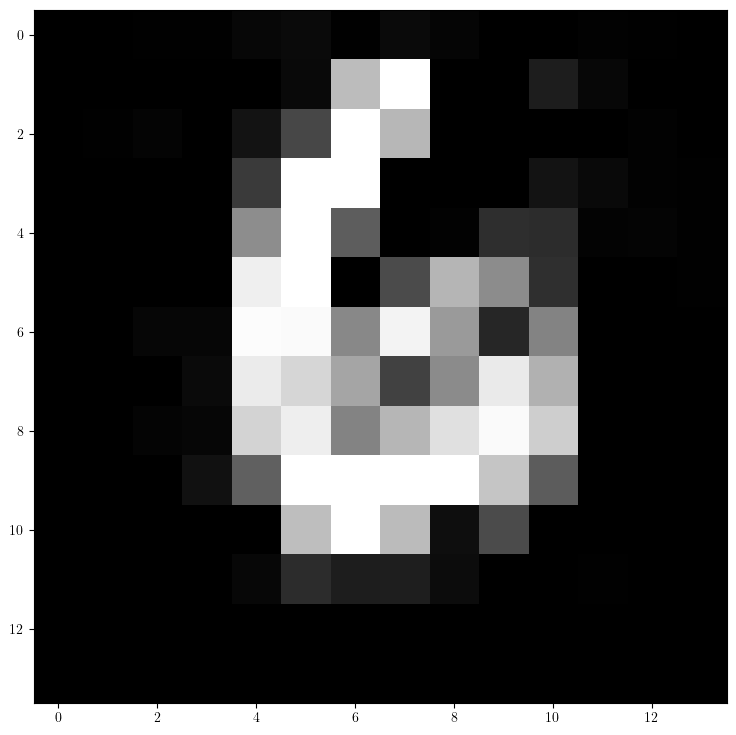

In [32]:
idx = 176

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

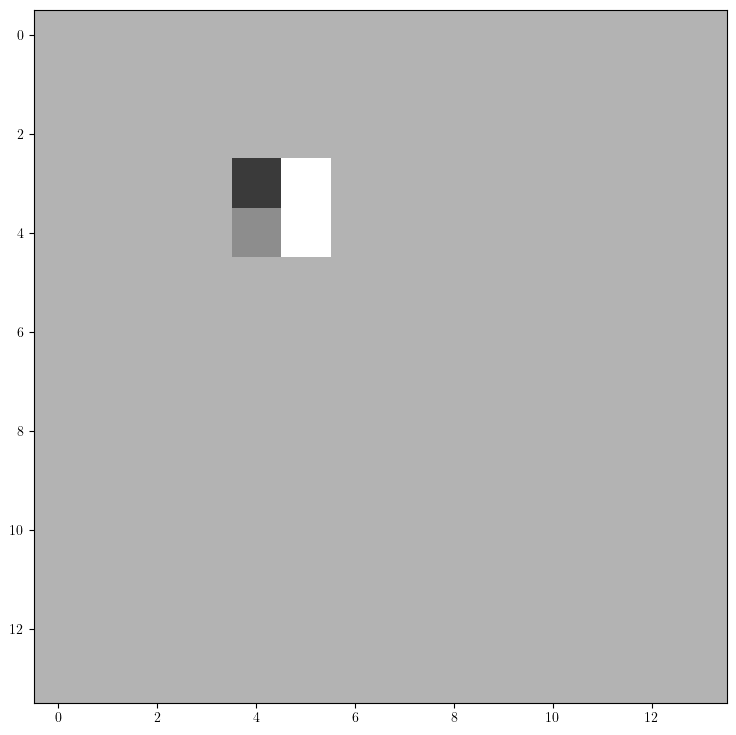

In [33]:
M = np.zeros_like(X_i, dtype=bool)
M[3:5, 4:6] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [34]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

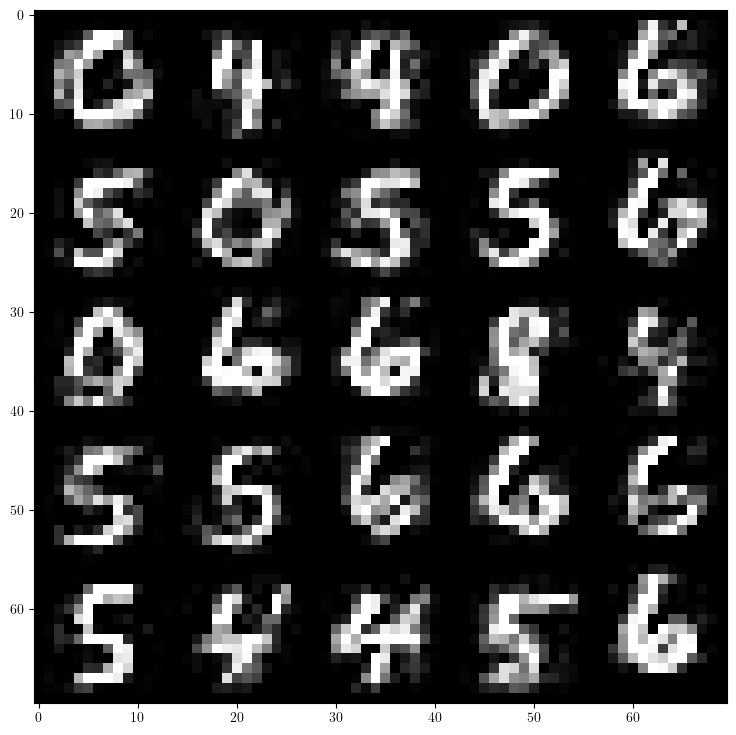

In [35]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 191

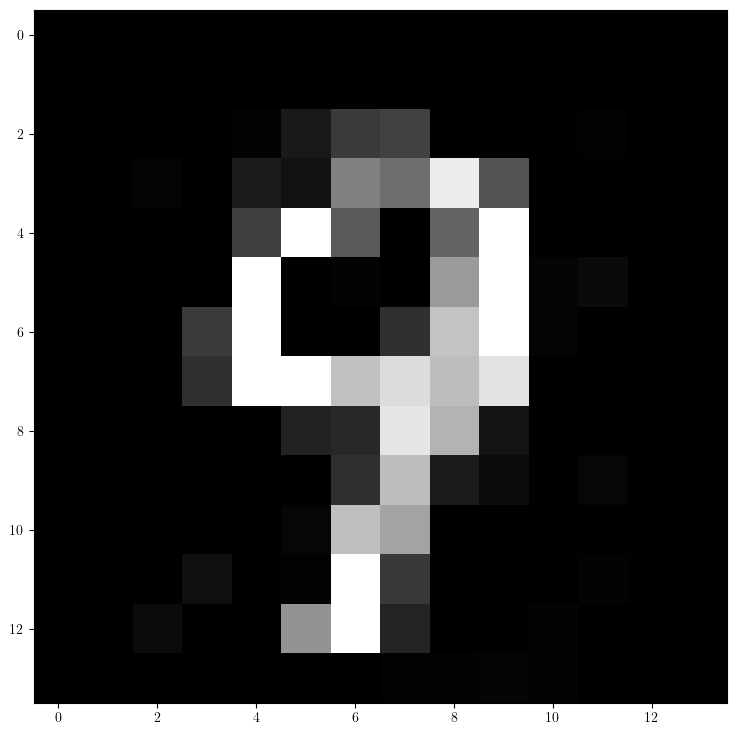

In [36]:
idx = 191

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

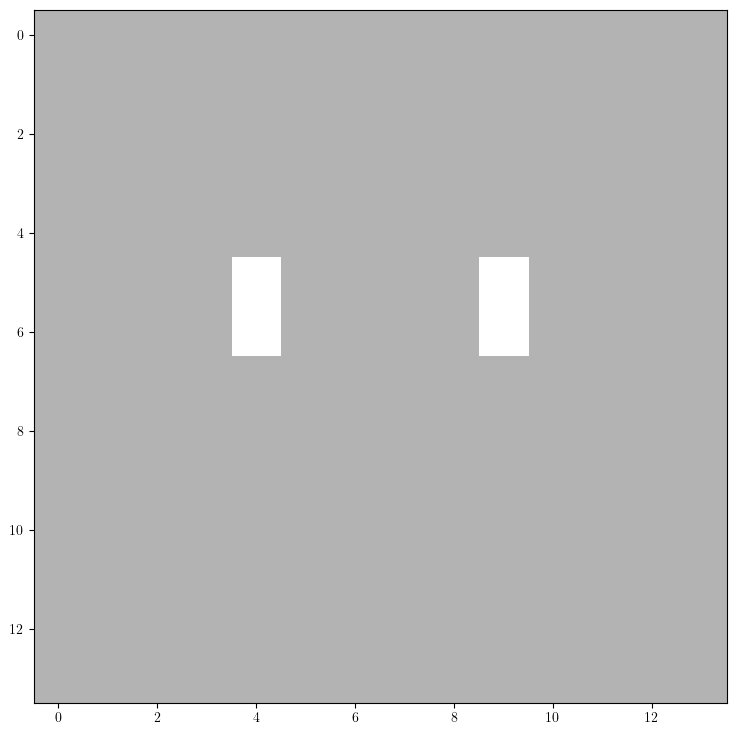

In [37]:
M = np.zeros_like(X_i, dtype=bool)
M[5:7, 4:5] = 1
M[5:7, 9:10] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [38]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False,  True, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

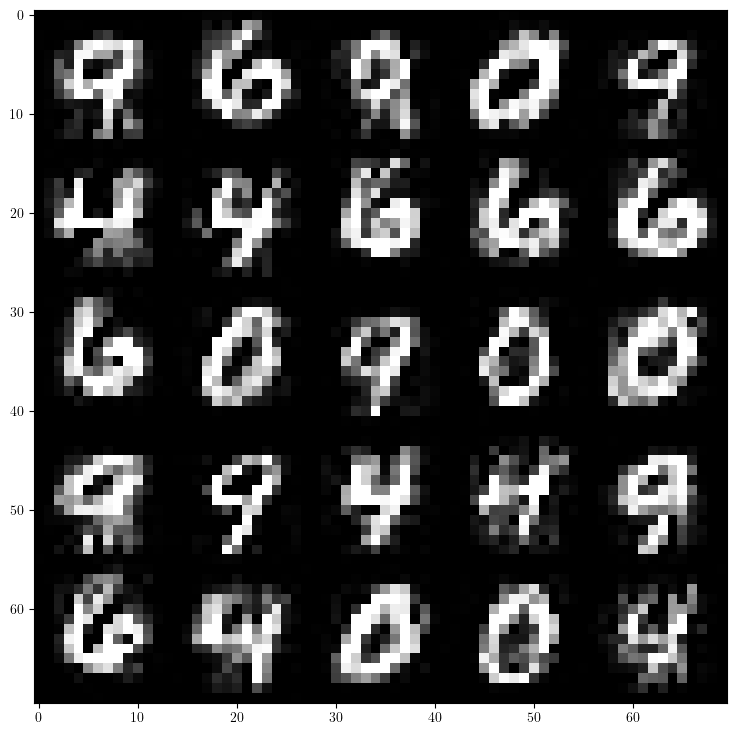

In [39]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 225

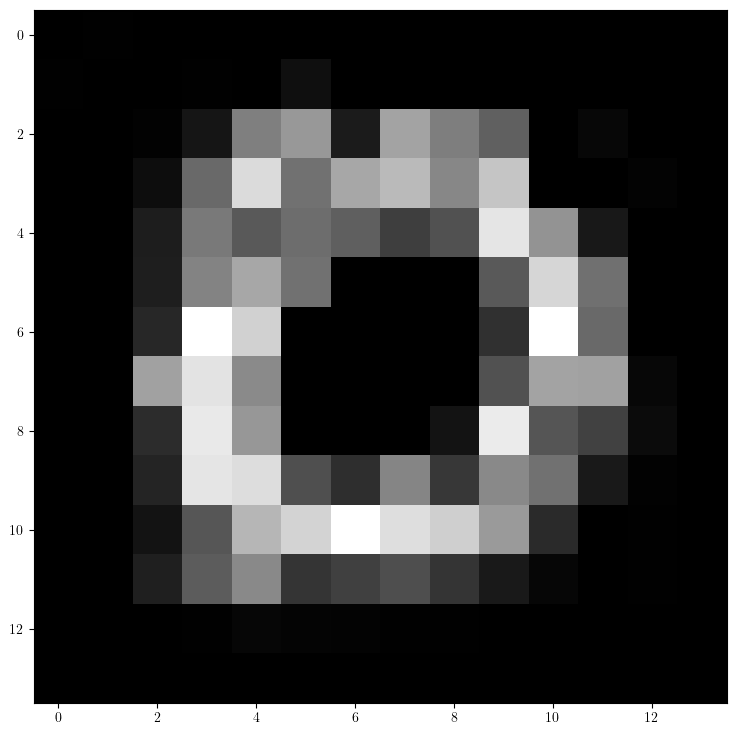

In [40]:
idx = 225

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

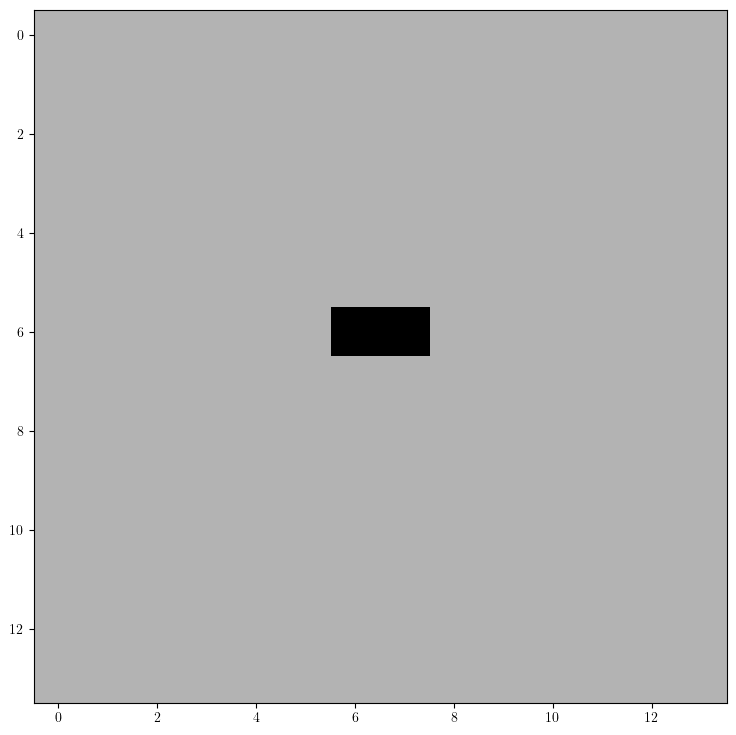

In [41]:
M = np.zeros_like(X_i, dtype=bool)
M[6:7, 6:8] = 1
# M[0:1, 0:1] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [42]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

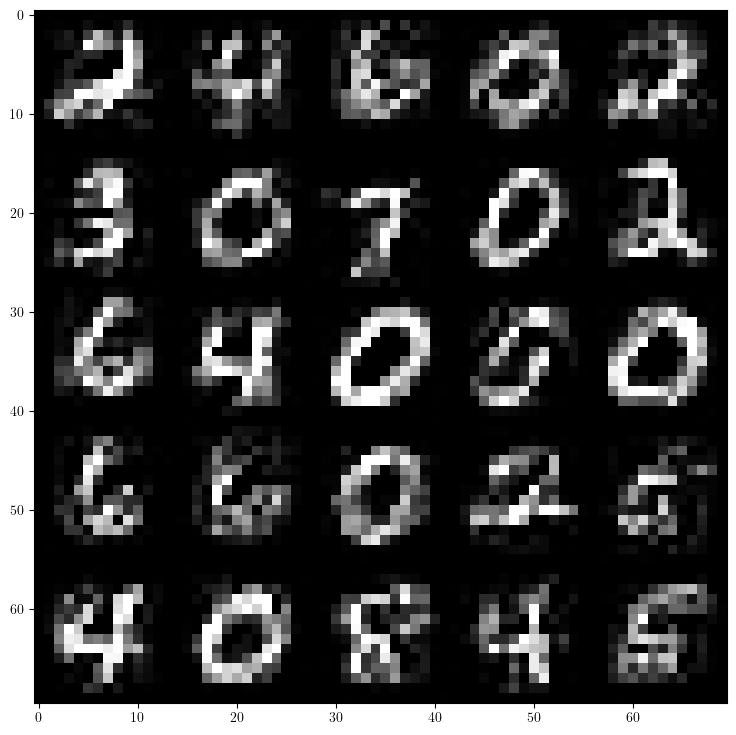

In [43]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

### Sample 229

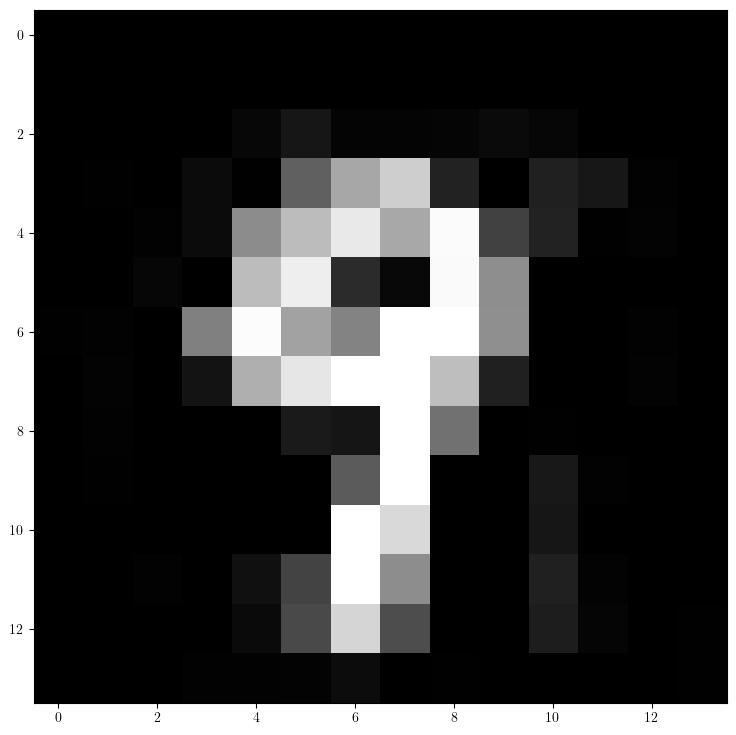

In [44]:
idx = 229

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

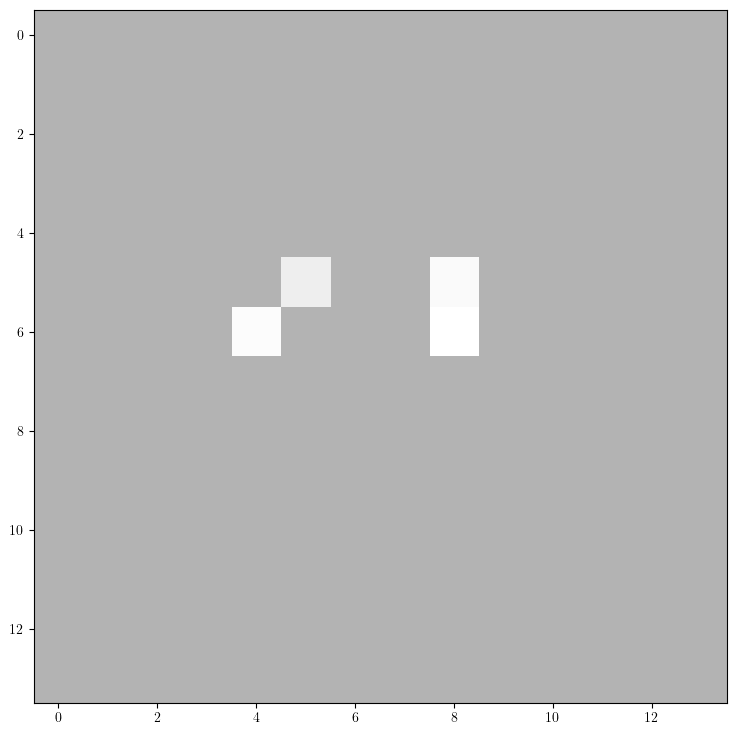

In [45]:
M = np.zeros_like(X_i, dtype=bool)
M[6:7, 4:5] = 1
M[5:6, 5:6] = 1
M[5:7, 8:9] = 1

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i*M + ~M*0.7, vmin=0, vmax=1, cmap='gray')

In [46]:
M.reshape(-1)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False,  True, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

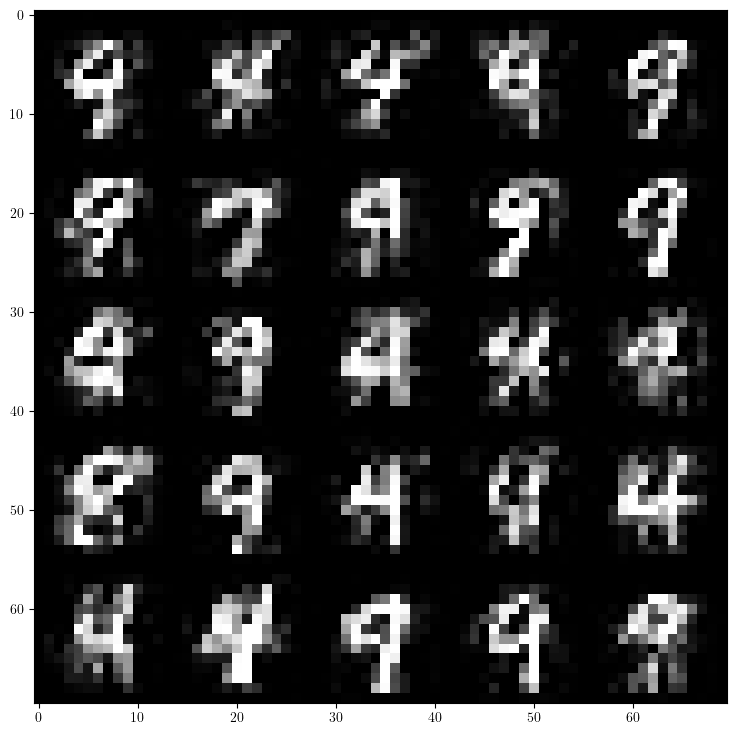

In [47]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]
M = torch.tensor(M)
M = M.flatten()[None, :]

num_samples = 25

comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
    compute_conditional_mog_parameters(X_i, M, comp_log_probs, means, covs)

X_imp = sample_sparse_mog(num_samples, M, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

X_imp = asnumpy(X_i*M + X_imp*~M)

X_imp = dataset.postprocess(X_imp)
X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_imp, cmap='gray')

## Imputations  v1

In [35]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG+SGDMAPInit (enc-fowkl)': 'vae_convresnet3_enc_finetune_fowkl_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+H+SGDMapInit (enc-fowkl)': 'vae_convresnet3_enc_finetune_fowkl_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
#     'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
#     'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG (enc-fowkl)': 'vae_convresnet3_enc_finetune_fowkl_k5_irwg_i1_dmis_gr_mult',
#     'IRWG+SGDMapInit': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_sgdmap_init',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
#     'IRWG K=4 R=1 (enc-fowkl)': 'vae_convresnet3_enc_finetune_fowkl_k4_irwg_i1_dmis_gr_mult_replenish1',
}

imps_all = {}
for name, dir_name in models.items():
    imps_all[name] = load_imputations(path_template.format(dir_name))
    
irwg_resampled_models = {
#     'IRWG FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_finalresample',
#     'IRWG K=5 *20 FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20_finalresample',
#     'IRWG K=4 R=1 FRS': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample'
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample'
}

for name, dir_name in irwg_resampled_models.items():
    imps_all[name] = load_imputations_irwg_resampled(path_template.format(dir_name))

dict_keys(['Pseudo-Gibbs', 'MWG', "MWG$'$", 'AC-MWG', 'LAIR'])


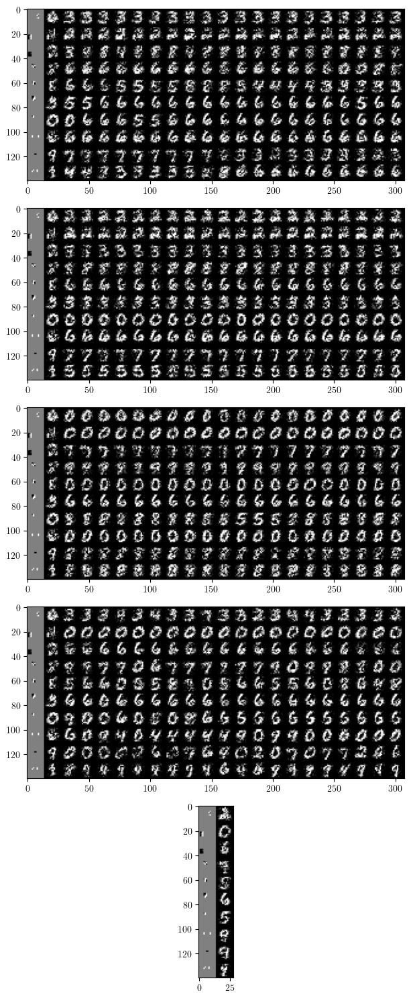

In [36]:
img_dims = (14,14)

selected_imps_all = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = imps[:, ::500, 0, :]
    imps = np.reshape(imps, imps.shape[:-1] + img_dims)
    selected_imps = rearrange(imps, 'n t h w -> (n h) (t w)')
    selected_imps = dataset.postprocess(selected_imps)
    true_X = true_X[:, 0, ...]
    true_X = np.reshape(true_X, true_X.shape[:-1] + img_dims)
    true_X = rearrange(true_X, 'n h w -> (n h) w')
    true_X = dataset.postprocess(true_X)
    masks = masks[:, 0, ...]
    masks = np.reshape(masks, masks.shape[:-1] + img_dims)
    masks = rearrange(masks, 'n h w -> (n h) w')
    true_X[np.isnan(true_X)] = 0.5
    masked_X = true_X * masks + 0.5*(~masks)

    imps = np.concatenate([true_X, selected_imps], axis=1)
    selected_imps_all[model] = imps


fig, axes = plt.subplots(len(imps_all), 1, figsize=(15, 15), sharey=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, (model, imps) in enumerate(selected_imps_all.items()):
    axes[i].imshow(imps, cmap='gray', vmin=0, vmax=1)
    
print(selected_imps_all.keys())

fig.tight_layout()

### Imputation mean and std

In [37]:
imp_means = {}
imp_stds = {}
imp_masks = {}
imp_true = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = rearrange(imps, 'b t k d -> b (t k) d')
    imp_means[model] = imps.mean(axis=1)
    imp_stds[model] = dataset.clip_unconstrained_samples_to_unconstraineddatarange(imps).std(axis=1, ddof=1)
#     imp_stds[model] = imps.std(axis=1, ddof=1)
    imp_masks[model] = masks
    true_X[np.isnan(true_X)] = 0.
    imp_true[model] = true_X

In [38]:
def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(3+px_width, 8-px_width, 9+px_width, colors='r')
    axes[0].hlines(7+px_width, 8-px_width, 9+px_width, colors='r')
    axes[0].vlines(7+px_width, 4-px_width, 7+px_width, colors='r')
    axes[0].vlines(9+px_width, 4-px_width, 7+px_width, colors='r')
    
    axes[1].hlines(6+px_width, 1-px_width, 3+px_width, colors='r')
    axes[1].hlines(10+px_width, 1-px_width, 3+px_width, colors='r')
    axes[1].vlines(0+px_width, 7-px_width, 10+px_width, colors='r')
    axes[1].vlines(3+px_width, 7-px_width, 10+px_width, colors='r')
    
    axes[2].hlines(6+px_width, 1-px_width, 3+px_width, colors='r')
    axes[2].hlines(10+px_width, 1-px_width, 3+px_width, colors='r')
    axes[2].vlines(0+px_width, 7-px_width, 10+px_width, colors='r')
    axes[2].vlines(3+px_width, 7-px_width, 10+px_width, colors='r')
    
    axes[3].hlines(2+px_width, 4-px_width, 6+px_width, colors='r')
    axes[3].hlines(5+px_width, 4-px_width, 6+px_width, colors='r')
    axes[3].vlines(3+px_width, 3-px_width, 5+px_width, colors='r')
    axes[3].vlines(6+px_width, 3-px_width, 5+px_width, colors='r')
    
    axes[4].hlines(2+px_width, 4-px_width, 6+px_width, colors='r')
    axes[4].hlines(5+px_width, 4-px_width, 6+px_width, colors='r')
    axes[4].vlines(3+px_width, 3-px_width, 5+px_width, colors='r')
    axes[4].vlines(6+px_width, 3-px_width, 5+px_width, colors='r')
    
    axes[5].hlines(0+px_width, 4-px_width, 6+px_width, colors='r')
    axes[5].hlines(4+px_width, 4-px_width, 6+px_width, colors='r')
    axes[5].vlines(3+px_width, 1-px_width, 4+px_width, colors='r')
    axes[5].vlines(6+px_width, 1-px_width, 4+px_width, colors='r')
    
    axes[6].hlines(2+px_width, 4-px_width, 5+px_width, colors='r')
    axes[6].hlines(4+px_width, 4-px_width, 5+px_width, colors='r')
    axes[6].vlines(3+px_width, 3-px_width, 4+px_width, colors='r')
    axes[6].vlines(5+px_width, 3-px_width, 4+px_width, colors='r')
    
    axes[7].hlines(4+px_width, 4-px_width, 4+px_width, colors='r')
    axes[7].hlines(6+px_width, 4-px_width, 4+px_width, colors='r')
    axes[7].vlines(3+px_width, 5-px_width, 6+px_width, colors='r')
    axes[7].vlines(4+px_width, 5-px_width, 6+px_width, colors='r')
    axes[7].hlines(4+px_width, 9-px_width, 9+px_width, colors='r')
    axes[7].hlines(6+px_width, 9-px_width, 9+px_width, colors='r')
    axes[7].vlines(8+px_width, 5-px_width, 6+px_width, colors='r')
    axes[7].vlines(9+px_width, 5-px_width, 6+px_width, colors='r')
    
    axes[8].hlines(5+px_width, 6-px_width, 7+px_width, colors='r')
    axes[8].hlines(6+px_width, 6-px_width, 7+px_width, colors='r')
    axes[8].vlines(5+px_width, 6-px_width, 6+px_width, colors='r')
    axes[8].vlines(7+px_width, 6-px_width, 6+px_width, colors='r')
    
    axes[9].hlines(4+px_width, 5-px_width, 5+px_width, colors='r')
    axes[9].hlines(5+px_width, 5-px_width, 5+px_width, colors='r')
    axes[9].vlines(4+px_width, 5-px_width, 5+px_width, colors='r')
    axes[9].vlines(5+px_width, 5-px_width, 5+px_width, colors='r')
    axes[9].hlines(5+px_width, 4-px_width, 4+px_width, colors='r')
    axes[9].hlines(6+px_width, 4-px_width, 4+px_width, colors='r')
    axes[9].vlines(3+px_width, 6-px_width, 6+px_width, colors='r')
    axes[9].vlines(4+px_width, 6-px_width, 6+px_width, colors='r')
    axes[9].hlines(4+px_width, 8-px_width, 8+px_width, colors='r')
    axes[9].hlines(6+px_width, 8-px_width, 8+px_width, colors='r')
    axes[9].vlines(7+px_width, 5-px_width, 6+px_width, colors='r')
    axes[9].vlines(8+px_width, 5-px_width, 6+px_width, colors='r')
    

#### Ground truth

/tmp/ipykernel_895468/2725191358.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


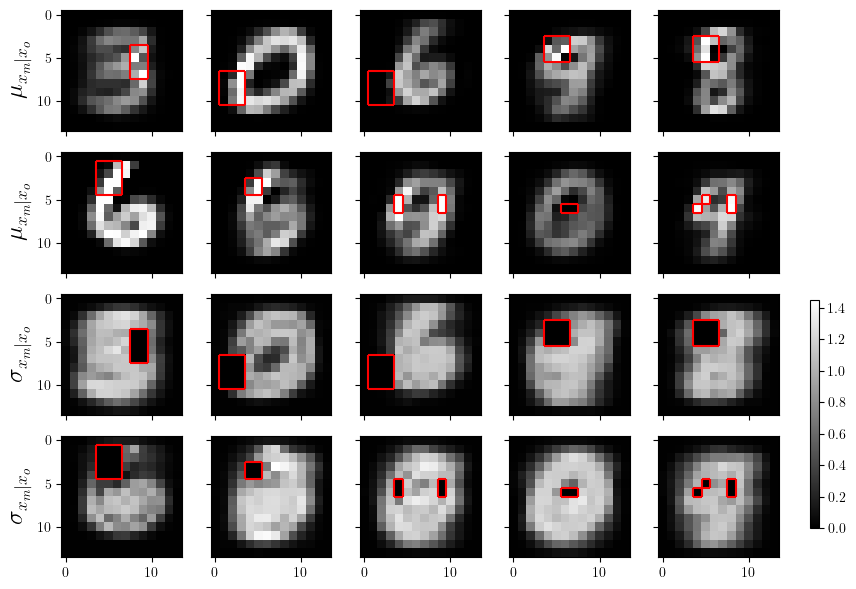

In [39]:
idxs = np.arange(0, 10)
num_samples=10000

# Compute true parameters that are the same for all models/methods
model = list(imps_all.keys())[0]
all_stds = []
all_means = []
for idx in idxs:
    X_i = imp_true[model][idx]
    X_i = torch.tensor(X_i)
    M_i = imp_masks[model][idx]
    M_i = torch.tensor(M_i)

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)
    
    X_imp = sample_sparse_mog(num_samples, M_i, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)
    X_imp = X_imp[0]
    
    mean = X_imp.mean(axis=0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    stds = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_imp).std(axis=0, unbiased=True)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

    all_stds.append(stds)
    all_means.append(mean)

true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# true_all_means = dataset.postprocess(true_all_means)

# Maximum std
std_max = np.max(true_all_stds)

# Plot true figure
fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(9, 6), sharex=True, sharey=True)
axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)
axes[0][5].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)
axes[1][5].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

#### Sampler mean and standard deviation

In [40]:
idxs = np.arange(0, 10)

fig = None
frames = []

###### Plot true MoG
artists = []
frames.append(artists)

fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(9, 6), sharex=True, sharey=True)
axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]
for axes_ in axes:
        artists.extend(axes_)
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)
axes[0][5].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
artists.append(cbar_ax)
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)
axes[1][5].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

title = plt.text(0.5, 0.95, 'MoG', 
                 horizontalalignment='center', 
                 verticalalignment='bottom', 
                 transform=fig.transFigure, 
                 fontsize=18)
artists.append(title)


###### Plot methods
for model in imps_all.keys():
    artists = []
    frames.append(artists)
    
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig_id = None
    if fig is not None:
        fig_id = fig.number
    fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(9, 6), sharex=True, sharey=True, num=fig_id)
    axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]
    for axes_ in axes:
        artists.extend(axes_)
    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)
    axes[0][5].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    artists.append(cbar_ax)
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)
    axes[1][5].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

#     title = fig.suptitle(model, fontsize=18)
    title = plt.text(0.5, 0.95, model, 
                     horizontalalignment='center', 
                     verticalalignment='bottom', 
                     transform=fig.transFigure, 
                     fontsize=18)
    artists.append(title)
# fig.tight_layout(rect=[0, 0, .9, 1])
    
anim = ArtistAnimation(fig, frames)
plt.close(fig)

video = anim.to_jshtml()
# Alternative, but low-resolution
# video = anim.to_html5_video()
html = display.HTML(video)
display.display(html)

##### Paper figure

/tmp/ipykernel_895468/2431624253.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .95, 0.95])
/tmp/ipykernel_895468/2431624253.py:84: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .95, 0.95])


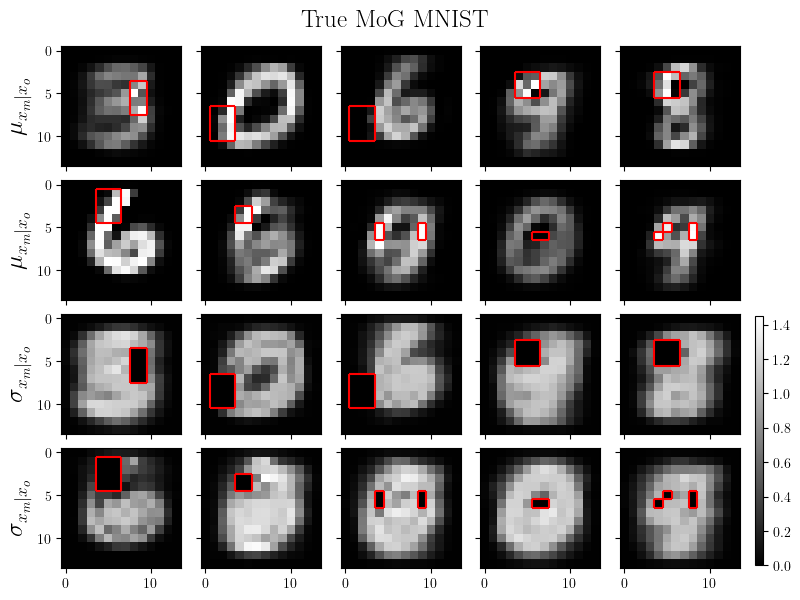

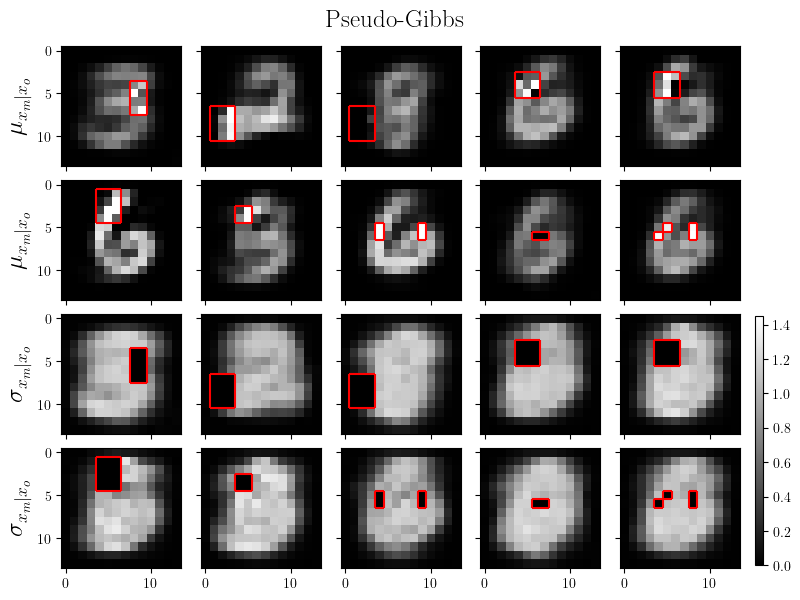

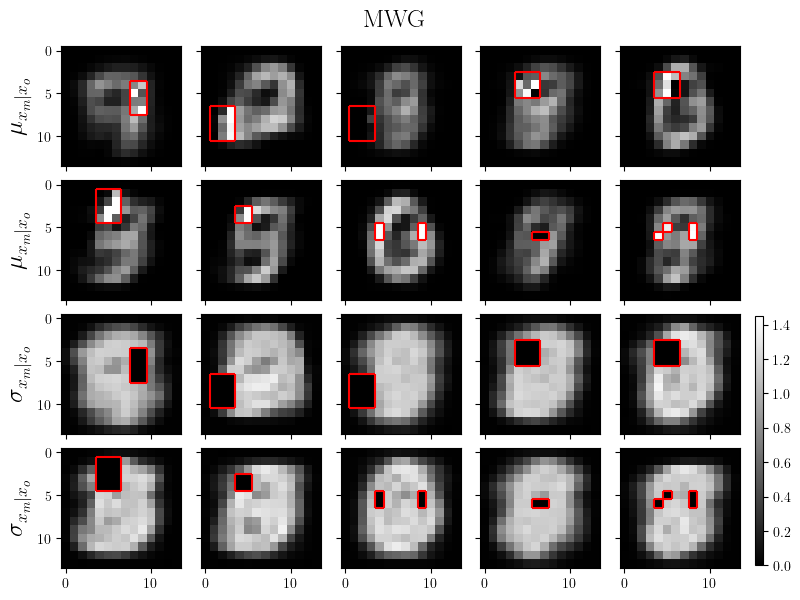

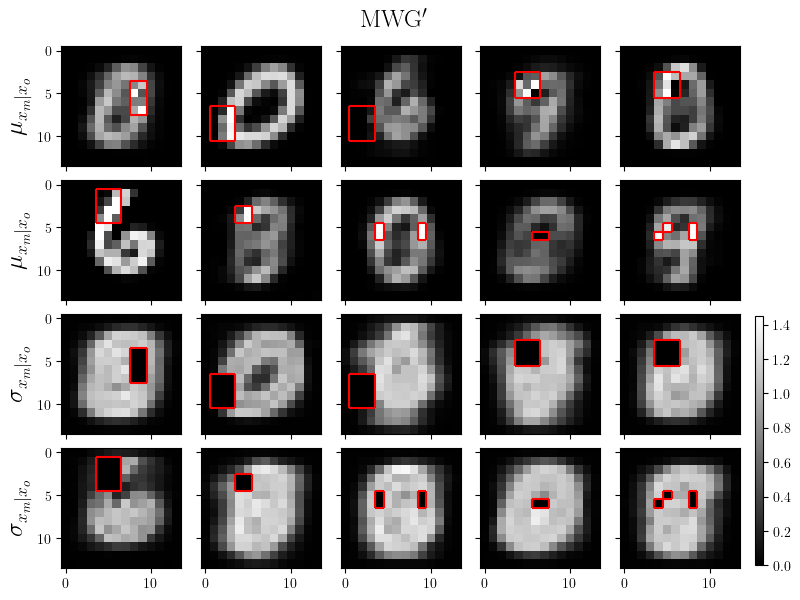

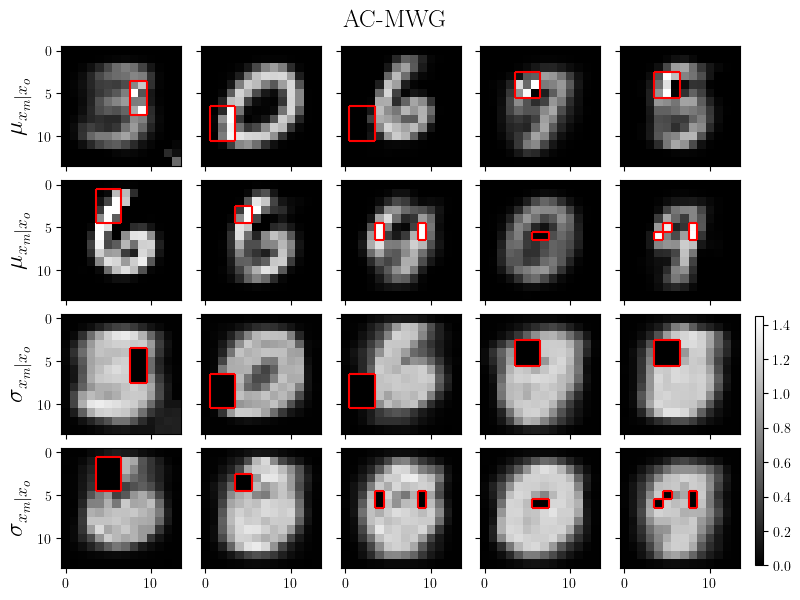

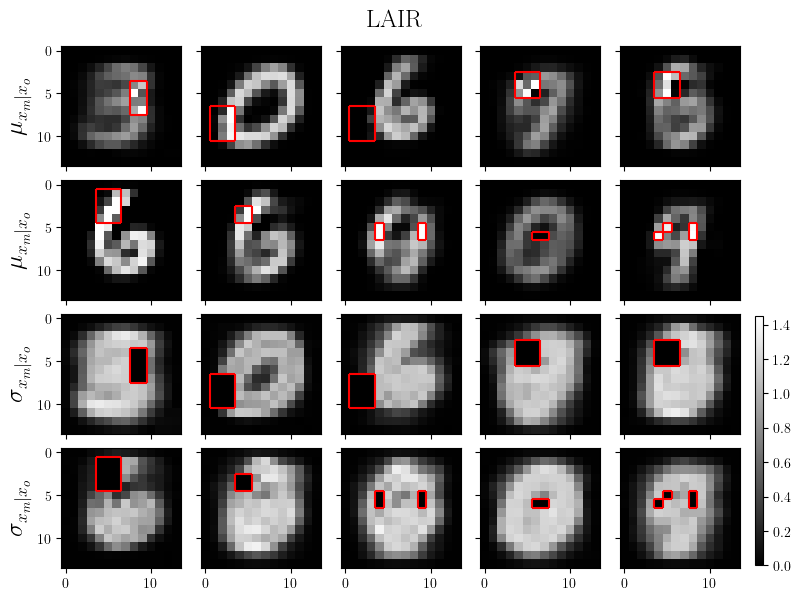

In [41]:
idxs = np.arange(0, 10)

###### Plot true MoG
fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(8, 6), sharex=True, sharey=True)
axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]

for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)
axes[0][5].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.95, 0.06, 0.01, 0.415])
fig.colorbar(im, cax=cbar_ax)

axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)
axes[1][5].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

title = plt.text(0.5, 0.95, 'True MoG MNIST', 
                 horizontalalignment='center', 
                 verticalalignment='bottom', 
                 transform=fig.transFigure, 
                 fontsize=18)

fig.tight_layout(rect=[0, 0, .95, 0.95])

fig.savefig('figures/mnist_gmm_cond_mean_and_std_groundtruth.pdf')

# ###### Plot methods
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(8, 6), sharex=True, sharey=True)
    axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]

    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)
    axes[0][5].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.95, 0.06, 0.01, 0.415])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)
    axes[1][5].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

#     title = fig.suptitle(model, fontsize=18)
    title = plt.text(0.5, 0.95, model, 
                     horizontalalignment='center', 
                     verticalalignment='bottom', 
                     transform=fig.transFigure, 
                     fontsize=18)
    fig.tight_layout(rect=[0, 0, .95, 0.95])
    
#     fig.savefig(f'figures/mnist_gmm_cond_mean_and_std_{model}.pdf')
    

#### Error in the mean and standard deviation

In [42]:
idxs = np.arange(0, 10)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds) #/ (0.5*(true_all_stds[None, :]+all_model_stds))

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


fig = None
frames = []

for m, model in enumerate(imps_all.keys()):
    artists = []
    frames.append(artists)
    
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig_id = None
    if fig is not None:
        fig_id = fig.number
    fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(9, 6), sharex=True, sharey=True, num=fig_id)
    axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]
    for axes_ in axes:
        artists.extend(axes_)
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
    artists.append(cbar_ax)
    fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)
    axes[0][5].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    artists.append(cbar_ax)
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)
    axes[1][5].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)

#     fig.suptitle(model, fontsize=18)
    title = plt.text(0.5, 0.95, model, 
                     horizontalalignment='center', 
                     verticalalignment='bottom', 
                     transform=fig.transFigure, 
                     fontsize=18)
    artists.append(title)
# fig.tight_layout(rect=[0, 0, .9, 1])

anim = ArtistAnimation(fig, frames)
plt.close(fig)

video = anim.to_jshtml()
# Alternative, but low-resolution
# video = anim.to_html5_video()
html = display.HTML(video)
display.display(html)

##### Paper figure

/tmp/ipykernel_895468/1834543804.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.04, 0, .95, 0.95])


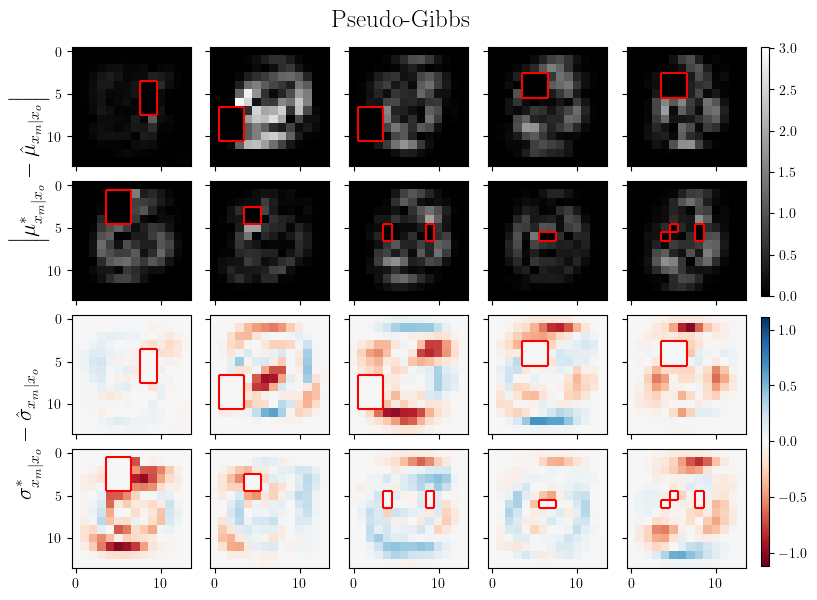

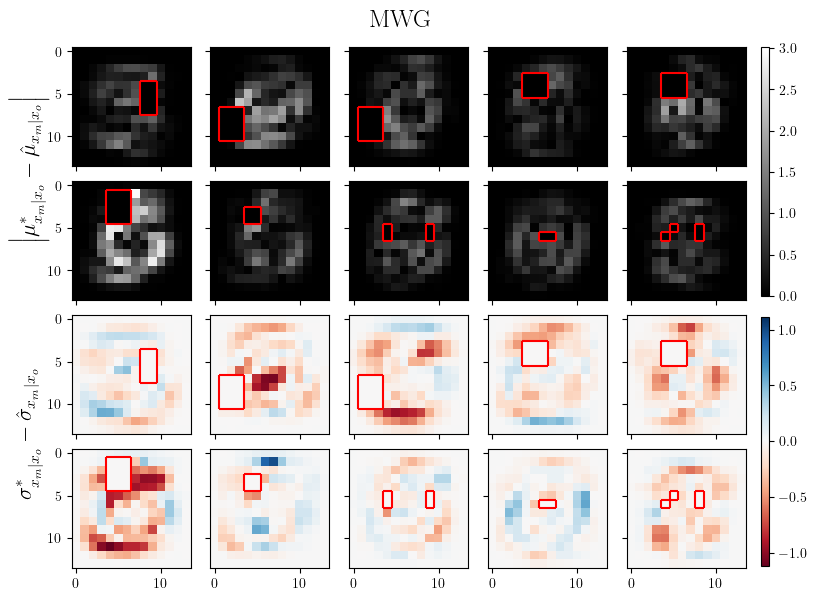

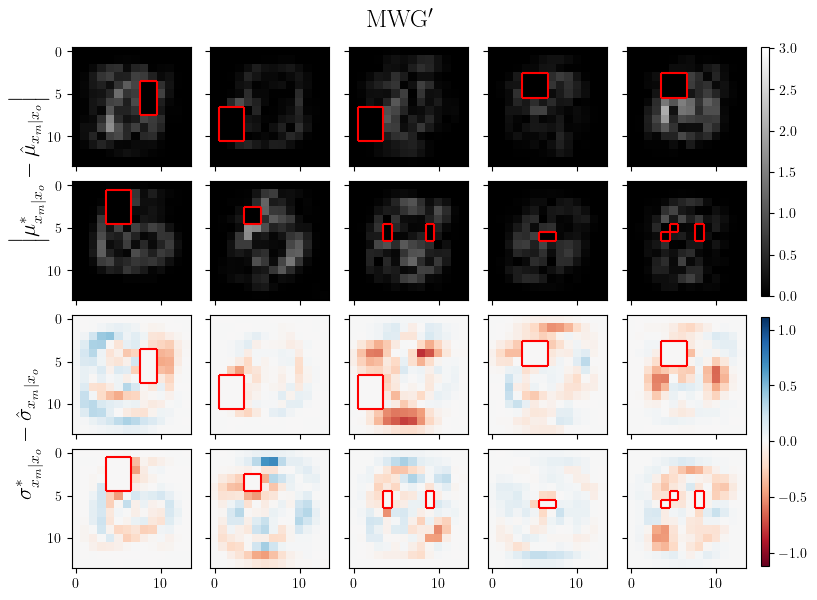

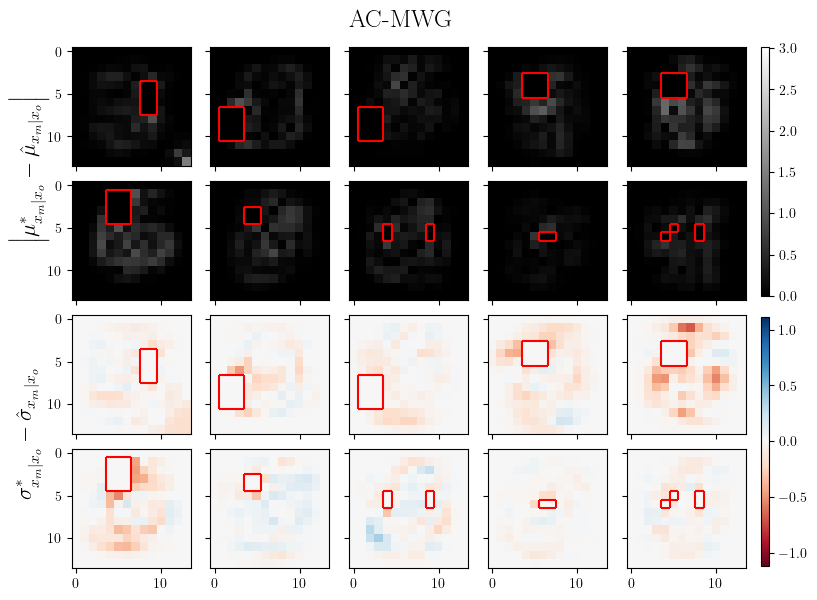

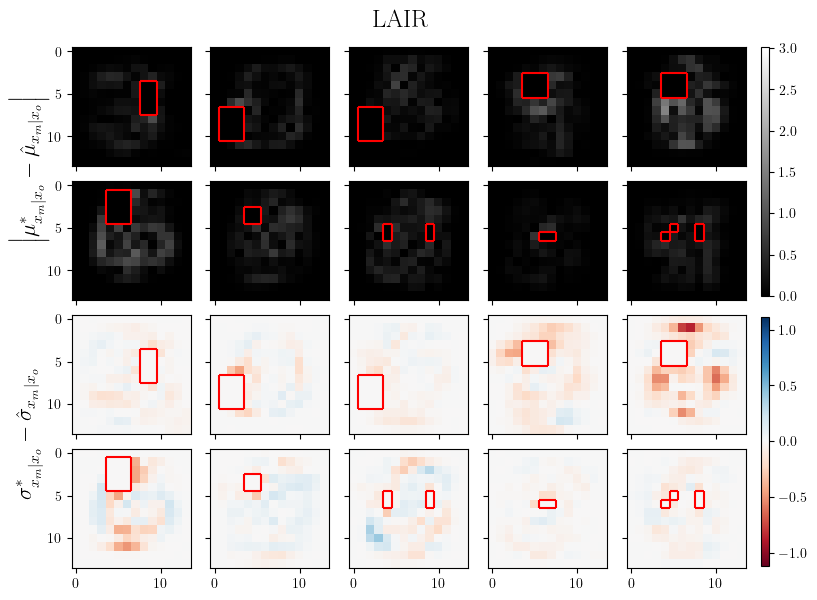

In [43]:
idxs = np.arange(0, 10)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds) #/ (0.5*(true_all_stds[None, :]+all_model_stds))

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


for m, model in enumerate(imps_all.keys()):
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig, axes = plt.subplots(4, int(len(idxs)/2), figsize=(8, 6), sharex=True, sharey=True)
    axes = [[*axes[0], *axes[1]], [*axes[2], *axes[3]]]
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.95, 0.51, 0.01, 0.415])
    fig.colorbar(im, cax=cbar_ax)
#     axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)
#     axes[0][5].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)
    fig.text(-0.35, 0., '$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$',
             horizontalalignment='center', verticalalignment='center', rotation='vertical',
             fontsize=16,
             transform=axes[0][0].transAxes)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.95, 0.06, 0.01, 0.415])
    fig.colorbar(im, cax=cbar_ax)
#     axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)
#     axes[1][5].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)
    fig.text(-0.35, 0., '$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$',
             horizontalalignment='center', verticalalignment='center', rotation='vertical',
             fontsize=16,
             transform=axes[1][0].transAxes)

#     fig.suptitle(model, fontsize=18)
    title = plt.text(0.5, 0.95, model, 
                     horizontalalignment='center', 
                     verticalalignment='bottom', 
                     transform=fig.transFigure, 
                     fontsize=18)
    artists.append(title)
    fig.tight_layout(rect=[0.04, 0, .95, 0.95])
    
#     fig.savefig(f'figures/mnist_gmm_err_cond_mean_and_std_{model}.pdf')


## Imputation distribution metrics vs iterations

### Imputations MoGs

In [12]:
path_template = f'../logs/{ds}/imputation/mog_fitting/{{}}/seed_m20220118_d20220118/lightning_logs'

# models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
# #     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
# }
models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

num_iters = defaultdict(lambda: [100, 500, 1000, 5000, 10000])
num_iters['MWGM+H K=100'] = [50, 200, 500]
num_iters['IRWG K=5 *20 (old)'] = [50, 200, 500]

klfows = {}
klrevs = {}
jsds = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd = load_mog_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd

In [147]:
# num_datapoints = 10
# plot_log_log = False

# fig, axes = plt.subplots(10, 3, figsize=(10, 15), sharex=True)
# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
# colors += ['r', 'b']



# for i, model in enumerate(klfows.keys()):
#     for data_idx in range(num_datapoints):
#         x = num_iters[model]
#         axes[data_idx, 0].plot(x, klfows[model][data_idx], 
#                                color=colors[i], marker='x', label=model)

#         axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
#                                color=colors[i], marker='x', label=model)

#         axes[data_idx, 2].plot(x, jsds[model][data_idx], 
#                                color=colors[i], marker='x', label=model)
#         axes[data_idx, 0].set_ylabel(data_idx)
#         if plot_log_log:
#             axes[data_idx, 0].set_yscale('log')
#             axes[data_idx, 0].set_xscale('log')
#             axes[data_idx, 1].set_yscale('log')
#             axes[data_idx, 1].set_xscale('log')
#             axes[data_idx, 2].set_yscale('log')
#             axes[data_idx, 2].set_xscale('log')
            
    
# print(klfows.keys())

# axes[0,0].set_title('Forward KL')
# axes[0,1].set_title('Reverse KL')
# axes[0,2].set_title('JSD')

# fig.tight_layout(rect=(0, 0, 1, 0.95))
# axes[0,0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.96), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)


dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


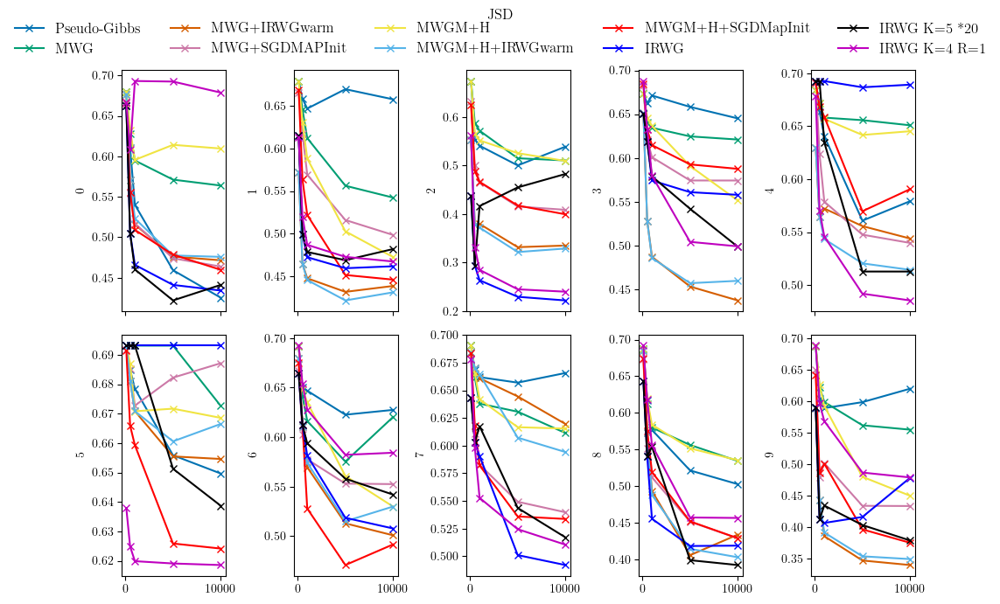

In [13]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(klfows.keys())

fig.suptitle('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


### Imputations supervised MoGs

In [20]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

# models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
# #     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
# }
models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

num_iters = defaultdict(lambda: [100, 500, 1000, 5000, 10000])
num_iters['MWGM+H K=100'] = [50, 200, 500]
num_iters['IRWG K=5 *20 (old)'] = [50, 200, 500]

klfows = {}
klrevs = {}
jsds = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd = load_supervisedmog_compprob_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd

In [147]:
# num_datapoints = 10
# plot_log_log = False

# fig, axes = plt.subplots(10, 3, figsize=(10, 15), sharex=True)
# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
# colors += ['r', 'b']



# for i, model in enumerate(klfows.keys()):
#     for data_idx in range(num_datapoints):
#         x = num_iters[model]
#         axes[data_idx, 0].plot(x, klfows[model][data_idx], 
#                                color=colors[i], marker='x', label=model)

#         axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
#                                color=colors[i], marker='x', label=model)

#         axes[data_idx, 2].plot(x, jsds[model][data_idx], 
#                                color=colors[i], marker='x', label=model)
#         axes[data_idx, 0].set_ylabel(data_idx)
#         if plot_log_log:
#             axes[data_idx, 0].set_yscale('log')
#             axes[data_idx, 0].set_xscale('log')
#             axes[data_idx, 1].set_yscale('log')
#             axes[data_idx, 1].set_xscale('log')
#             axes[data_idx, 2].set_yscale('log')
#             axes[data_idx, 2].set_xscale('log')
            
    
# print(klfows.keys())

# axes[0,0].set_title('Forward KL')
# axes[0,1].set_title('Reverse KL')
# axes[0,2].set_title('JSD')

# fig.tight_layout(rect=(0, 0, 1, 0.95))
# axes[0,0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.96), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)


dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


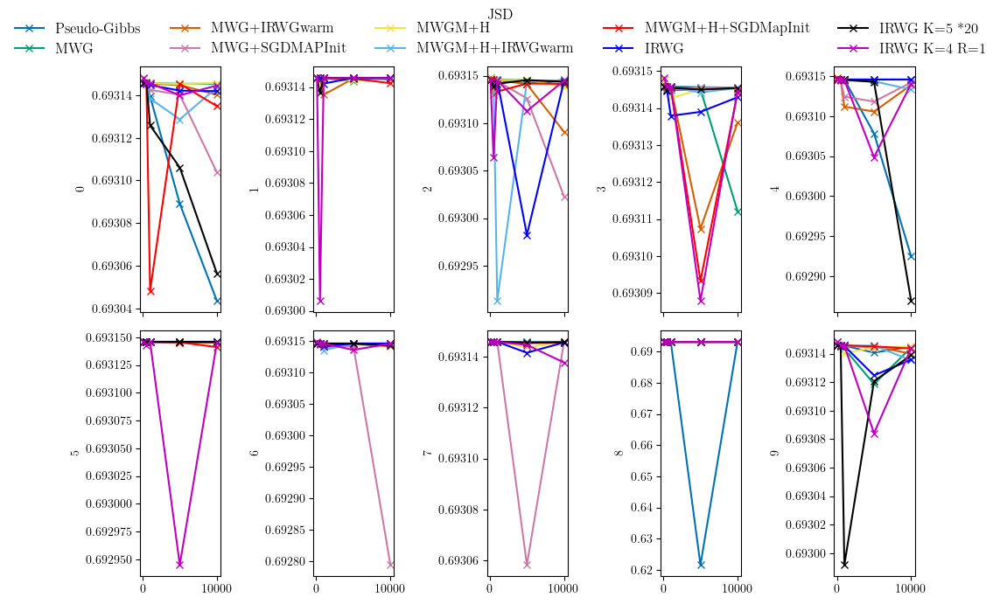

In [21]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(klfows.keys())

fig.suptitle('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


### Imputations supervised MoGs (diag)

In [23]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

# models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
# #     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
# }
models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

num_iters = defaultdict(lambda: [100, 500, 1000, 5000, 10000])
num_iters['MWGM+H K=100'] = [50, 200, 500]
num_iters['IRWG K=5 *20 (old)'] = [50, 200, 500]

klfows = {}
klrevs = {}
jsds = {}
wass = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd, wasserstein = load_supervisedmog_diag_compprob_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd
    wass[model] = wasserstein

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


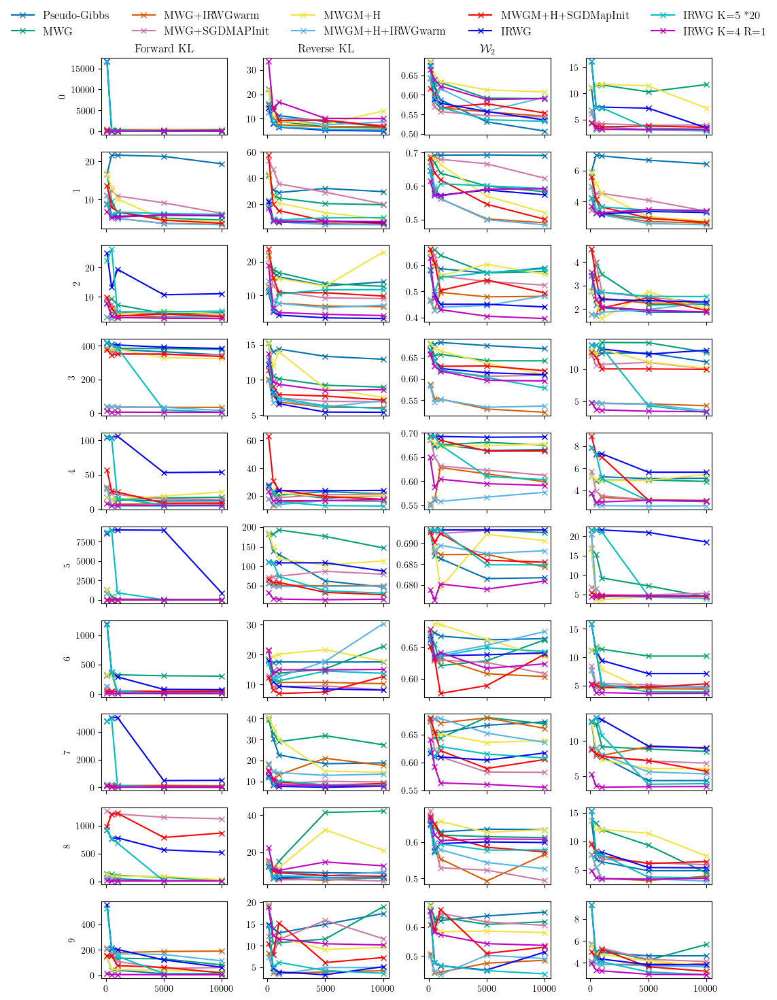

In [25]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(10, 4, figsize=(10, 15), sharex=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'c', 'm']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx, 0].plot(x, klfows[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 2].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx, 3].plot(x, wass[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx, 0].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx, 0].set_yscale('log')
            axes[data_idx, 0].set_xscale('log')
            axes[data_idx, 1].set_yscale('log')
            axes[data_idx, 1].set_xscale('log')
            axes[data_idx, 2].set_yscale('log')
            axes[data_idx, 2].set_xscale('log')
            axes[data_idx, 3].set_yscale('log')
            axes[data_idx, 3].set_xscale('log')
            
    
print(klfows.keys())

axes[0,0].set_title('Forward KL')
axes[0,1].set_title('Reverse KL')
axes[0,2].set_title('JSD')
axes[0,2].set_title('$\mathcal{W}_2$')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0,0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.96), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


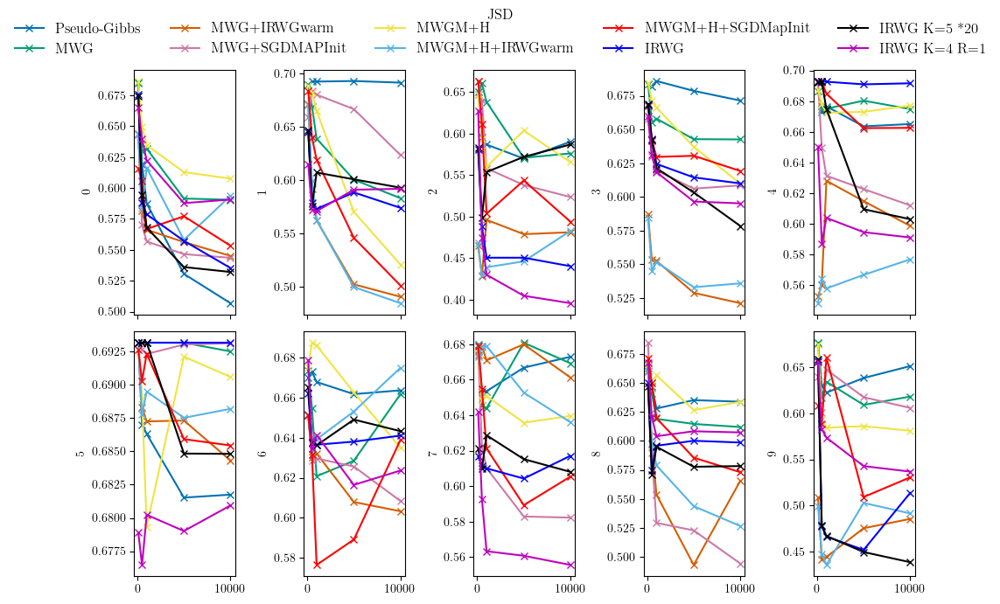

In [26]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(klfows.keys())

fig.suptitle('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


### Imputations $p(z \mid x_o)$

In [57]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
    'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
    'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
    'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

klfows = {}
klrevs = {}
jsds = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd = load_mog_compprob_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'MWGM+RH+005P', 'MWGM+RH+005P+IRWGwarm', 'MWGM+RH+005P+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


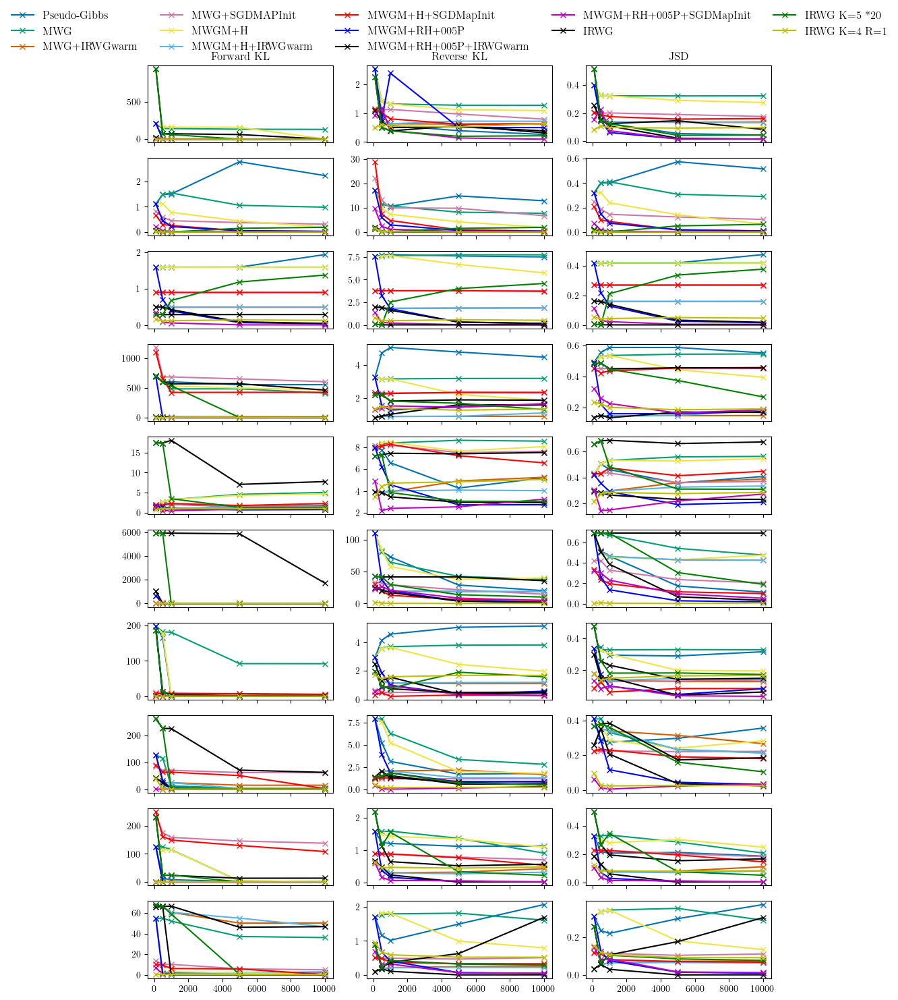

In [59]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(10, 3, figsize=(10, 15), sharex=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y']

x = [100, 500, 1000, 5000, 10000]

for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        axes[data_idx, 0].plot(x, klfows[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 2].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        if plot_log_log:
            axes[data_idx, 0].set_yscale('log')
            axes[data_idx, 0].set_xscale('log')
            axes[data_idx, 1].set_yscale('log')
            axes[data_idx, 1].set_xscale('log')
            axes[data_idx, 2].set_yscale('log')
            axes[data_idx, 2].set_xscale('log')
            
    
print(klfows.keys())

axes[0,0].set_title('Forward KL')
axes[0,1].set_title('Reverse KL')
axes[0,2].set_title('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0,0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.96), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'MWGM+RH+005P', 'MWGM+RH+005P+IRWGwarm', 'MWGM+RH+005P+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


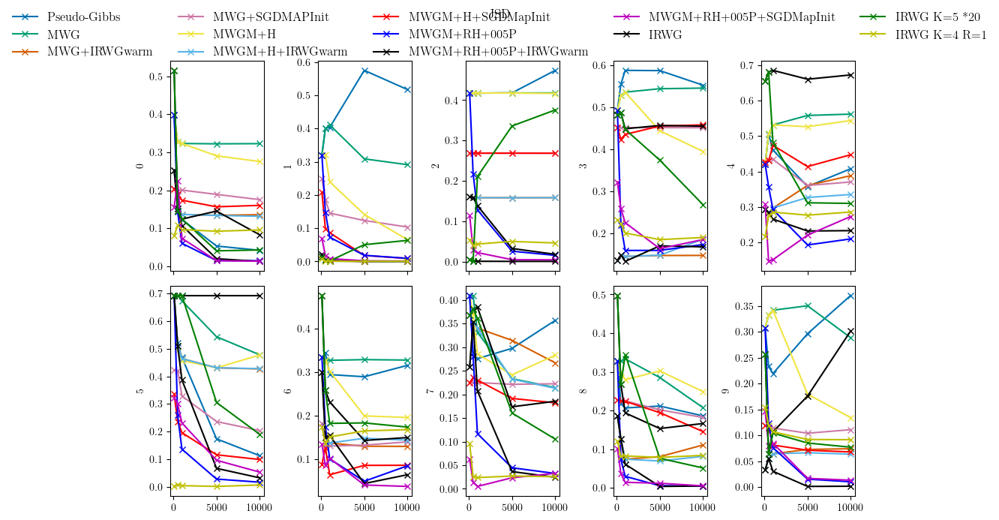

In [60]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(klfows.keys())

fig.suptitle('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


### Imputations FID (classifier)

In [43]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
#     'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
#     'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgdmap_warmup',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

fids = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    fid = load_fid_classifier_results(path)
    fids[model] = fid

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


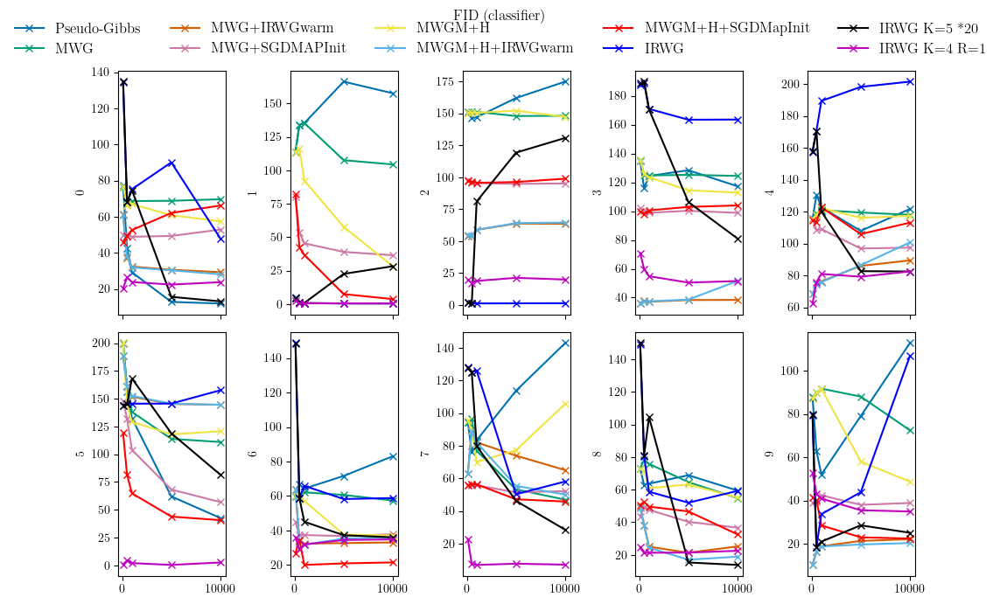

In [39]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, fids[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(klfows.keys())

fig.suptitle('FID (encoder)')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


### Imputations FID (encoder)

In [49]:
path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+IRWGwarm': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
    'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
    'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
    'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
    'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
    'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
#     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
#     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
    'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
    'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

fids = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    fid = load_fid_encoder_results(path)
    fids[model] = fid

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+IRWGwarm', 'MWG+SGDMAPInit', 'MWGM+H', 'MWGM+H+IRWGwarm', 'MWGM+H+SGDMapInit', 'MWGM+RH+005P', 'MWGM+RH+005P+IRWGwarm', 'MWGM+RH+005P+SGDMapInit', 'IRWG', 'IRWG K=5 *20', 'IRWG K=4 R=1'])


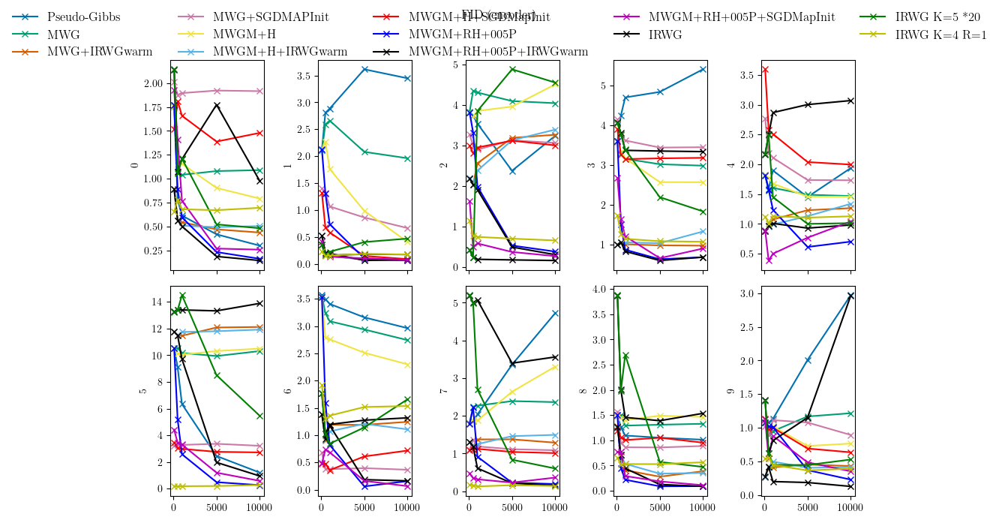

In [54]:
num_datapoints = 10
plot_log_log = False

fig, axes = plt.subplots(2, 5, figsize=(10, 7), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y']



for i, model in enumerate(fids.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx].plot(x, fids[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        axes[data_idx].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx].set_yscale('log')
            axes[data_idx].set_xscale('log')
            
    
print(fids.keys())

fig.suptitle('FID (encoder)')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.93), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


 ## Imputation distribution metrics (all iterations)

### Imputations $p(z \mid x_o)$

In [30]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
#     'MWGM+RH+005P nw': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
    'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
#     'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
#     'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

klfows = defaultdict(list)
klrevs = defaultdict(list)
jsds = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        klfow, klrev, jsd = load_mog_compprob_results(path)
        klfows[model].append(klfow)
        klrevs[model].append(klrev)
        jsds[model].append(jsd)
    
irwg_resampled_models = {
#     'IRWG FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_finalresample',
#     'IRWG K=5 *20 FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20_finalresample',
#     'IRWG K=4 R=1 FRS': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
#     'IRWG K=19 R=1 FRS': 'vae_convresnet3_k19_irwg_i1_dmis_gr_mult_replenish1_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        klfow, klrev, jsd = load_mog_compprob_results_irwg_resampled(path)
        klfows[model].append(klfow)
        klrevs[model].append(klrev)
        jsds[model].append(jsd)
    
for model in jsds.keys():
    klfows[model] = rearrange(klfows[model], 's b t -> b s t')
    klrevs[model] = rearrange(klrevs[model], 's b t -> b s t')
    jsds[model] = rearrange(jsds[model], 's b t -> b s t')

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+SGDMAP', "MWG$'$", 'AC-MWG', "AC-MWG$'$", 'LAIR'])


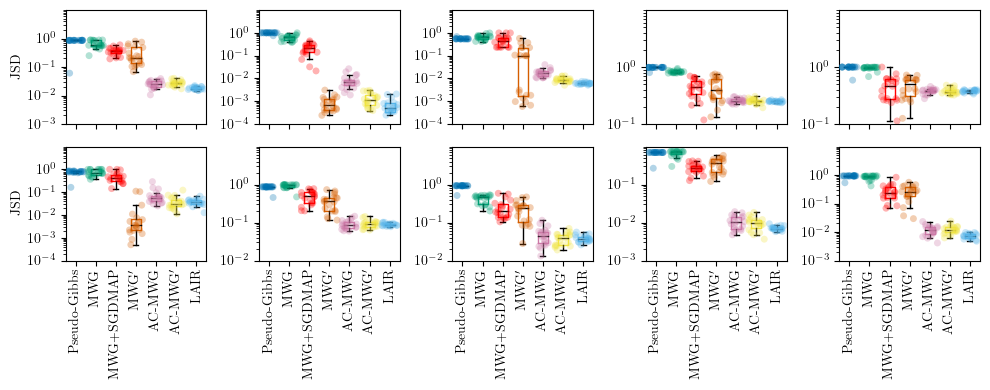

In [31]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# Rearrange colors to match the main text:
temp_colors = colors[:6]
temp_colors.insert(2, colors[6])
colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(jsds.keys()):
        jsd = jsds[model][data_idx][:, -1]
        jsd = jsd/np.log(2) # Change logarithm base to binary
        all_data.append(jsd)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(jsds.keys())

# fig.suptitle('JSD')
axes[0].set_ylabel('JSD')
axes[5].set_ylabel('JSD')

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/mnist_gmm_pzgivenxo_jsd.pdf')

### Imputations FID (classifier)

In [32]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
#     'MWGM+RH+005P nw': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
    'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
#     'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
#     'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

fids = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_classifier_results(path)
        fids[model].append(fid)
    
irwg_resampled_models = {
#     'IRWG FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_finalresample',
#     'IRWG K=5 *20 FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20_finalresample',
#     'IRWG K=4 R=1 FRS': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
#     'IRWG K=19 R=1 FRS': 'vae_convresnet3_k19_irwg_i1_dmis_gr_mult_replenish1_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_classifier_results_irwg_resampled(path)
        fids[model].append(fid)
    
for model in fids.keys():
    fids[model] = rearrange(fids[model], 's b t -> b s t')


dict_keys(['Pseudo-Gibbs', 'MWG', 'MWG+SGDMAP', "MWG$'$", 'AC-MWG', "AC-MWG$'$", 'LAIR'])


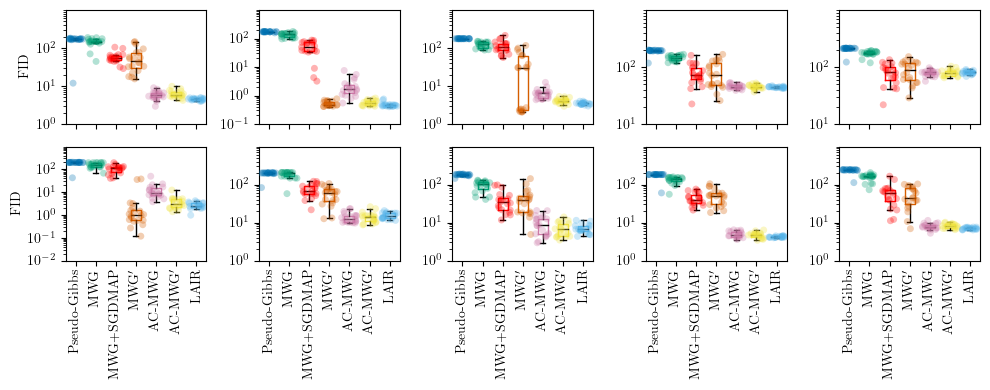

In [33]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# Rearrange colors to match the main text:
temp_colors = colors[:6]
temp_colors.insert(2, colors[6])
colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(fids.keys()):
        fid = fids[model][data_idx][:, -1]
        all_data.append(fid)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(fids.keys())

# fig.suptitle('FID (classifier)')
axes[0].set_ylabel('FID')
axes[5].set_ylabel('FID')

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/mnist_gmm_fid_classifier.pdf')

### Imputations FID (encoder)

In [36]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup',
    'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
#     'MWG+SGDMAPInit': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWGM': 'vae_convresnet3_k5_mwgm_with_ps_warmup',
#     'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
#     'MWGM+H+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehist_with_irwg_warmup',
#     'MWGM+H+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehist_with_sgdmap_init',
#     'MWGM+RH+005P': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_ps_warmup',
#     'MWGM+RH+005P nw': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
    'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
#     'MWGM+RH+005P+IRWGwarm': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup',
#     'MWGM+RH+005P+SGDMapInit': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_sgd_warmup',
#     'IRWG': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
# #     'IRWG + H1': 'vae_convresnet3_k4_irwg_i1_h1_dmis_gr_mult',
# #     'MWGM+H K=100': 'vae_convresnet3_k100_mwgm_usehist_with_ps_warmup',
# #     'IRWG K=5 *20 (old)': 'vae_convresnet3_k100_irwg_i1_dmisg_glr5_mult',
#     'IRWG K=5 *20': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20',
#     'IRWG K=4 R=1': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1',
}

fids = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_encoder_results(path)
        fids[model].append(fid)
    
irwg_resampled_models = {
#     'IRWG FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_finalresample',
#     'IRWG K=5 *20 FRS': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult_seqrun20_finalresample',
#     'IRWG K=4 R=1 FRS': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
#     'IRWG K=19 R=1 FRS': 'vae_convresnet3_k19_irwg_i1_dmis_gr_mult_replenish1_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_encoder_results_irwg_resampled(path)
        fids[model].append(fid)
    
for model in fids.keys():
    fids[model] = rearrange(fids[model], 's b t -> b s t')


dict_keys(['Pseudo-Gibbs', 'MWG', "MWG$'$", 'AC-MWG', "AC-MWG$'$", 'LAIR'])


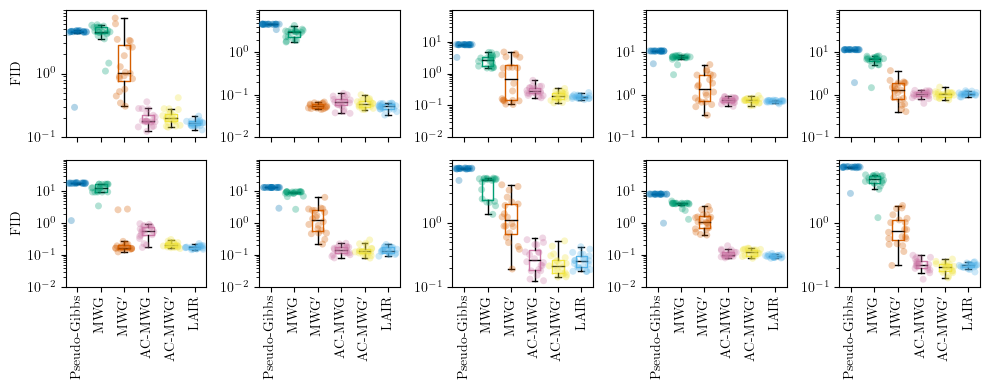

In [37]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# # Rearrange colors to match the main text:
# temp_colors = colors[:6]
# temp_colors.insert(2, colors[6])
# colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(fids.keys()):
        fid = fids[model][data_idx][:, -1]
        all_data.append(fid)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(fids.keys())

# fig.suptitle('FID (encoder)')
axes[0].set_ylabel('FID')
axes[5].set_ylabel('FID')

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/mnist_gmm_fid_encoder.pdf')
# fig.savefig('figures/mnist_gmm_fid_encoder_with_mwgsgdmap.pdf')

 ## Ablations: Imputation distribution metrics (all iterations)

### Imputations $p(z \mid x_o)$

In [33]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
    'AC-MWG ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_mwgm_usehistrestricted_000prior_nowarm',
    'AC-MWG (MWG target)': 'ablation_vae_convresnet3_k5_mwgm_mwgtarget_usehistrestricted_005prior_nowarm',
}

standard_ir_models = {
    # NOTE: LAIR with epsilon=1 corresponds to standard IR without adaptation
    'LAIR ($\epsilon=1.0$)': 'ablation_vae_convresnet3_standard_ir',
}

klfows = defaultdict(list)
klrevs = defaultdict(list)
jsds = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        klfow, klrev, jsd = load_mog_compprob_results(path)
        klfows[model].append(klfow)
        klrevs[model].append(klrev)
        jsds[model].append(jsd)
    
irwg_resampled_models = {
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_irwg_i1_dmis_gr_mult_replenish0_finalresample',
    'LAIR ($\epsilon=0.6$)': 'ablation_vae_convresnet3_k2_irwg_i1_dmis_gr_mult_replenish3_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        klfow, klrev, jsd = load_mog_compprob_results_irwg_resampled(path)
        klfows[model].append(klfow)
        klrevs[model].append(klrev)
        jsds[model].append(jsd)

for seed in seeds:
    for model, dir_name in standard_ir_models.items():
        path = path_template.format(dir_name, seed, seed)
        klfow, klrev, jsd = load_mog_compprob_results(path)
        klfows[model].append(klfow)
        klrevs[model].append(klrev)
        jsds[model].append(jsd)
        
for model in jsds.keys():
    klfows[model] = rearrange(klfows[model], 's b t -> b s t')
    klrevs[model] = rearrange(klrevs[model], 's b t -> b s t')
    jsds[model] = rearrange(jsds[model], 's b t -> b s t')

dict_keys(['AC-MWG', 'AC-MWG ($\\epsilon=0.0$)', 'AC-MWG (MWG target)', 'LAIR', 'LAIR ($\\epsilon=0.0$)', 'LAIR ($\\epsilon=0.6$)', 'LAIR ($\\epsilon=1.0$)'])


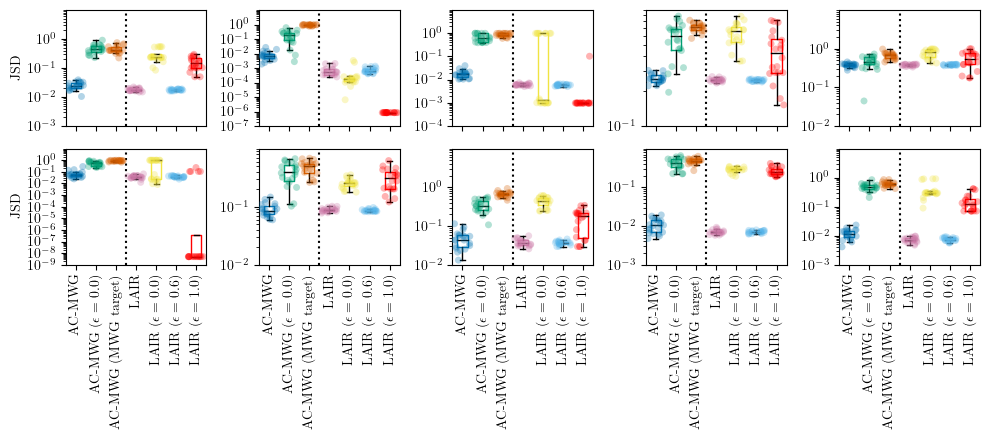

In [35]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4.5), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# Rearrange colors to match the main text:
# temp_colors = colors[:6]
# temp_colors.insert(2, colors[6])
# colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(jsds.keys()):
        jsd = jsds[model][data_idx][:, -1]
        jsd = jsd/np.log(2) # Change logarithm base to binary
        all_data.append(jsd)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(jsds.keys())

# fig.suptitle('JSD')
axes[0].set_ylabel('JSD')
axes[5].set_ylabel('JSD')

for ax in axes:
    ax.axvline(x=2.5, color='k', linestyle=":")

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/ablations_mnist_gmm_pzgivenxo_jsd.pdf')

### Imputations FID (classifier)

In [36]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
    'AC-MWG ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_mwgm_usehistrestricted_000prior_nowarm',
    'AC-MWG (MWG target)': 'ablation_vae_convresnet3_k5_mwgm_mwgtarget_usehistrestricted_005prior_nowarm',
}

standard_ir_models = {
    # NOTE: LAIR with epsilon=1 corresponds to standard IR without adaptation
    'LAIR ($\epsilon=1.0$)': 'ablation_vae_convresnet3_standard_ir',
}

fids = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_classifier_results(path)
        fids[model].append(fid)
    
irwg_resampled_models = {
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_irwg_i1_dmis_gr_mult_replenish0_finalresample',
    'LAIR ($\epsilon=0.6$)': 'ablation_vae_convresnet3_k2_irwg_i1_dmis_gr_mult_replenish3_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_classifier_results_irwg_resampled(path)
        fids[model].append(fid)

for seed in seeds:
    for model, dir_name in standard_ir_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_classifier_results(path)
        fids[model].append(fid)       
        
for model in fids.keys():
    fids[model] = rearrange(fids[model], 's b t -> b s t')


dict_keys(['AC-MWG', 'AC-MWG ($\\epsilon=0.0$)', 'AC-MWG (MWG target)', 'LAIR', 'LAIR ($\\epsilon=0.0$)', 'LAIR ($\\epsilon=0.6$)', 'LAIR ($\\epsilon=1.0$)'])


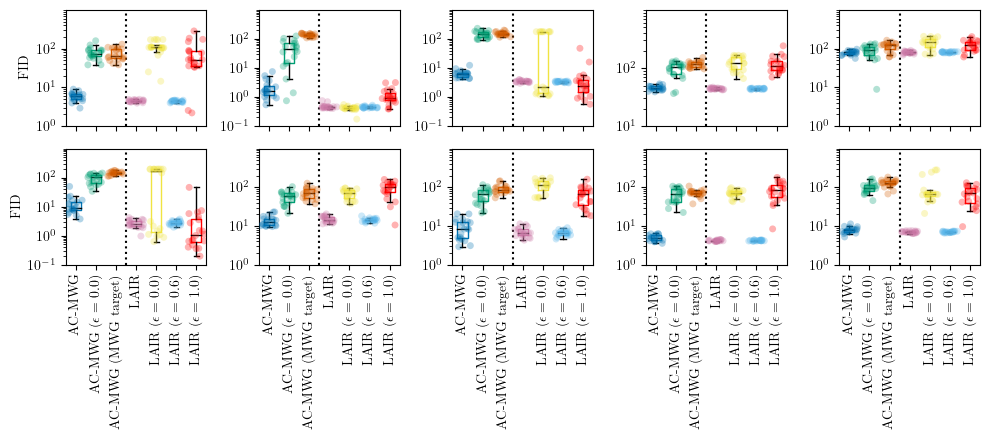

In [38]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4.5), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# Rearrange colors to match the main text:
# temp_colors = colors[:6]
# temp_colors.insert(2, colors[6])
# colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(fids.keys()):
        fid = fids[model][data_idx][:, -1]
        all_data.append(fid)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(fids.keys())

# fig.suptitle('FID (classifier)')
axes[0].set_ylabel('FID')
axes[5].set_ylabel('FID')

for ax in axes:
    ax.axvline(x=2.5, color='k', linestyle=":")

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/ablations_mnist_gmm_fid_classifier.pdf')

### Imputations FID (encoder)

In [43]:
seeds = [20220118, 2022011811, 2022011822, 2022011833, 2022011844,
         2022011855, 2022011866, 2022011877, 2022011888, 2022011899,
         20230118, 2023011811, 2023011822, 2023011833, 2023011844,
         2023011855, 2023011866, 2023011877, 2023011888, 2023011899,]

path_template = f'../logs/{ds}/imputation/samples/{{}}/seed_m{{}}_d{{}}/lightning_logs'

models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
#     'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
#     'MWG+SGDMAP': 'vae_convresnet3_k5_mwg_with_sgdmap_init',
#     'MWG$\'$': 'vae_convresnet3_k5_mwg_with_irwg_warmup_replenish1',
    'AC-MWG': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_nowarm',
#     'AC-MWG$\'$': 'vae_convresnet3_k5_mwgm_usehistrestricted_005prior_with_irwg_warmup_replenish1',
    'AC-MWG ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_mwgm_usehistrestricted_000prior_nowarm',
    'AC-MWG (MWG target)': 'ablation_vae_convresnet3_k5_mwgm_mwgtarget_usehistrestricted_005prior_nowarm',
}

standard_ir_models = {
    # NOTE: LAIR with epsilon=1 corresponds to standard IR without adaptation
    'LAIR ($\epsilon=1.0$)': 'ablation_vae_convresnet3_standard_ir',
}

fids = defaultdict(list)
for seed in seeds:
    for model, dir_name in models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_encoder_results(path)
        fids[model].append(fid)
    
irwg_resampled_models = {
    'LAIR': 'vae_convresnet3_k4_irwg_i1_dmis_gr_mult_replenish1_finalresample',
    'LAIR ($\epsilon=0.0$)': 'ablation_vae_convresnet3_k5_irwg_i1_dmis_gr_mult_replenish0_finalresample',
    'LAIR ($\epsilon=0.6$)': 'ablation_vae_convresnet3_k2_irwg_i1_dmis_gr_mult_replenish3_finalresample',
}

for seed in seeds:
    for model, dir_name in irwg_resampled_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_encoder_results_irwg_resampled(path)
        fids[model].append(fid)

for seed in seeds:
    for model, dir_name in standard_ir_models.items():
        path = path_template.format(dir_name, seed, seed)
        fid = load_fid_encoder_results(path)
        fids[model].append(fid)
        
for model in fids.keys():
    fids[model] = rearrange(fids[model], 's b t -> b s t')


dict_keys(['AC-MWG', 'AC-MWG ($\\epsilon=0.0$)', 'AC-MWG (MWG target)', 'LAIR', 'LAIR ($\\epsilon=0.0$)', 'LAIR ($\\epsilon=0.6$)', 'LAIR ($\\epsilon=1.0$)'])


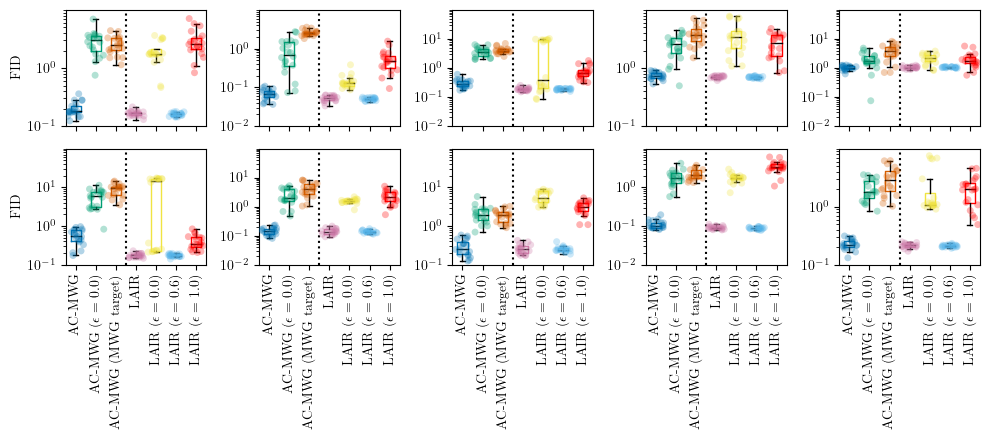

In [45]:
num_datapoints = 10
plot_log = True

fig, axes = plt.subplots(2, 5, figsize=(10, 4.5), sharex=True)
axes = axes.flatten()
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors += ['r', 'b', 'k', 'm', 'k', 'g', 'y', 'c', 'r', 'b']

# # Rearrange colors to match the main text:
# temp_colors = colors[:6]
# temp_colors.insert(2, colors[6])
# colors = temp_colors

# for i, model in enumerate(jsds.keys()):
#     for data_idx in range(num_datapoints):
#         jsd = jsds[model][data_idx][:, -1]
        
#         axes[data_idx].scatter([i]*len(jsd), jsd, color=colors[i], marker='x', label=model)
        
#         axes[data_idx].set_ylabel(data_idx)
#         if plot_log:
#             axes[data_idx].set_yscale('log')

for data_idx in range(num_datapoints):
    all_data = []
    model_labels = []
    for i, model in enumerate(fids.keys()):
        fid = fids[model][data_idx][:, -1]
        all_data.append(fid)
        model_labels.append(model)
        
    box_all_data = all_data
    if plot_log:
        box_all_data = [np.log10(x) for x in box_all_data]
    bplot = axes[data_idx].boxplot(box_all_data, 
                                   positions=np.arange(len(box_all_data)),
                                   labels=model_labels, showfliers=False,
                                   notch=False)
    for i, box in enumerate(bplot['boxes']):
        box.set_color(colors[i])
        box.set_linewidth(1)
    for i, box in enumerate(bplot['medians']):
        box.set_color('k')
        box.set_linewidth(1)

#     plot_custom_snsviolinplot(axes[data_idx], all_data, model_labels, 
#                               colors=colors, violin_kwargs={'bw': 0.05, 'gridsize': 500, 'scale': 'width'},
#                               no_trim=True, only_trim_up=False, 
#                               showmedians=True, 
#                               use_log_scale=plot_log)
    
    plot_custom_stripplot(axes[data_idx], all_data, model_labels, 
                          colors=colors,
                          no_trim=True, only_trim_up=False, 
                          showmedians=False, 
                          use_log_scale=plot_log,
                          stripplot_kw={'alpha': 0.3})
    
    axes[data_idx].set_xticks(np.arange(0, len(box_all_data)), labels=model_labels)
    plt.setp(axes[data_idx].get_xticklabels(), rotation=90, ha='center')
            
    
print(fids.keys())

# fig.suptitle('FID (encoder)')
axes[0].set_ylabel('FID')
axes[5].set_ylabel('FID')

for ax in axes:
    ax.axvline(x=2.5, color='k', linestyle=":")

fig.tight_layout()#(rect=(0, 0, 1, 0.95))
# axes[0].legend(ncol=5, 
#               bbox_to_anchor=(0.5, 0.93), 
#               bbox_transform=fig.transFigure, 
#               loc='center',
#               fontsize=12,
#               frameon=False)

# fig.savefig('figures/ablations_mnist_gmm_fid_encoder.pdf')

## Preparing missingness masks for specific test samples  v2

### Sample 36

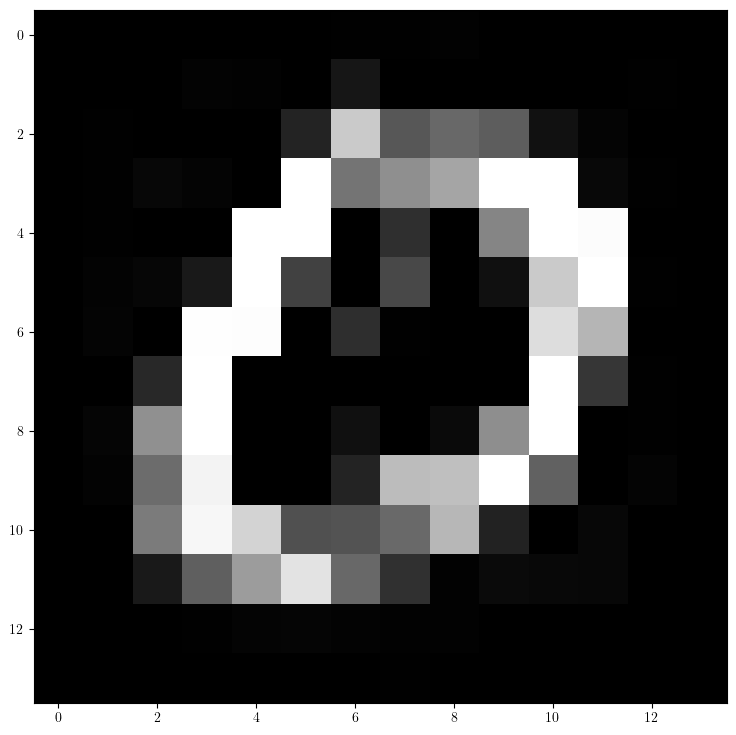

In [471]:
idx = 36

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

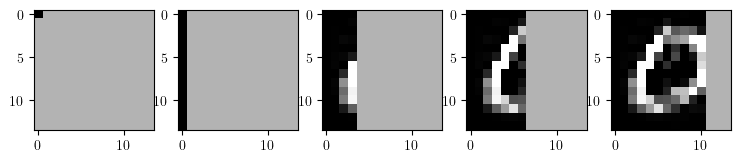

In [472]:
M = np.zeros((5, *X_i.shape), dtype=bool)
M[0, 0:1, 0:1] = 1
M[1, 0:14, 0:1] = 1
M[2, 0:14, 0:4] = 1
M[3, 0:14, 0:7] = 1
M[4, 0:14, 0:11] = 1

def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

fig, axes = plt.subplots(1, M.shape[0], figsize=(9, 9))
for i in range(len(axes)):
    M_i = M[i]
    axes[i].imshow(X_i*M_i + ~M_i*0.7, vmin=0, vmax=1, cmap='gray')

/tmp/ipykernel_1213217/690183093.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


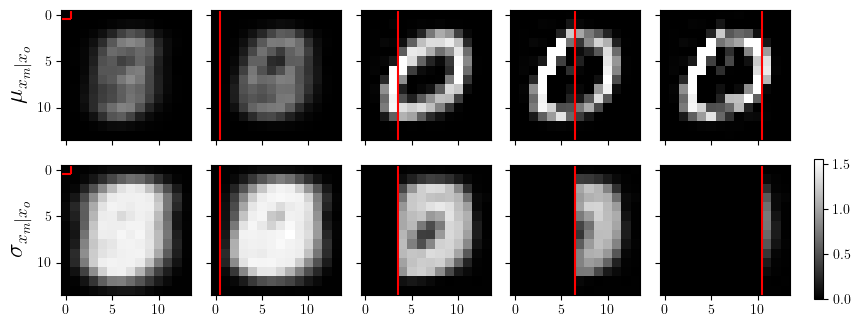

In [452]:
X_i = data[idx]
X_i_temp = torch.tensor(X_i)[None, :]

all_stds = []
all_means = []
for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
    means_m_given_o = asnumpy(means_m_given_o)[0]
    covs_m_given_o = asnumpy(covs_m_given_o)[0]

    stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)
    
    mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i_temp*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    all_stds.append(stds)
    all_means.append(mean)
all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
all_means = dataset.postprocess(all_means)

std_max = np.max(all_stds)

fig, axes = plt.subplots(2, M.shape[0], figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(M.shape[0]):
    mean = all_means[i]
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(M.shape[0]):
    stds = all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.1, 0.01, 0.4])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

In [401]:
M.reshape(M.shape[0], -1)

array([[ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

Miss pattern:  0 , Num nodes in p(c|x_o): 10
Miss pattern:  1 , Num nodes in p(c|x_o): 7
Miss pattern:  2 , Num nodes in p(c|x_o): 1
Miss pattern:  3 , Num nodes in p(c|x_o): 1
Miss pattern:  4 , Num nodes in p(c|x_o): 1


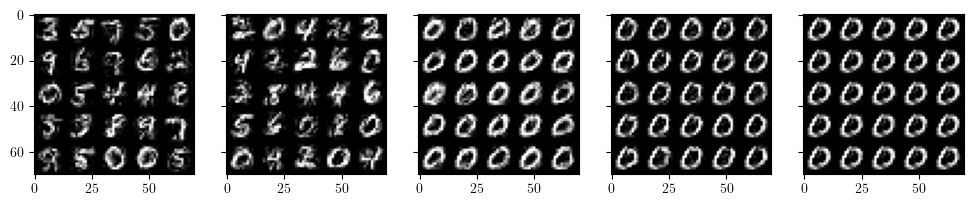

In [402]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]

num_samples = 25

fig, axes = plt.subplots(1, M.shape[0], figsize=(12, 5), sharex=True, sharey=True)

for i in range(M.shape[0]):
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

    how_many_modes = (torch.exp(comp_log_probs_given_o) > 0.05).sum()
    print('Miss pattern: ', i, ', Num nodes in p(c|x_o):', how_many_modes.item())

    X_imp = sample_sparse_mog(num_samples, M_i, 
                      comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

    X_imp = asnumpy(X_i*M_i + X_imp*~M_i)

    X_imp = dataset.postprocess(X_imp)
    X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

    axes[i].imshow(X_imp, cmap='gray')

0-th Entropy 2.302559
1-th Entropy 1.8042287
2-th Entropy 6.833664e-22
3-th Entropy -0.0
4-th Entropy -0.0


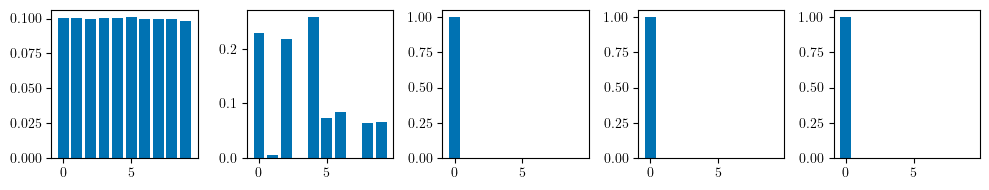

In [409]:
fig, axes = plt.subplots(1, M.shape[0], figsize=(10, 2))

for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    p = asnumpy(torch.exp(comp_log_probs_given_o)[0])
    log_p = asnumpy(comp_log_probs_given_o[0])
    entropy = -(p*log_p).sum()


    axes[i].bar(np.arange(comp_log_probs_given_o.shape[-1]), p)

    print(f'{i}-th Entropy', entropy)

fig.tight_layout()

### Sample 45

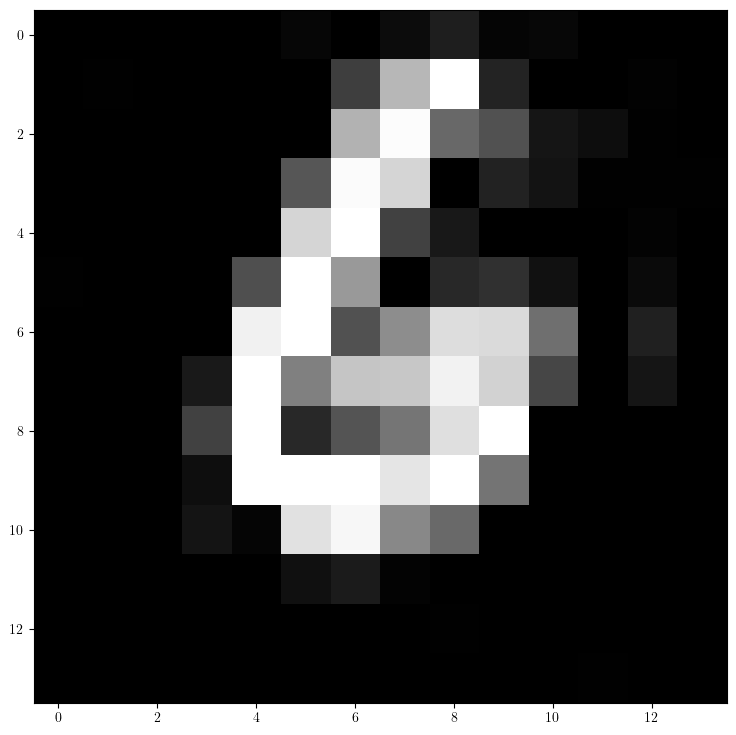

In [430]:
idx = 45

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

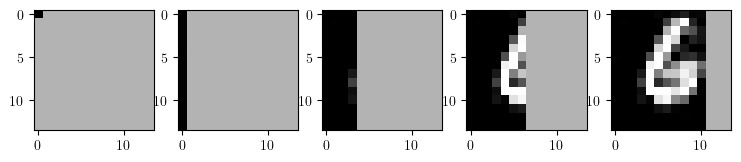

In [431]:
M = np.zeros((5, *X_i.shape), dtype=bool)
M[0, 0:1, 0:1] = 1
M[1, 0:14, 0:1] = 1
M[2, 0:14, 0:4] = 1
M[3, 0:14, 0:7] = 1
M[4, 0:14, 0:11] = 1

def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

fig, axes = plt.subplots(1, M.shape[0], figsize=(9, 9))
for i in range(len(axes)):
    M_i = M[i]
    axes[i].imshow(X_i*M_i + ~M_i*0.7, vmin=0, vmax=1, cmap='gray')

/tmp/ipykernel_1213217/690183093.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


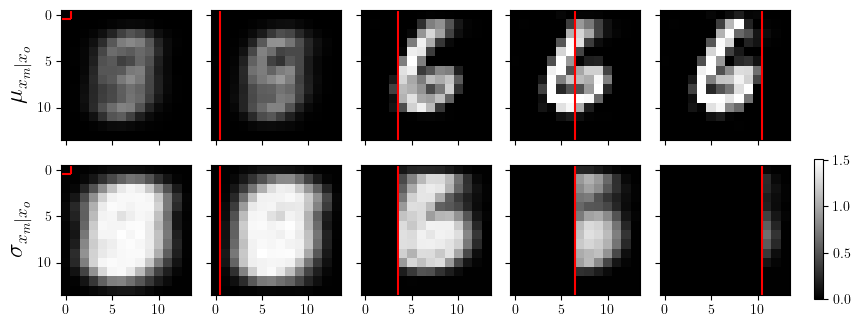

In [448]:
X_i = data[idx]
X_i_temp = torch.tensor(X_i)[None, :]

all_stds = []
all_means = []
for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
    means_m_given_o = asnumpy(means_m_given_o)[0]
    covs_m_given_o = asnumpy(covs_m_given_o)[0]

    stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)
    
    mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i_temp*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    all_stds.append(stds)
    all_means.append(mean)
all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
all_means = dataset.postprocess(all_means)

std_max = np.max(all_stds)

fig, axes = plt.subplots(2, M.shape[0], figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(M.shape[0]):
    mean = all_means[i]
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(M.shape[0]):
    stds = all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.1, 0.01, 0.4])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

In [413]:
M.reshape(M.shape[0], -1)

array([[ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

Miss pattern:  0 , Num nodes in p(c|x_o): 10
Miss pattern:  1 , Num nodes in p(c|x_o): 5
Miss pattern:  2 , Num nodes in p(c|x_o): 1
Miss pattern:  3 , Num nodes in p(c|x_o): 1
Miss pattern:  4 , Num nodes in p(c|x_o): 1


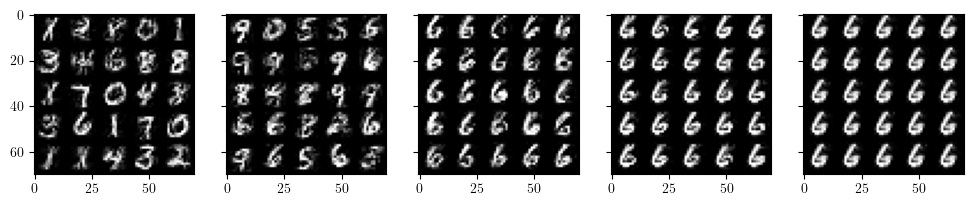

In [414]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]

num_samples = 25

fig, axes = plt.subplots(1, M.shape[0], figsize=(12, 5), sharex=True, sharey=True)

for i in range(M.shape[0]):
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

    how_many_modes = (torch.exp(comp_log_probs_given_o) > 0.05).sum()
    print('Miss pattern: ', i, ', Num nodes in p(c|x_o):', how_many_modes.item())

    X_imp = sample_sparse_mog(num_samples, M_i, 
                      comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

    X_imp = asnumpy(X_i*M_i + X_imp*~M_i)

    X_imp = dataset.postprocess(X_imp)
    X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

    axes[i].imshow(X_imp, cmap='gray')

0-th Entropy 2.302573
1-th Entropy 1.7994069
2-th Entropy -0.0
3-th Entropy -0.0
4-th Entropy -0.0


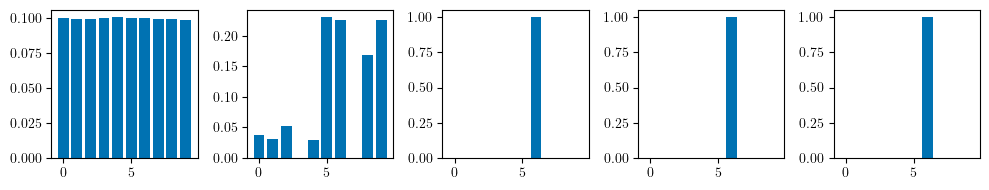

In [415]:
fig, axes = plt.subplots(1, M.shape[0], figsize=(10, 2))

for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    p = asnumpy(torch.exp(comp_log_probs_given_o)[0])
    log_p = asnumpy(comp_log_probs_given_o[0])
    entropy = -(p*log_p).sum()


    axes[i].bar(np.arange(comp_log_probs_given_o.shape[-1]), p)

    print(f'{i}-th Entropy', entropy)

fig.tight_layout()

### Sample 136

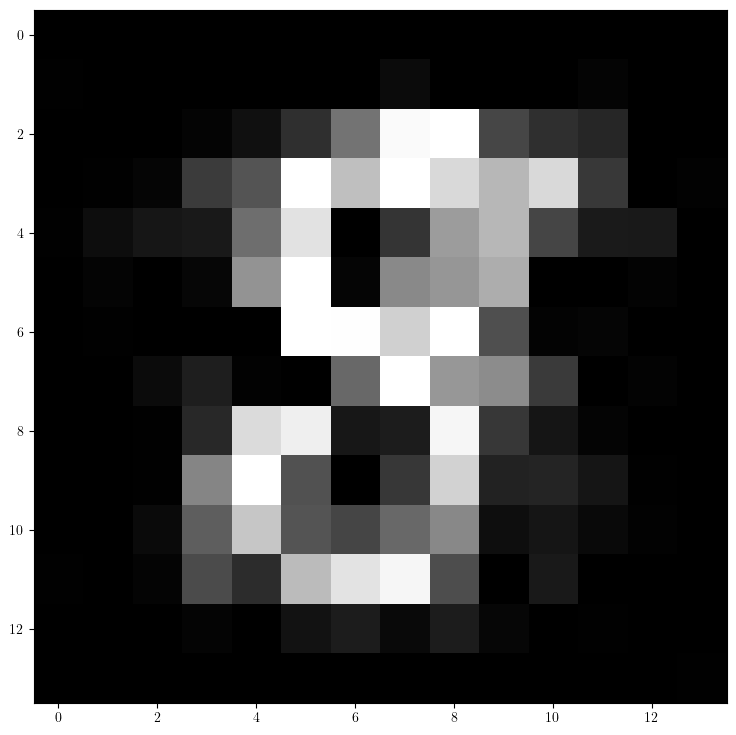

In [453]:
idx = 136

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

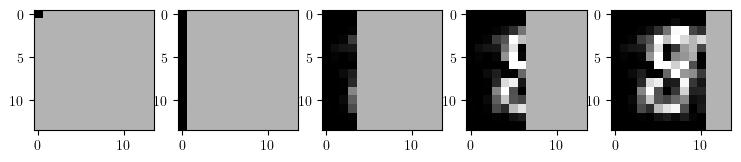

In [454]:
M = np.zeros((5, *X_i.shape), dtype=bool)
M[0, 0:1, 0:1] = 1
M[1, 0:14, 0:1] = 1
M[2, 0:14, 0:4] = 1
M[3, 0:14, 0:7] = 1
M[4, 0:14, 0:11] = 1

def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

fig, axes = plt.subplots(1, M.shape[0], figsize=(9, 9))
for i in range(len(axes)):
    M_i = M[i]
    axes[i].imshow(X_i*M_i + ~M_i*0.7, vmin=0, vmax=1, cmap='gray')

/tmp/ipykernel_1213217/690183093.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


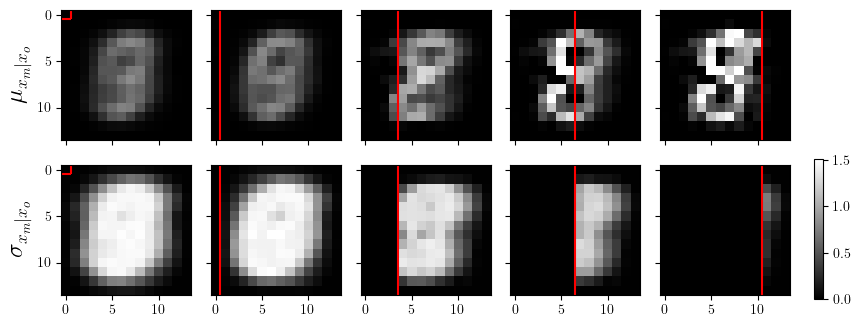

In [455]:
X_i = data[idx]
X_i_temp = torch.tensor(X_i)[None, :]

all_stds = []
all_means = []
for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
    means_m_given_o = asnumpy(means_m_given_o)[0]
    covs_m_given_o = asnumpy(covs_m_given_o)[0]

    stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)
    
    mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i_temp*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    all_stds.append(stds)
    all_means.append(mean)
all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
all_means = dataset.postprocess(all_means)

std_max = np.max(all_stds)

fig, axes = plt.subplots(2, M.shape[0], figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(M.shape[0]):
    mean = all_means[i]
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(M.shape[0]):
    stds = all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.1, 0.01, 0.4])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

In [420]:
M.reshape(M.shape[0], -1)

array([[ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

Miss pattern:  0 , Num nodes in p(c|x_o): 10
Miss pattern:  1 , Num nodes in p(c|x_o): 6
Miss pattern:  2 , Num nodes in p(c|x_o): 1
Miss pattern:  3 , Num nodes in p(c|x_o): 1
Miss pattern:  4 , Num nodes in p(c|x_o): 1


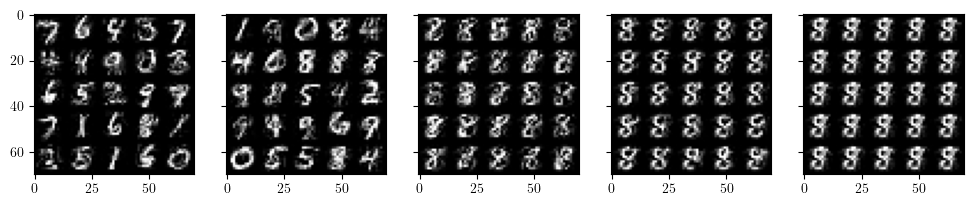

In [456]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]

num_samples = 25

fig, axes = plt.subplots(1, M.shape[0], figsize=(12, 5), sharex=True, sharey=True)

for i in range(M.shape[0]):
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

    how_many_modes = (torch.exp(comp_log_probs_given_o) > 0.05).sum()
    print('Miss pattern: ', i, ', Num nodes in p(c|x_o):', how_many_modes.item())

    X_imp = sample_sparse_mog(num_samples, M_i, 
                      comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

    X_imp = asnumpy(X_i*M_i + X_imp*~M_i)

    X_imp = dataset.postprocess(X_imp)
    X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

    axes[i].imshow(X_imp, cmap='gray')

0-th Entropy 2.3025744
1-th Entropy 1.9365565
2-th Entropy 2.4470563e-11
3-th Entropy 6.1359802e-33
4-th Entropy 4.706124e-36


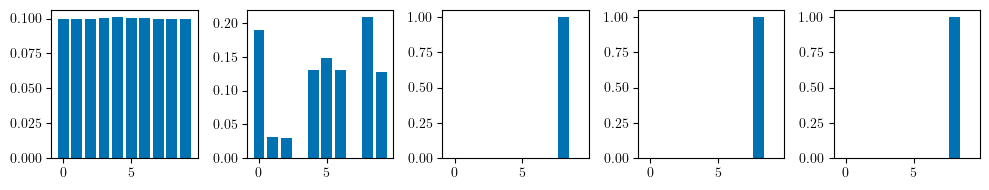

In [422]:
fig, axes = plt.subplots(1, M.shape[0], figsize=(10, 2))

for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    p = asnumpy(torch.exp(comp_log_probs_given_o)[0])
    log_p = asnumpy(comp_log_probs_given_o[0])
    entropy = -(p*log_p).sum()


    axes[i].bar(np.arange(comp_log_probs_given_o.shape[-1]), p)

    print(f'{i}-th Entropy', entropy)

fig.tight_layout()

### Sample 191

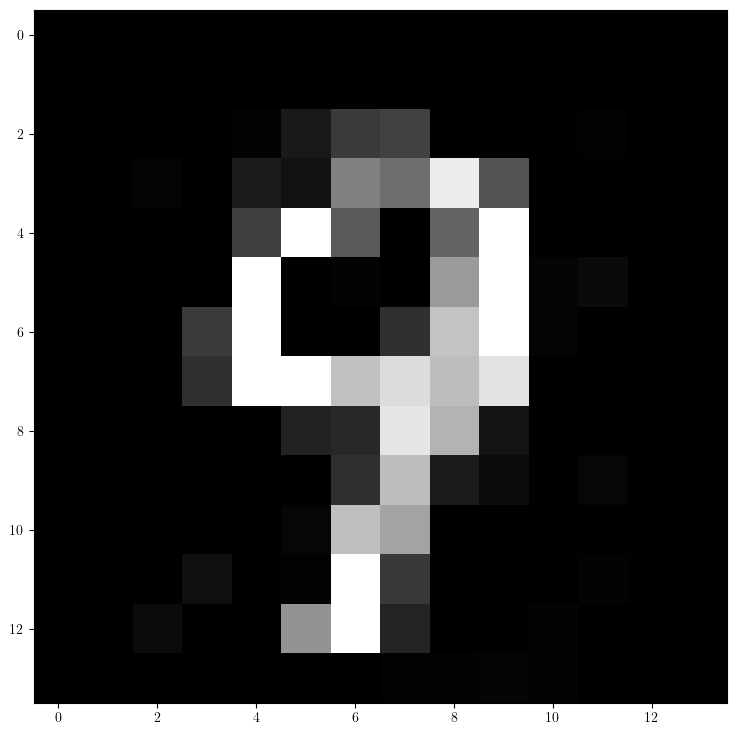

In [457]:
idx = 191

X_i = data[idx]
X_i = dataset.postprocess(X_i)
X_i = rearrange(X_i, '(h w) -> h w', h=14, w=14)

fig, axes = plt.subplots(1, 1, figsize=(9, 9))
axes.imshow(X_i, cmap='gray')

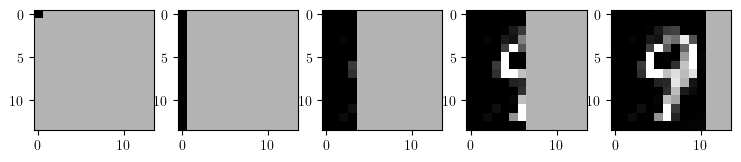

In [458]:
M = np.zeros((5, *X_i.shape), dtype=bool)
M[0, 0:1, 0:1] = 1
M[1, 0:14, 0:1] = 1
M[2, 0:14, 0:4] = 1
M[3, 0:14, 0:7] = 1
M[4, 0:14, 0:11] = 1

def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

fig, axes = plt.subplots(1, M.shape[0], figsize=(9, 9))
for i in range(len(axes)):
    M_i = M[i]
    axes[i].imshow(X_i*M_i + ~M_i*0.7, vmin=0, vmax=1, cmap='gray')

/tmp/ipykernel_1213217/690183093.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


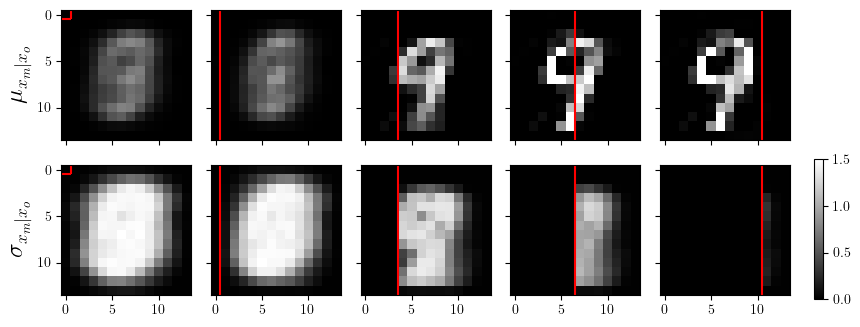

In [459]:
X_i = data[idx]
X_i_temp = torch.tensor(X_i)[None, :]

all_stds = []
all_means = []
for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
    means_m_given_o = asnumpy(means_m_given_o)[0]
    covs_m_given_o = asnumpy(covs_m_given_o)[0]

    stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)
    
    mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i_temp*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    all_stds.append(stds)
    all_means.append(mean)
all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
all_means = dataset.postprocess(all_means)

std_max = np.max(all_stds)

fig, axes = plt.subplots(2, M.shape[0], figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(M.shape[0]):
    mean = all_means[i]
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(M.shape[0]):
    stds = all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.1, 0.01, 0.4])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

In [426]:
M.reshape(M.shape[0], -1)

array([[ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

Miss pattern:  0 , Num nodes in p(c|x_o): 10
Miss pattern:  1 , Num nodes in p(c|x_o): 6
Miss pattern:  2 , Num nodes in p(c|x_o): 1
Miss pattern:  3 , Num nodes in p(c|x_o): 1
Miss pattern:  4 , Num nodes in p(c|x_o): 1


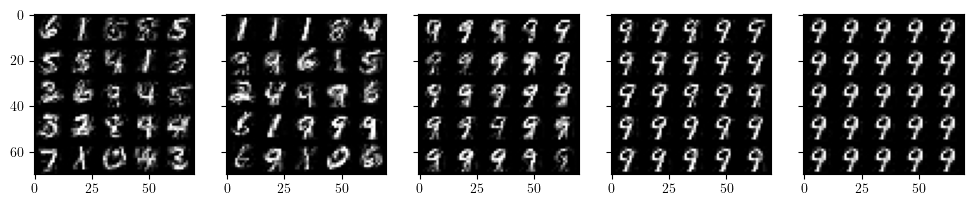

In [427]:
X_i = data[idx]
X_i = torch.tensor(X_i)[None, :]

num_samples = 25

fig, axes = plt.subplots(1, M.shape[0], figsize=(12, 5), sharex=True, sharey=True)

for i in range(M.shape[0]):
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

    how_many_modes = (torch.exp(comp_log_probs_given_o) > 0.05).sum()
    print('Miss pattern: ', i, ', Num nodes in p(c|x_o):', how_many_modes.item())

    X_imp = sample_sparse_mog(num_samples, M_i, 
                      comp_log_probs_given_o, means_m_given_o, covs_m_given_o)

    X_imp = asnumpy(X_i*M_i + X_imp*~M_i)

    X_imp = dataset.postprocess(X_imp)
    X_imp = rearrange(X_imp, '1 (n1 n2) (h w) -> (n1 h) (n2 w)', n1=5, n2=5, h=14, w=14)

    axes[i].imshow(X_imp, cmap='gray')

0-th Entropy 2.3025072
1-th Entropy 1.9059863
2-th Entropy 9.904795e-16
3-th Entropy 2.7918172e-35
4-th Entropy -0.0


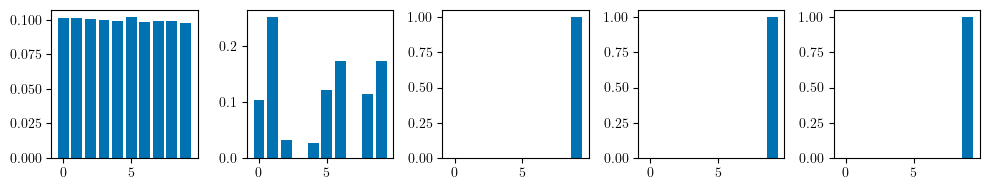

In [428]:
fig, axes = plt.subplots(1, M.shape[0], figsize=(10, 2))

for i in range(M.shape[0]):   
    M_i = torch.tensor(M)[i]
    M_i = M_i.flatten()[None, :]

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i_temp, M_i, comp_log_probs, means, covs)

    p = asnumpy(torch.exp(comp_log_probs_given_o)[0])
    log_p = asnumpy(comp_log_probs_given_o[0])
    entropy = -(p*log_p).sum()


    axes[i].bar(np.arange(comp_log_probs_given_o.shape[-1]), p)

    print(f'{i}-th Entropy', entropy)

fig.tight_layout()

## Imputations  v2

In [141]:
path_template = f'../logs/{ds}/imputation/samples1/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'IRWG K=5': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
    'IRWG K=20': 'vae_convresnet3_k20_irwg_i1_dmis_gr_mult',
    'IRWG K=200': 'vae_convresnet3_k200_irwg_i1_dmis_gr_mult',
}

imps_all = {}
for name, dir_name in models.items():
    imps_all[name] = load_imputations(path_template.format(dir_name))

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWGM+H', 'IRWG K=5', 'IRWG K=20', 'IRWG K=200'])


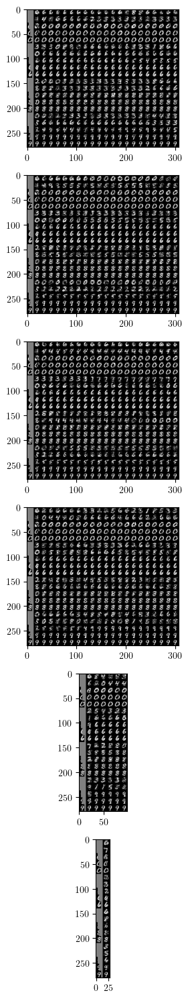

In [142]:
img_dims = (14,14)

selected_imps_all = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = imps[:, ::500, 0, :]
    imps = np.reshape(imps, imps.shape[:-1] + img_dims)
    selected_imps = rearrange(imps, 'n t h w -> (n h) (t w)')
    selected_imps = dataset.postprocess(selected_imps)
    true_X = true_X[:, 0, ...]
    true_X = np.reshape(true_X, true_X.shape[:-1] + img_dims)
    true_X = rearrange(true_X, 'n h w -> (n h) w')
    true_X = dataset.postprocess(true_X)
    masks = masks[:, 0, ...]
    masks = np.reshape(masks, masks.shape[:-1] + img_dims)
    masks = rearrange(masks, 'n h w -> (n h) w')
    true_X[np.isnan(true_X)] = 0.5
    masked_X = true_X * masks + 0.5*(~masks)

    imps = np.concatenate([true_X, selected_imps], axis=1)
    selected_imps_all[model] = imps


fig, axes = plt.subplots(len(imps_all), 1, figsize=(15, 15), sharey=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

for i, (model, imps) in enumerate(selected_imps_all.items()):
    axes[i].imshow(imps, cmap='gray', vmin=0, vmax=1)
    
print(selected_imps_all.keys())

fig.tight_layout()

### Imputation mean and std  (Sample 36)

In [145]:
imp_means = {}
imp_stds = {}
imp_masks = {}
imp_true = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = rearrange(imps, 'b t k d -> b (t k) d')
    imp_means[model] = imps.mean(axis=1)
    imp_stds[model] = dataset.clip_unconstrained_samples_to_unconstraineddatarange(imps).std(axis=1, ddof=1)
#     imp_stds[model] = imps.std(axis=1, ddof=1)
    imp_masks[model] = masks
    true_X[np.isnan(true_X)] = 0.
    imp_true[model] = true_X

In [146]:
def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

In [147]:
# idxs = np.arange(0, 5)
# # idxs = np.arange(5, 10)

# # Compute true parameters that are the same for all models/methods
# model = list(imps_all.keys())[0]
# all_stds = []
# all_means = []
# for idx in idxs:
#     X_i = imp_true[model][idx]
#     X_i = torch.tensor(X_i)
#     M_i = imp_masks[model][idx]
#     M_i = torch.tensor(M_i)

#     comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
#         compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

#     comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
#     means_m_given_o = asnumpy(means_m_given_o)[0]
#     covs_m_given_o = asnumpy(covs_m_given_o)[0]

#     stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
#     stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

#     mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
#     mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
#     mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)

#     all_stds.append(stds)
#     all_means.append(mean)

# true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
# true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# # true_all_means = dataset.postprocess(true_all_means)

# # Maximum std
# std_max = np.max(true_all_stds)

# # Plot true figure
# fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
# for i in range(len(idxs)):
#     mean = true_all_means[i]
#     mean = dataset.postprocess(mean)
#     im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

# draw_obs_contour(axes[0])
# axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

# for i in range(len(idxs)):
#     stds = true_all_stds[i]
#     im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
# draw_obs_contour(axes[1])

# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
# fig.colorbar(im, cax=cbar_ax)
# axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

# fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/1744708302.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


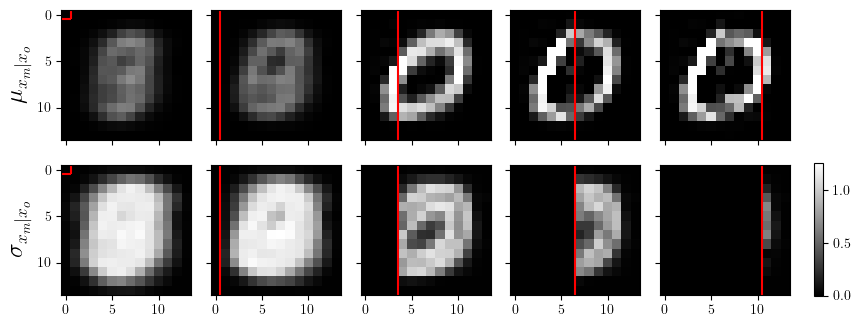

In [148]:
idxs = np.arange(0, 5)
# idxs = np.arange(5, 10)
num_samples=10000

# Compute true parameters that are the same for all models/methods
model = list(imps_all.keys())[0]
all_stds = []
all_means = []
for idx in idxs:
    X_i = imp_true[model][idx]
    X_i = torch.tensor(X_i)
    M_i = imp_masks[model][idx]
    M_i = torch.tensor(M_i)

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)
    
    X_imp = sample_sparse_mog(num_samples, M_i, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)
    X_imp = X_imp[0]
    
    mean = X_imp.mean(axis=0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    stds = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_imp).std(axis=0, unbiased=True)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

    all_stds.append(stds)
    all_means.append(mean)

true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# true_all_means = dataset.postprocess(true_all_means)

# Maximum std
std_max = np.max(true_all_stds)

# Plot true figure
fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/2008888805.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


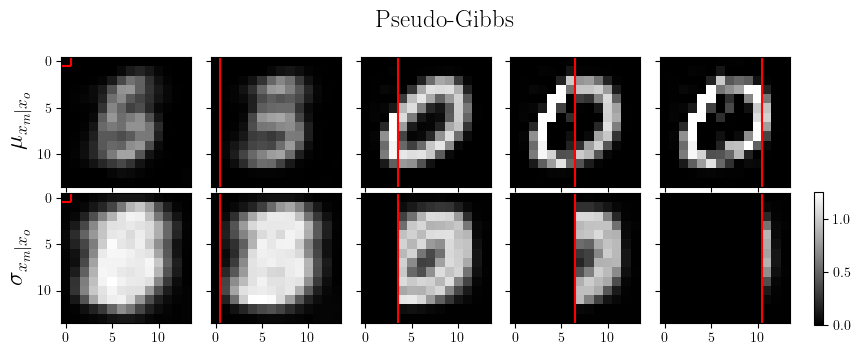

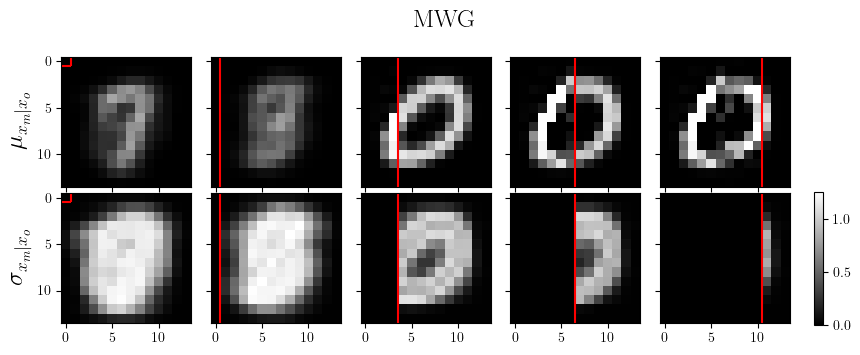

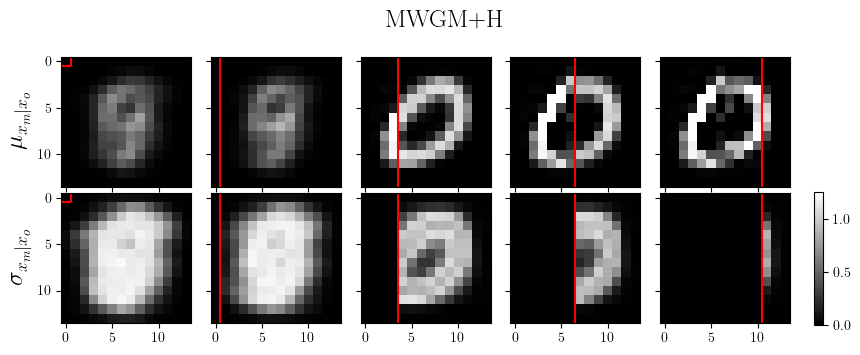

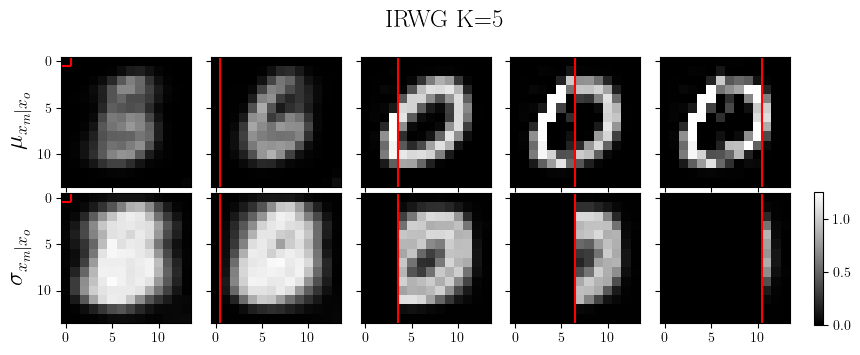

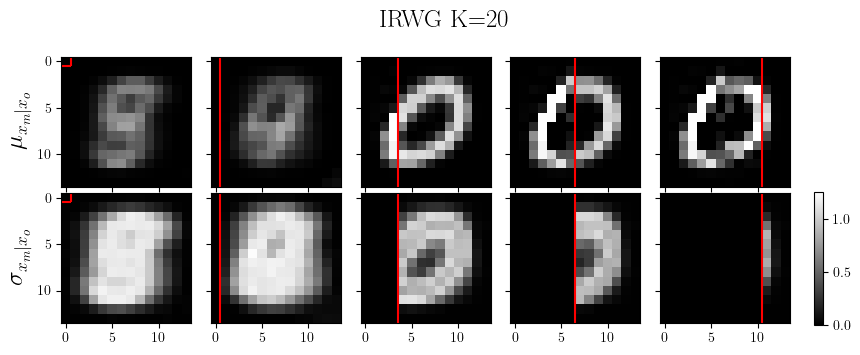

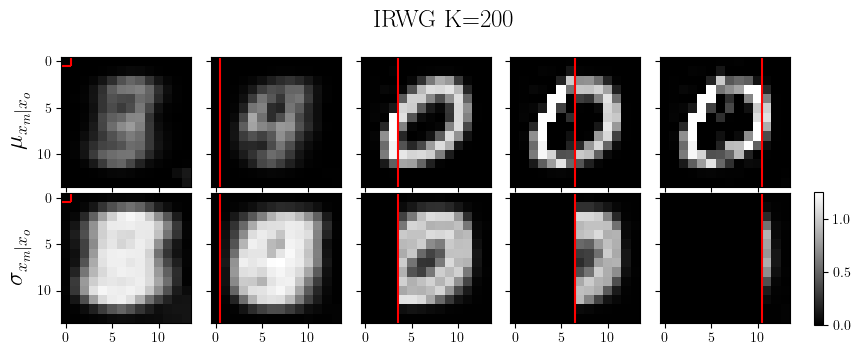

In [149]:
idxs = np.arange(0, 5)
# idxs = np.arange(5, 10)

for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/1885003707.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


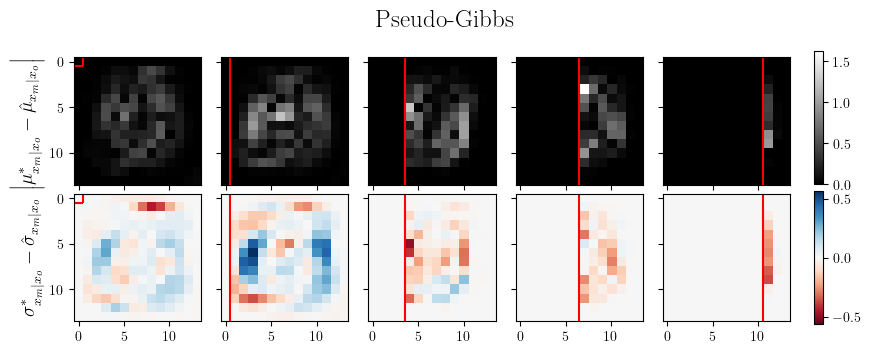

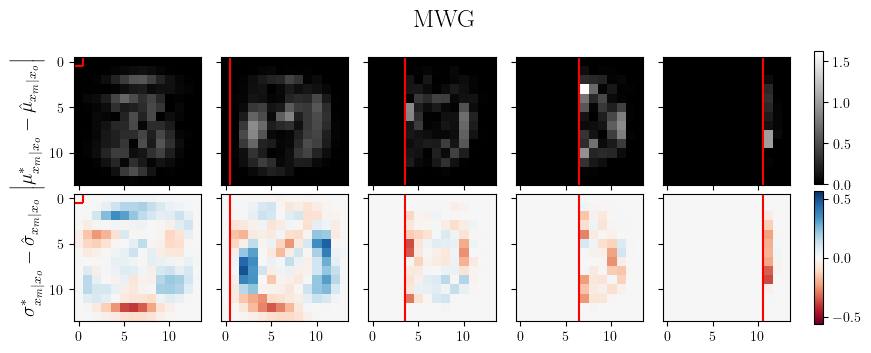

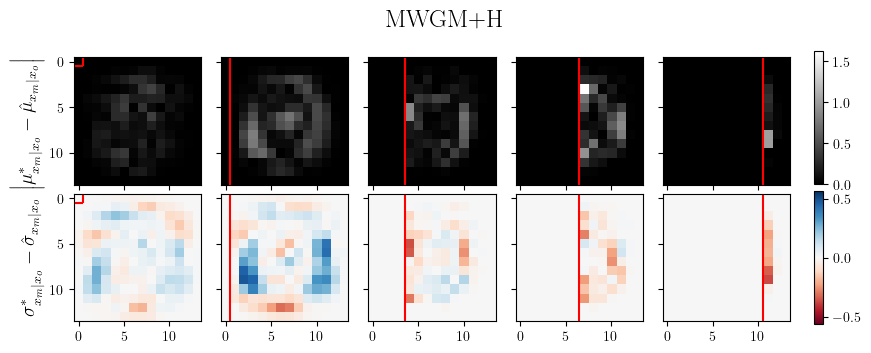

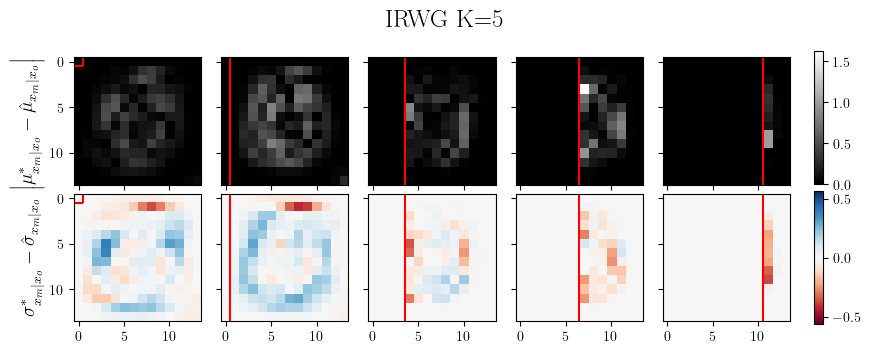

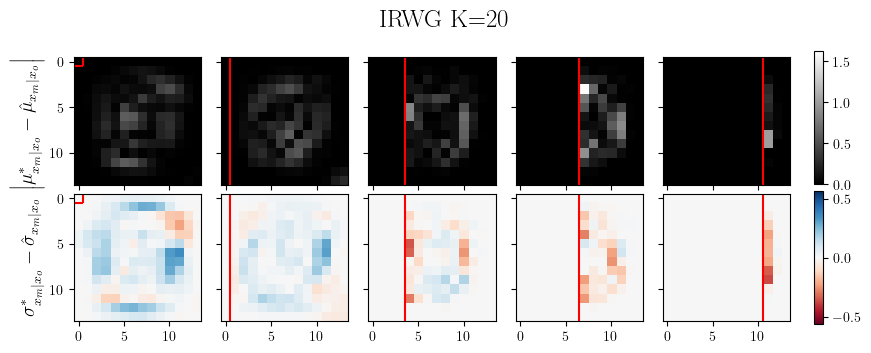

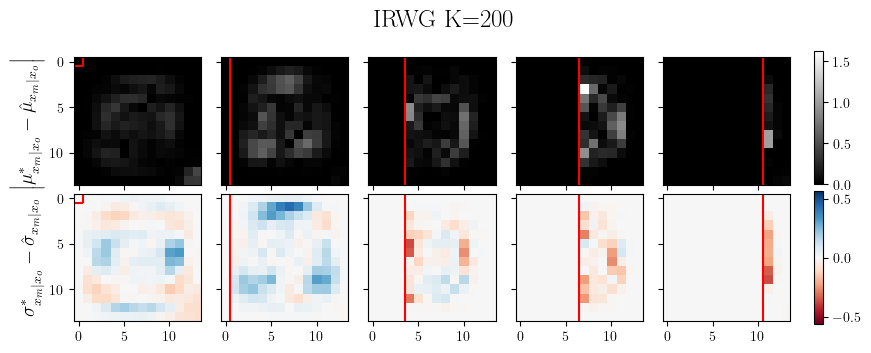

In [150]:
idxs = np.arange(0, 5)
# idxs = np.arange(5, 10)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds)

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


for m, model in enumerate(imps_all.keys()):
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

### Imputation mean and std  (Sample 45)

In [151]:
imp_means = {}
imp_stds = {}
imp_masks = {}
imp_true = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = rearrange(imps, 'b t k d -> b (t k) d')
    imp_means[model] = imps.mean(axis=1)
    imp_stds[model] = dataset.clip_unconstrained_samples_to_unconstraineddatarange(imps).std(axis=1, ddof=1)
#     imp_stds[model] = imps.std(axis=1, ddof=1)
    imp_masks[model] = masks
    true_X[np.isnan(true_X)] = 0.
    imp_true[model] = true_X

In [152]:
def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

In [153]:
# idxs = np.arange(5, 10)

# # Compute true parameters that are the same for all models/methods
# model = list(imps_all.keys())[0]
# all_stds = []
# all_means = []
# for idx in idxs:
#     X_i = imp_true[model][idx]
#     X_i = torch.tensor(X_i)
#     M_i = imp_masks[model][idx]
#     M_i = torch.tensor(M_i)

#     comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
#         compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

#     comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
#     means_m_given_o = asnumpy(means_m_given_o)[0]
#     covs_m_given_o = asnumpy(covs_m_given_o)[0]

#     stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
#     stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

#     mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
#     mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
#     mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)

#     all_stds.append(stds)
#     all_means.append(mean)

# true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
# true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# # true_all_means = dataset.postprocess(true_all_means)

# # Maximum std
# std_max = np.max(true_all_stds)

# # Plot true figure
# fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
# for i in range(len(idxs)):
#     mean = true_all_means[i]
#     mean = dataset.postprocess(mean)
#     im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

# draw_obs_contour(axes[0])
# axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

# for i in range(len(idxs)):
#     stds = true_all_stds[i]
#     im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
# draw_obs_contour(axes[1])

# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
# fig.colorbar(im, cax=cbar_ax)
# axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

# fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/769386180.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


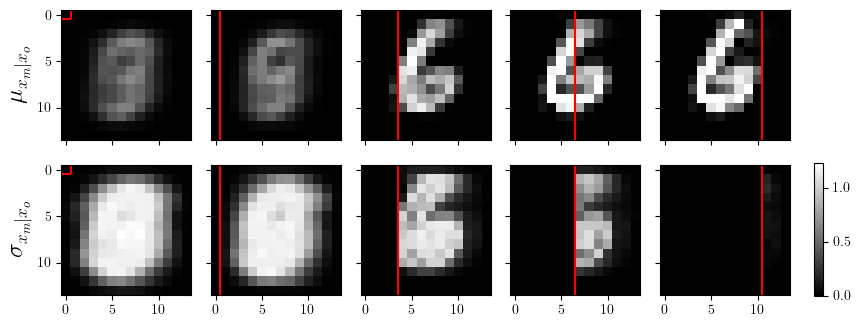

In [154]:
idxs = np.arange(5, 10)
num_samples=10000

# Compute true parameters that are the same for all models/methods
model = list(imps_all.keys())[0]
all_stds = []
all_means = []
for idx in idxs:
    X_i = imp_true[model][idx]
    X_i = torch.tensor(X_i)
    M_i = imp_masks[model][idx]
    M_i = torch.tensor(M_i)

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)
    
    X_imp = sample_sparse_mog(num_samples, M_i, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)
    X_imp = X_imp[0]
    
    mean = X_imp.mean(axis=0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    stds = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_imp).std(axis=0, unbiased=True)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

    all_stds.append(stds)
    all_means.append(mean)

true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# true_all_means = dataset.postprocess(true_all_means)

# Maximum std
std_max = np.max(true_all_stds)

# Plot true figure
fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/1815334858.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


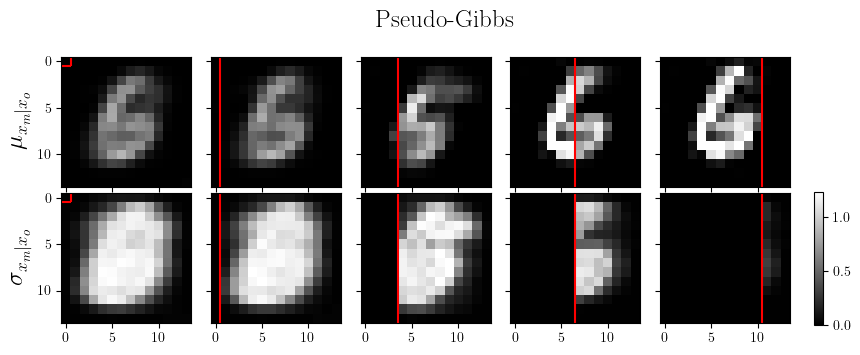

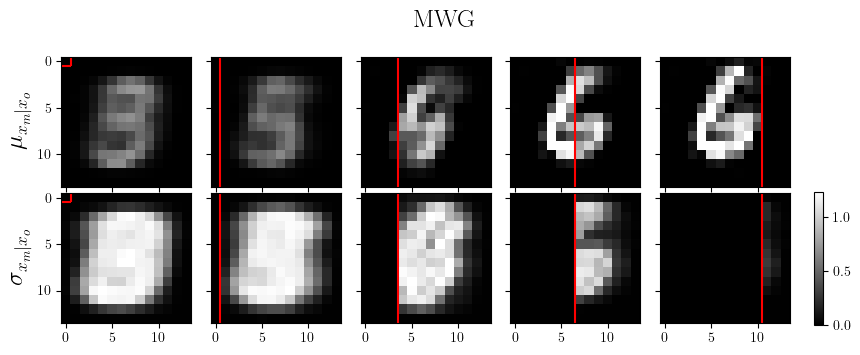

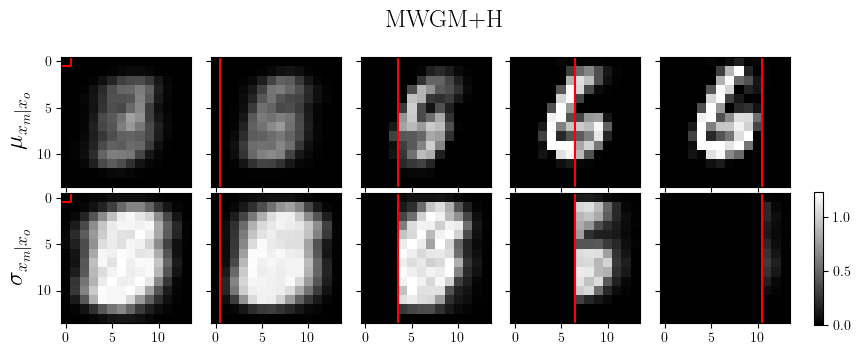

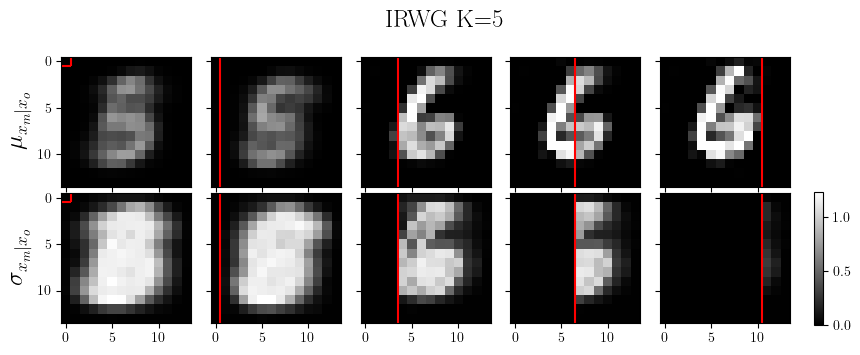

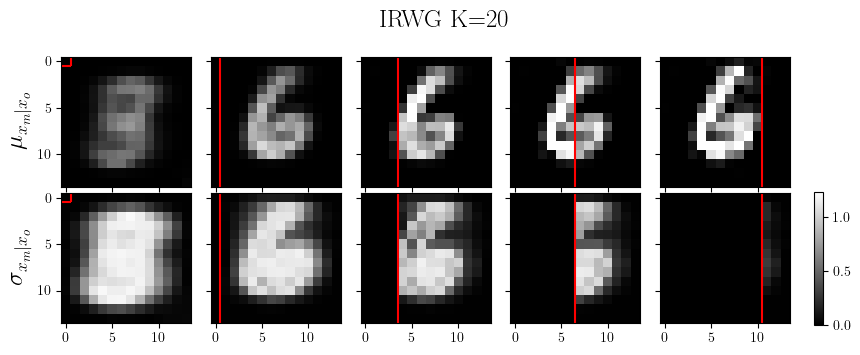

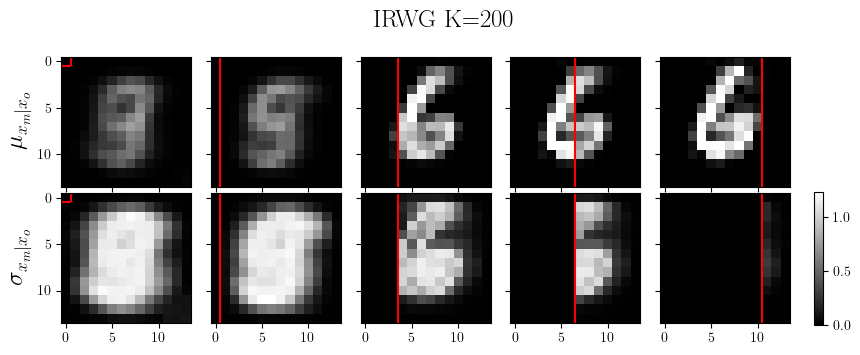

In [155]:
idxs = np.arange(5, 10)

for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/17117661.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


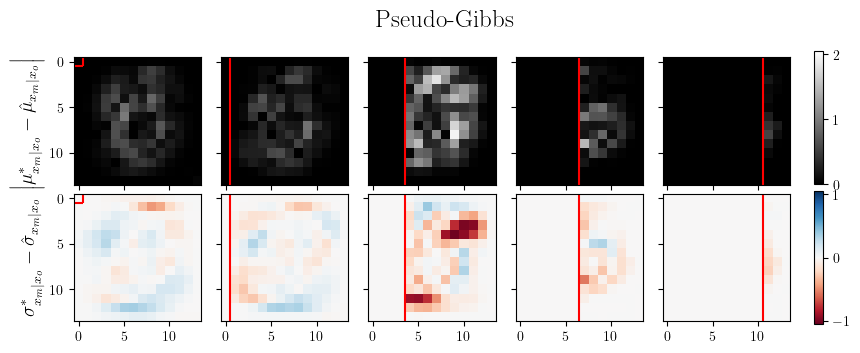

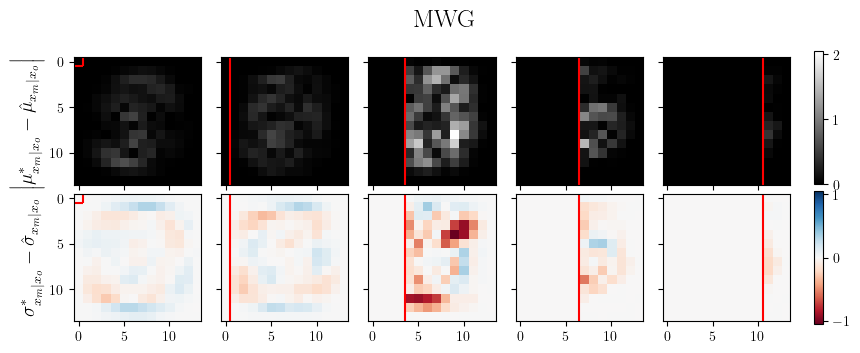

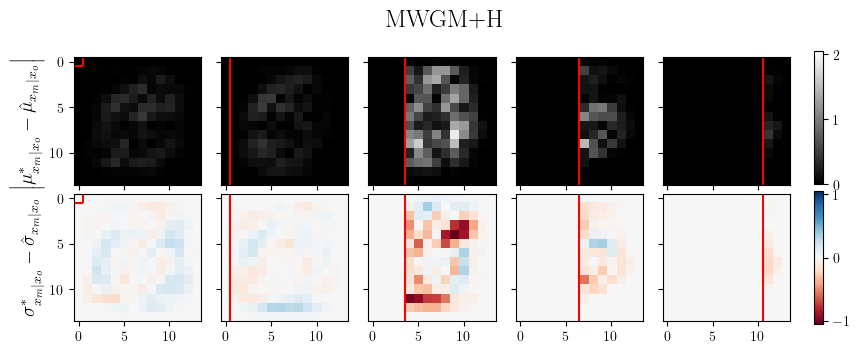

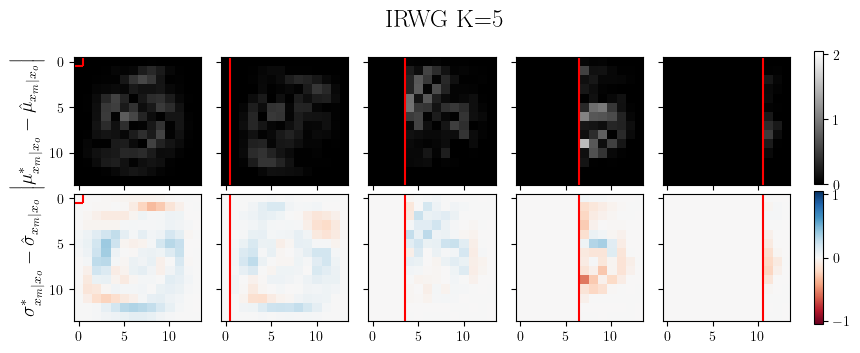

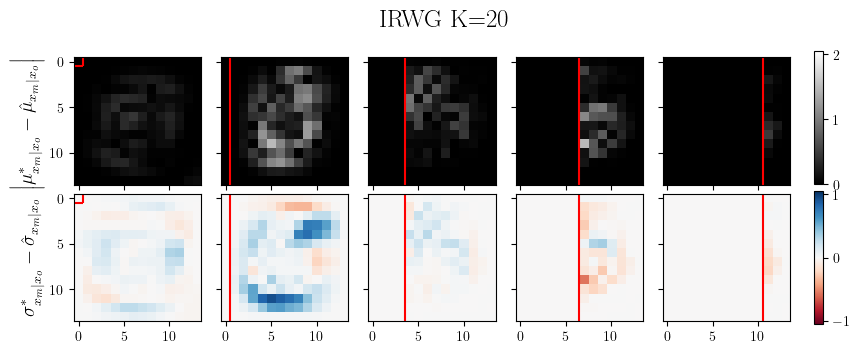

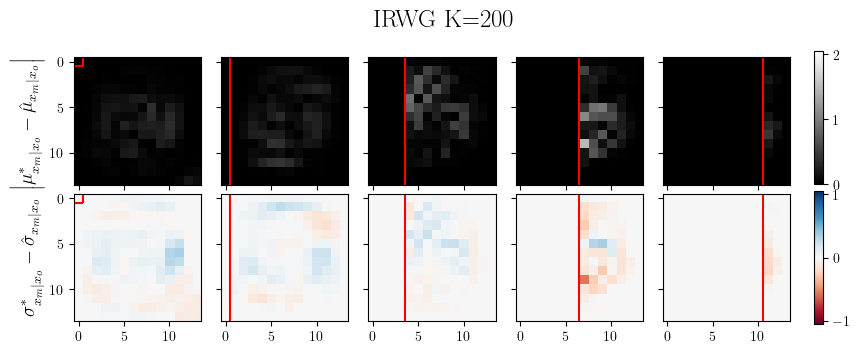

In [156]:
idxs = np.arange(5, 10)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds)

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


for m, model in enumerate(imps_all.keys()):
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

### Imputation mean and std  (Sample 136)

In [157]:
imp_means = {}
imp_stds = {}
imp_masks = {}
imp_true = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = rearrange(imps, 'b t k d -> b (t k) d')
    imp_means[model] = imps.mean(axis=1)
    imp_stds[model] = dataset.clip_unconstrained_samples_to_unconstraineddatarange(imps).std(axis=1, ddof=1)
#     imp_stds[model] = imps.std(axis=1, ddof=1)
    imp_masks[model] = masks
    true_X[np.isnan(true_X)] = 0.
    imp_true[model] = true_X

In [158]:
def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

In [159]:
# idxs = np.arange(10, 15)

# # Compute true parameters that are the same for all models/methods
# model = list(imps_all.keys())[0]
# all_stds = []
# all_means = []
# for idx in idxs:
#     X_i = imp_true[model][idx]
#     X_i = torch.tensor(X_i)
#     M_i = imp_masks[model][idx]
#     M_i = torch.tensor(M_i)

#     comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
#         compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

#     comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
#     means_m_given_o = asnumpy(means_m_given_o)[0]
#     covs_m_given_o = asnumpy(covs_m_given_o)[0]

#     stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
#     stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

#     mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
#     mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
#     mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)

#     all_stds.append(stds)
#     all_means.append(mean)

# true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
# true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# # true_all_means = dataset.postprocess(true_all_means)

# # Maximum std
# std_max = np.max(true_all_stds)

# # Plot true figure
# fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
# for i in range(len(idxs)):
#     mean = true_all_means[i]
#     mean = dataset.postprocess(mean)
#     im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

# draw_obs_contour(axes[0])
# axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

# for i in range(len(idxs)):
#     stds = true_all_stds[i]
#     im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
# draw_obs_contour(axes[1])

# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
# fig.colorbar(im, cax=cbar_ax)
# axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

# fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/2506870927.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


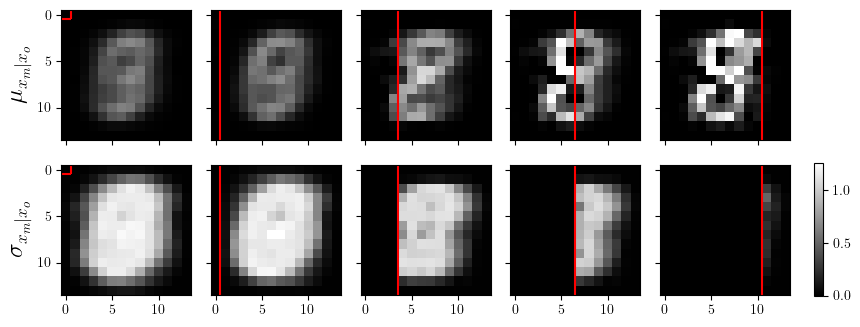

In [160]:
idxs = np.arange(10, 15)
num_samples=10000

# Compute true parameters that are the same for all models/methods
model = list(imps_all.keys())[0]
all_stds = []
all_means = []
for idx in idxs:
    X_i = imp_true[model][idx]
    X_i = torch.tensor(X_i)
    M_i = imp_masks[model][idx]
    M_i = torch.tensor(M_i)

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)
    
    X_imp = sample_sparse_mog(num_samples, M_i, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)
    X_imp = X_imp[0]
    
    mean = X_imp.mean(axis=0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    stds = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_imp).std(axis=0, unbiased=True)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

    all_stds.append(stds)
    all_means.append(mean)

true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# true_all_means = dataset.postprocess(true_all_means)

# Maximum std
std_max = np.max(true_all_stds)

# Plot true figure
fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/3268427162.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


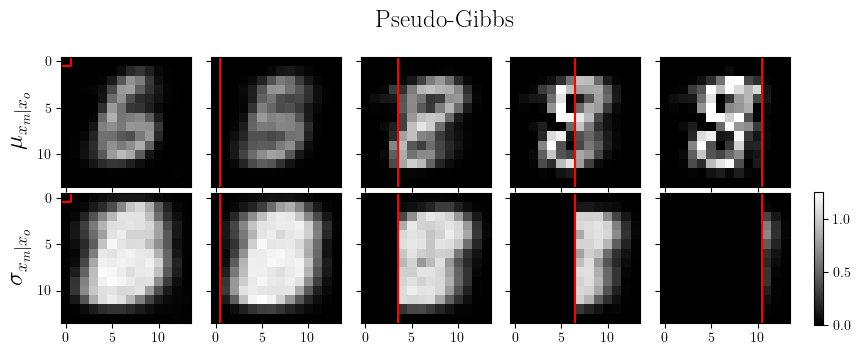

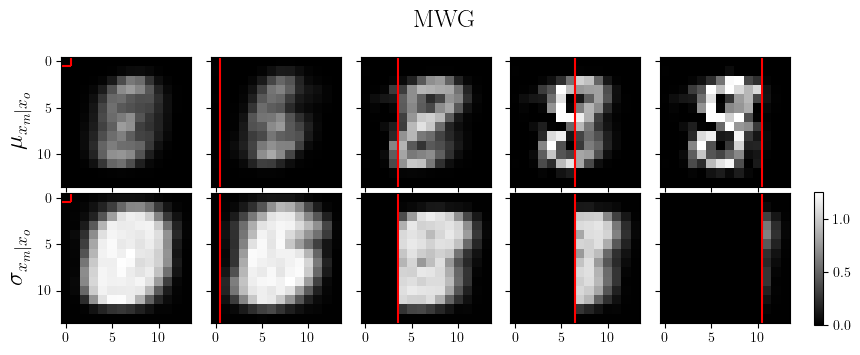

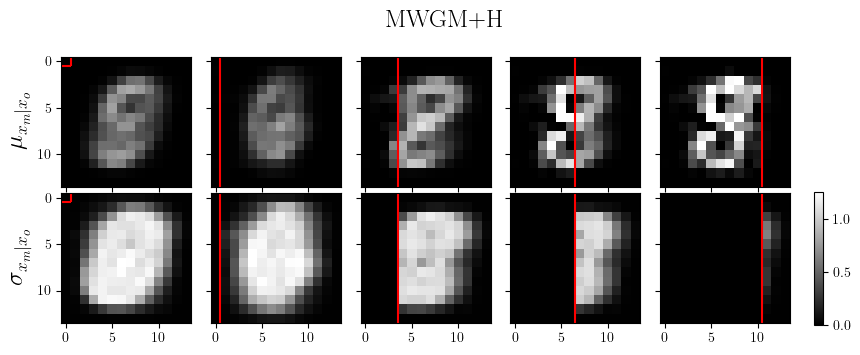

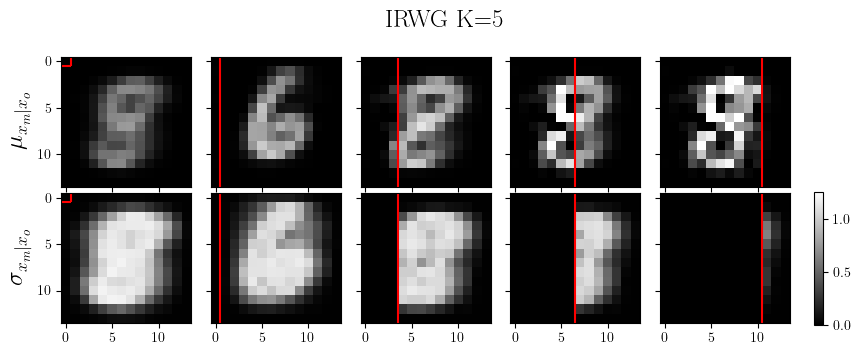

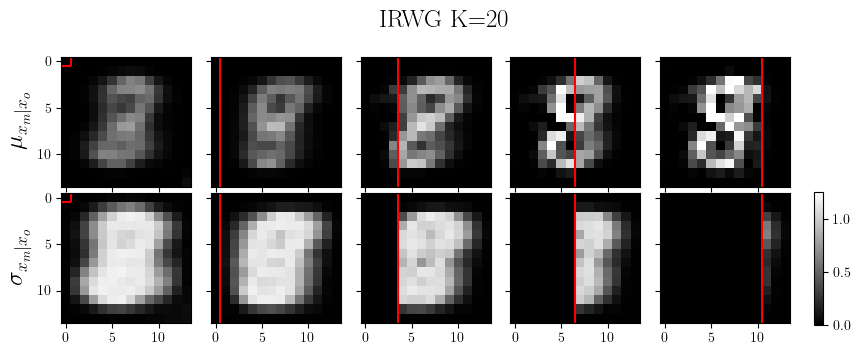

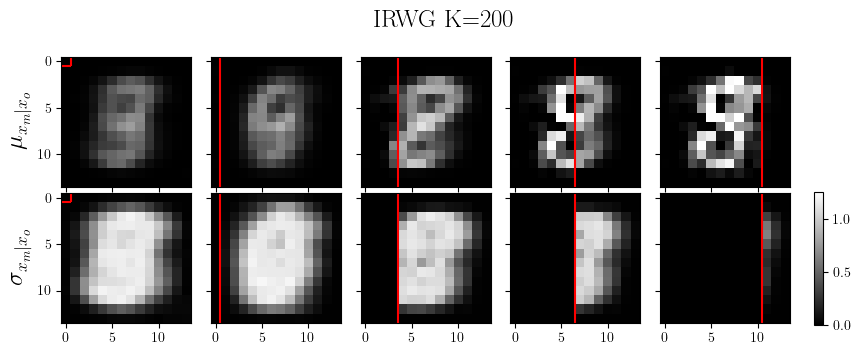

In [161]:
idxs = np.arange(10, 15)

for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/2657630403.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


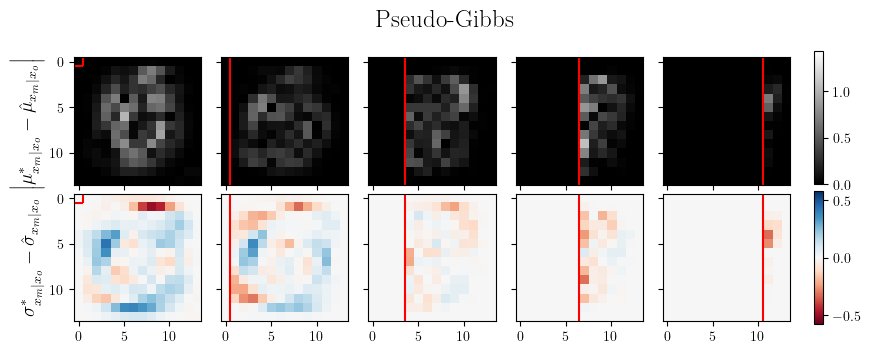

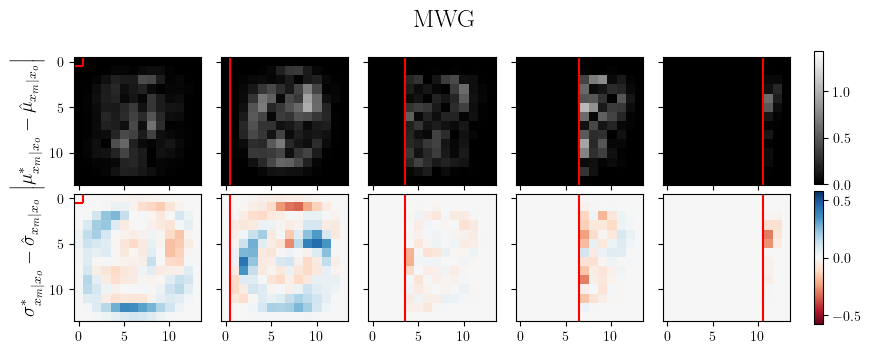

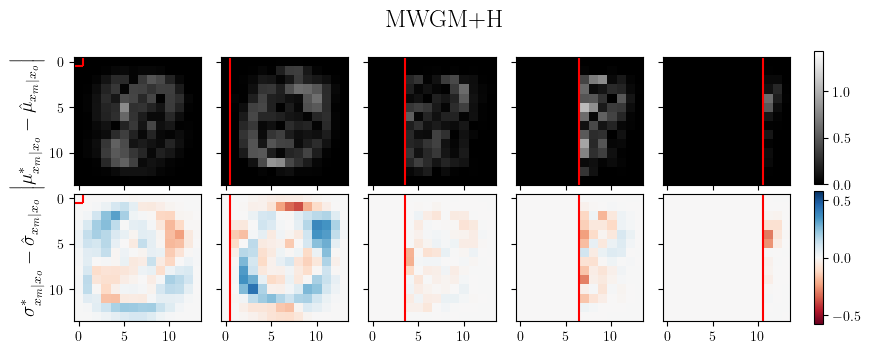

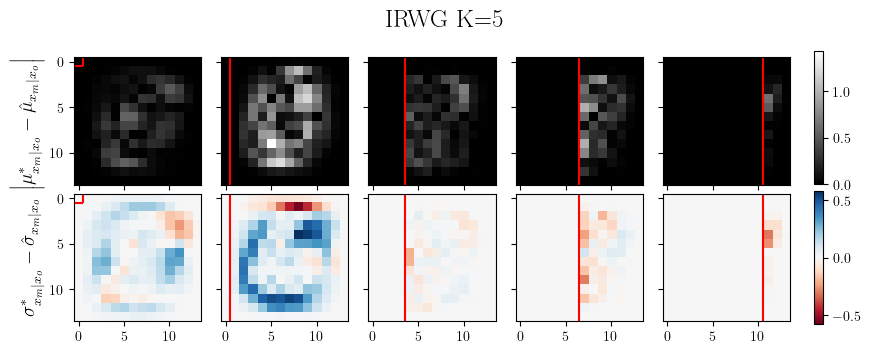

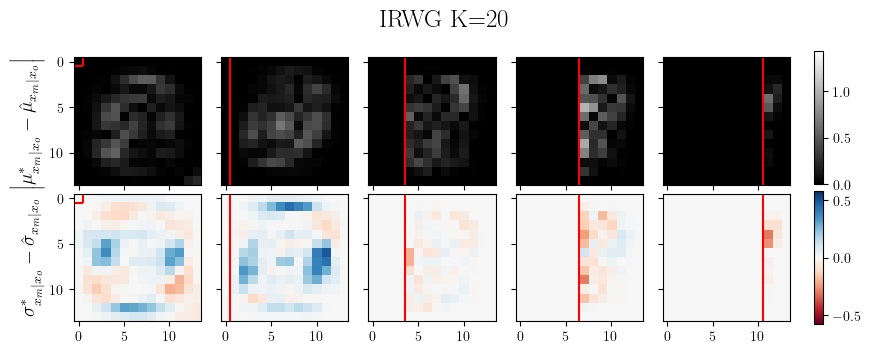

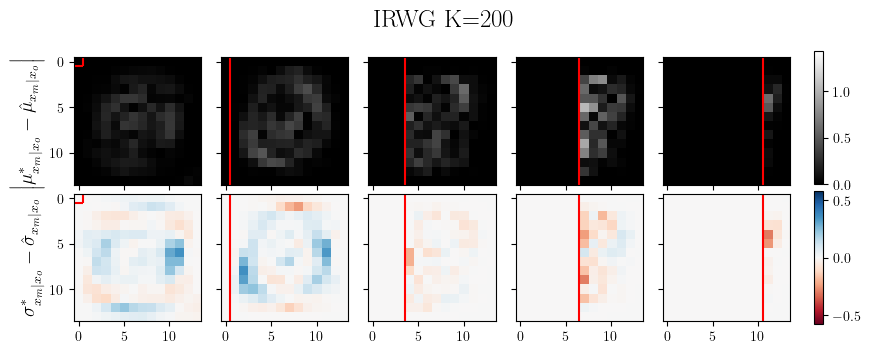

In [162]:
idxs = np.arange(10, 15)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds)

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


for m, model in enumerate(imps_all.keys()):
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

### Imputation mean and std  (Sample 191)

In [163]:
imp_means = {}
imp_stds = {}
imp_masks = {}
imp_true = {}
for model, tensors in imps_all.items():
    imps, true_X, masks = tensors
    imps = rearrange(imps, 'b t k d -> b (t k) d')
    imp_means[model] = imps.mean(axis=1)
    imp_stds[model] = dataset.clip_unconstrained_samples_to_unconstraineddatarange(imps).std(axis=1, ddof=1)
#     imp_stds[model] = imps.std(axis=1, ddof=1)
    imp_masks[model] = masks
    true_X[np.isnan(true_X)] = 0.
    imp_true[model] = true_X

In [164]:
def draw_obs_contour(axes):
    px_width = 0.5
    axes[0].hlines(0+px_width, 0-px_width, 0+px_width, colors='r')
    axes[0].vlines(0+px_width, 0-px_width, 0+px_width, colors='r')

    axes[1].axvline(0+px_width, color='r')
    axes[2].axvline(3+px_width, color='r')
    axes[3].axvline(6+px_width, color='r')
    axes[4].axvline(10+px_width, color='r')

In [165]:
# idxs = np.arange(15, 20)

# # Compute true parameters that are the same for all models/methods
# model = list(imps_all.keys())[0]
# all_stds = []
# all_means = []
# for idx in idxs:
#     X_i = imp_true[model][idx]
#     X_i = torch.tensor(X_i)
#     M_i = imp_masks[model][idx]
#     M_i = torch.tensor(M_i)

#     comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
#         compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)

#     comp_log_probs_given_o = asnumpy(comp_log_probs_given_o)
#     means_m_given_o = asnumpy(means_m_given_o)[0]
#     covs_m_given_o = asnumpy(covs_m_given_o)[0]

#     stds = compute_marginal_stddev_of_mog(means_m_given_o, np.exp(comp_log_probs_given_o)[0], covs_m_given_o)
#     stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

#     mean = (np.exp(comp_log_probs_given_o)[0, :, None]*means_m_given_o).sum(0)
#     mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
#     mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)

#     all_stds.append(stds)
#     all_means.append(mean)

# true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
# true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# # true_all_means = dataset.postprocess(true_all_means)

# # Maximum std
# std_max = np.max(true_all_stds)

# # Plot true figure
# fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
# for i in range(len(idxs)):
#     mean = true_all_means[i]
#     mean = dataset.postprocess(mean)
#     im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

# draw_obs_contour(axes[0])
# axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

# for i in range(len(idxs)):
#     stds = true_all_stds[i]
#     im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
# draw_obs_contour(axes[1])

# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
# fig.colorbar(im, cax=cbar_ax)
# axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

# fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/735589023.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


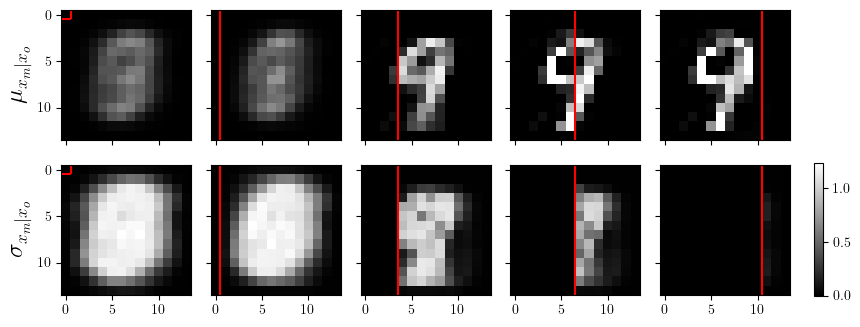

In [166]:
idxs = np.arange(15, 20)
num_samples=10000

# Compute true parameters that are the same for all models/methods
model = list(imps_all.keys())[0]
all_stds = []
all_means = []
for idx in idxs:
    X_i = imp_true[model][idx]
    X_i = torch.tensor(X_i)
    M_i = imp_masks[model][idx]
    M_i = torch.tensor(M_i)

    comp_log_probs_given_o, means_m_given_o, covs_m_given_o = \
        compute_conditional_mog_parameters(X_i, M_i, comp_log_probs, means, covs)
    
    X_imp = sample_sparse_mog(num_samples, M_i, 
                  comp_log_probs_given_o, means_m_given_o, covs_m_given_o)
    X_imp = X_imp[0]
    
    mean = X_imp.mean(axis=0)
    mean = mean*~asnumpy(M_i) + asnumpy(X_i*M_i)
    mean = rearrange(mean, '1 (h w) -> h w', h=14, w=14)
    
    stds = dataset.clip_unconstrained_samples_to_unconstraineddatarange(X_imp).std(axis=0, unbiased=True)
    stds = rearrange(stds, '(h w) -> h w', h=14, w=14)

    all_stds.append(stds)
    all_means.append(mean)

true_all_stds = asnumpy(rearrange(all_stds, 'b h w -> b h w'))
true_all_means = asnumpy(rearrange(all_means, 'b h w -> b h w'))
# true_all_means = dataset.postprocess(true_all_means)

# Maximum std
std_max = np.max(true_all_stds)

# Plot true figure
fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
for i in range(len(idxs)):
    mean = true_all_means[i]
    mean = dataset.postprocess(mean)
    im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

draw_obs_contour(axes[0])
axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

for i in range(len(idxs)):
    stds = true_all_stds[i]
    im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)
    
draw_obs_contour(axes[1])

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.91, 0.11, 0.01, 0.38])
fig.colorbar(im, cax=cbar_ax)
axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/1126819223.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


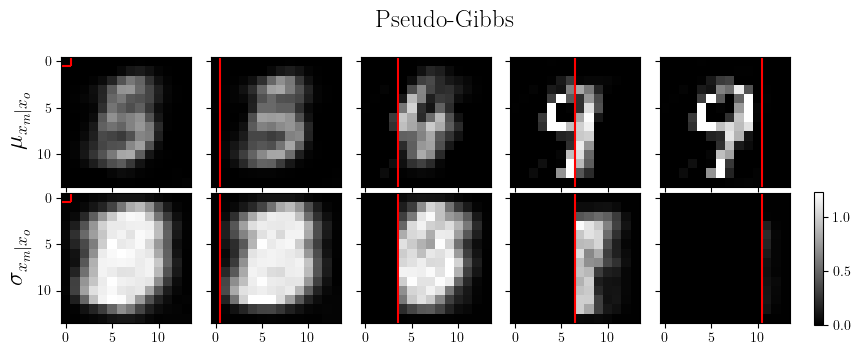

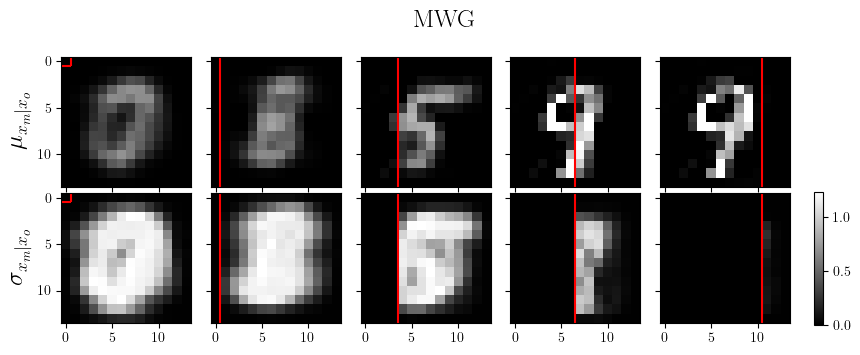

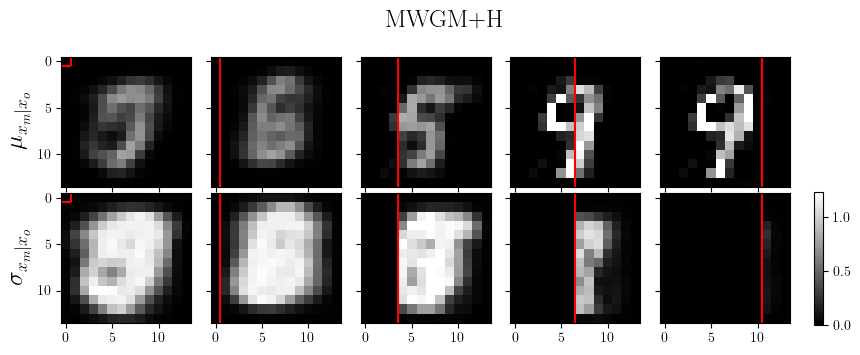

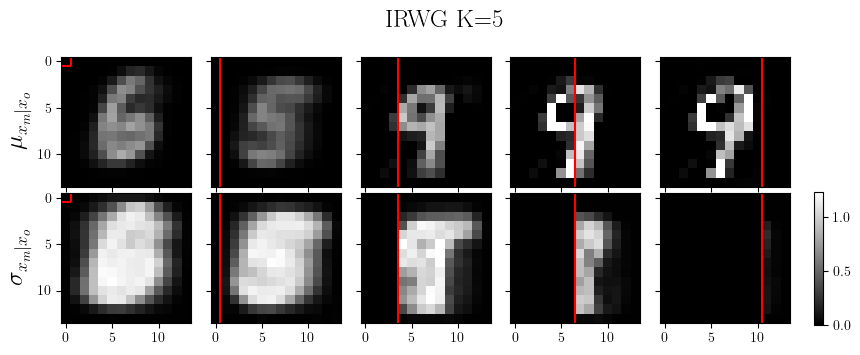

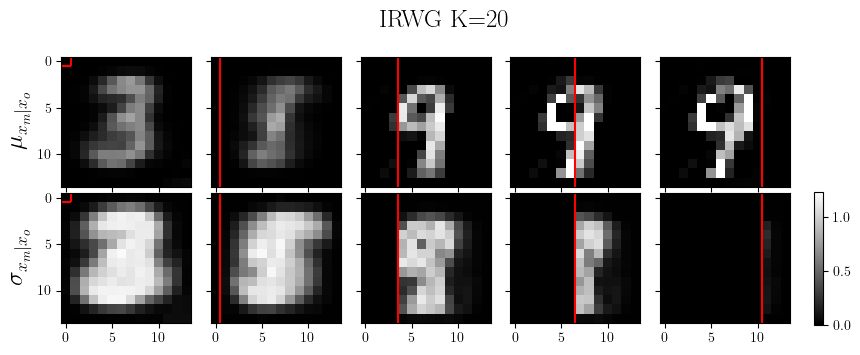

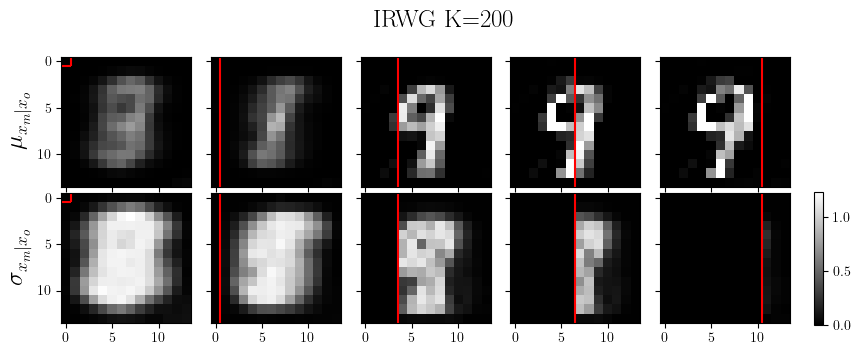

In [167]:
idxs = np.arange(15, 20)

for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)

    # Use std_max from previous cell
#     std_max = np.max(all_stds)

    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean = all_means[i]
        mean = dataset.postprocess(mean)
        im = axes[0][i].imshow(mean, cmap='gray', vmin=0, vmax=1)

    draw_obs_contour(axes[0])
#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
#     fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\mu_{x_m \mid x_o}$', fontsize=18)

    for i in range(len(idxs)):
        stds = all_stds[i]
        im = axes[1][i].imshow(stds, cmap='gray', vmin=0, vmax=std_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\sigma_{x_m \mid x_o}$', fontsize=18)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

/tmp/ipykernel_1751610/3329235605.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


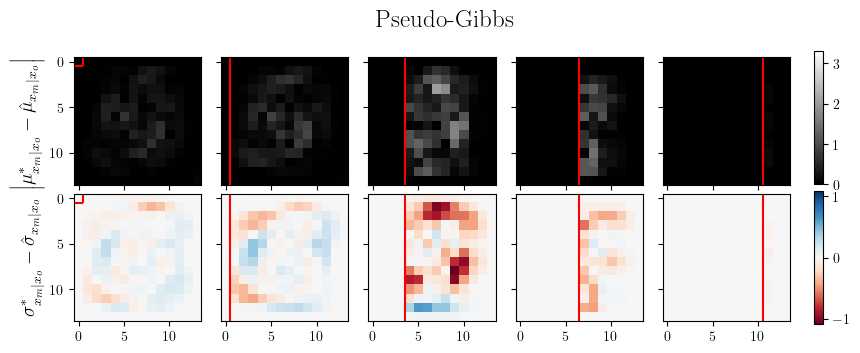

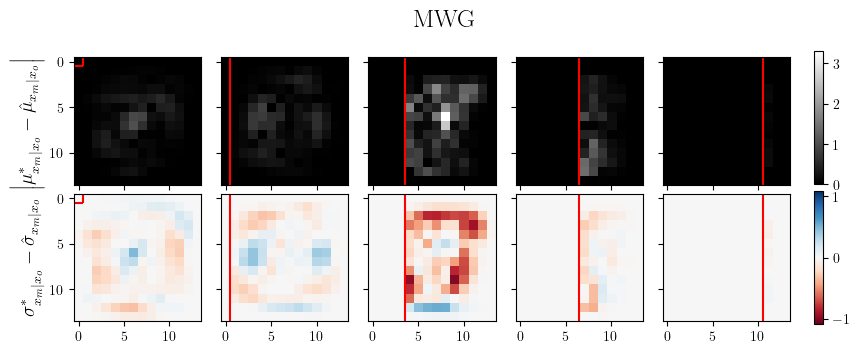

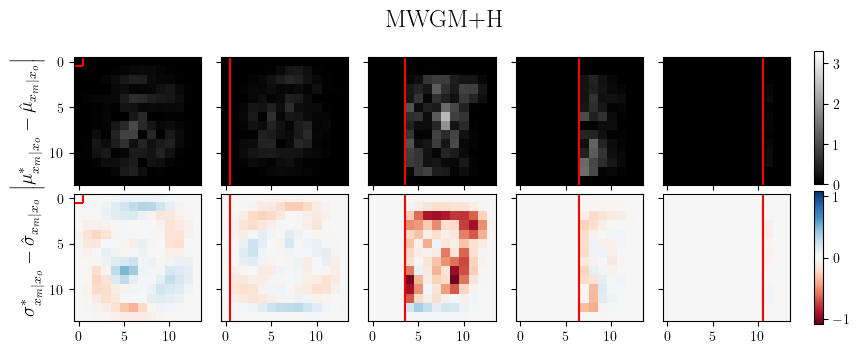

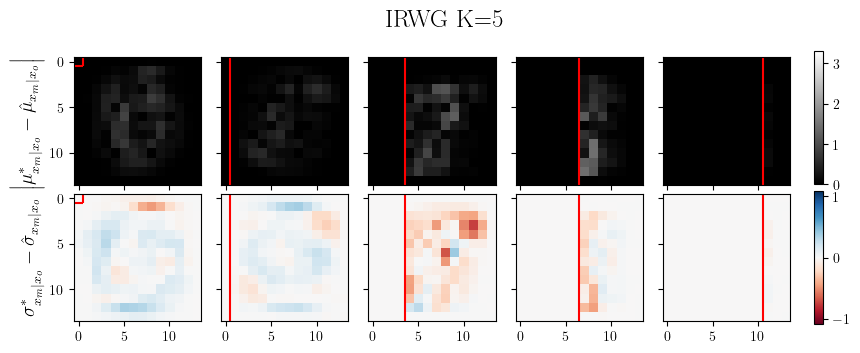

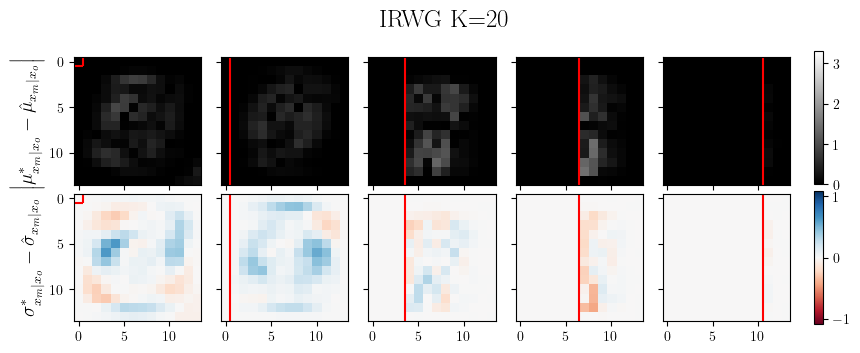

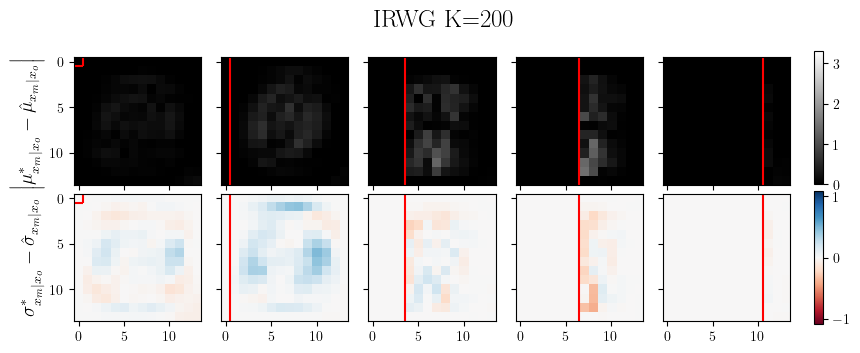

In [168]:
idxs = np.arange(15, 20)

all_model_means = []
all_model_stds = []
for model in imps_all.keys():
    all_stds = imp_stds[model][idxs]
    all_means = imp_means[model][idxs]
    all_stds = asnumpy(rearrange(all_stds, 'b (h w) -> b h w', h=14, w=14))
    all_means = asnumpy(rearrange(all_means, 'b (h w) -> b h w', h=14, w=14))
#     all_means = dataset.postprocess(all_means)
    
    all_model_means.append(all_means)
    all_model_stds.append(all_stds)
all_model_means = rearrange(all_model_means, 'm b h w -> m b h w')
all_model_stds = rearrange(all_model_stds, 'm b h w -> m b h w')

# Compute errors
all_model_mean_errs = np.absolute((true_all_means[None, :] - all_model_means))
all_model_std_diffs = (true_all_stds[None, :] - all_model_stds)

mean_err_max = np.max(all_model_mean_errs)
std_diff_min = np.min(all_model_std_diffs)
std_diff_max = np.max(all_model_std_diffs)
std_min_max = np.array([std_diff_min, std_diff_max])
std_min_max_abs = np.absolute(std_min_max)
std_diff_min = -np.amax(std_min_max_abs)
std_diff_max = np.amax(std_min_max_abs)


for m, model in enumerate(imps_all.keys()):
    mean_errs = all_model_mean_errs[m]
    std_diffs = all_model_std_diffs[m]
    # Plot figure from imputations
    fig, axes = plt.subplots(2, len(idxs), figsize=(9, 3.5), sharex=True, sharey=True)
    for i in range(len(idxs)):
        mean_err = mean_errs[i]
        im = axes[0][i].imshow(mean_err, cmap='gray', vmin=0, vmax=mean_err_max)

    draw_obs_contour(axes[0])
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.48, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[0][0].set_ylabel('$\\left|\\mu^*_{x_m \mid x_o} - \\hat\\mu_{x_m \mid x_o}\\right|$', fontsize=14)

    for i in range(len(idxs)):
        stds_diff = std_diffs[i]
        im = axes[1][i].imshow(stds_diff, cmap='RdBu', vmin=std_diff_min, vmax=std_diff_max)

    draw_obs_contour(axes[1])

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.91, 0.08, 0.01, 0.38])
    fig.colorbar(im, cax=cbar_ax)
    axes[1][0].set_ylabel('$\\sigma^*_{x_m \mid x_o} - \\hat\\sigma_{x_m \mid x_o}$', fontsize=14)

    fig.suptitle(model, fontsize=18)
    fig.tight_layout(rect=[0, 0, .9, 1])

## Imputations MoGs

In [185]:
path_template = f'../logs/{ds}/imputation/mog_fitting1/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
#     'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'IRWG K=5': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG K=20': 'vae_convresnet3_k20_irwg_i1_dmis_gr_mult',
#     'IRWG K=200': 'vae_convresnet3_k200_irwg_i1_dmis_gr_mult',
}

num_iters = defaultdict(lambda: [100, 500, 1000, 5000, 10000])

klfows = {}
klrevs = {}
jsds = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd = load_mog_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd

dict_keys(['MWG', 'MWGM+H', 'IRWG K=5'])


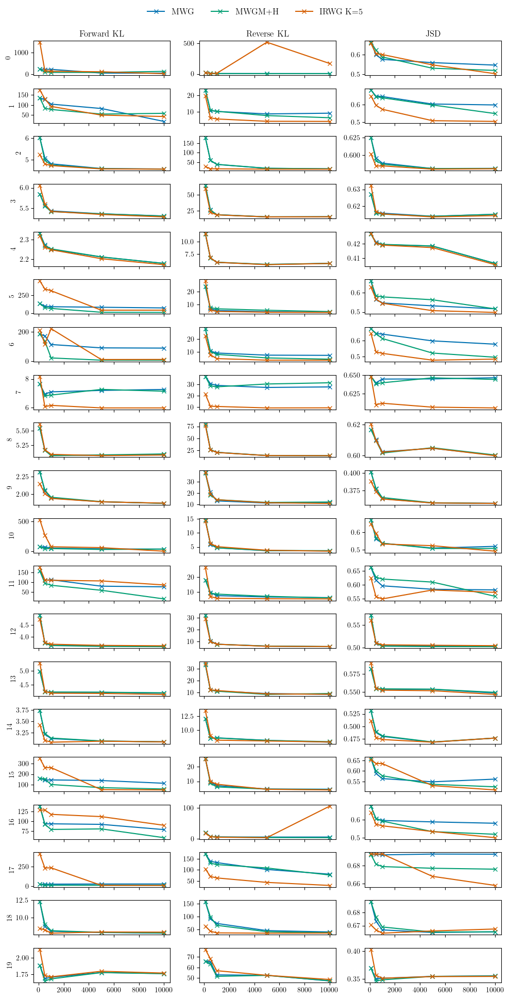

In [186]:
num_datapoints = 20
plot_log_log = False

fig, axes = plt.subplots(num_datapoints, 3, figsize=(10, num_datapoints), sharex=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']



for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        x = num_iters[model]
        axes[data_idx, 0].plot(x, klfows[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 2].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        
        axes[data_idx, 0].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx, 0].set_yscale('log')
            axes[data_idx, 0].set_xscale('log')
            axes[data_idx, 1].set_yscale('log')
            axes[data_idx, 1].set_xscale('log')
            axes[data_idx, 2].set_yscale('log')
            axes[data_idx, 2].set_xscale('log')
            
    
print(klfows.keys())

axes[0,0].set_title('Forward KL')
axes[0,1].set_title('Reverse KL')
axes[0,2].set_title('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0,0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.96), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)


## Imputations $p(z \mid x_o)$

In [170]:
path_template = f'../logs/{ds}/imputation/samples1/{{}}/seed_m20220118_d20220118/lightning_logs'

models = {
    'Pseudo-Gibbs': 'vae_convresnet3_k5_pseudo_gibbs',
    'MWG': 'vae_convresnet3_k5_mwg_with_ps_warmup',
    'MWGM+H': 'vae_convresnet3_k5_mwgm_usehist_with_ps_warmup',
    'IRWG K=5': 'vae_convresnet3_k5_irwg_i1_dmis_gr_mult',
#     'IRWG K=20': 'vae_convresnet3_k20_irwg_i1_dmis_gr_mult',
#     'IRWG K=200': 'vae_convresnet3_k200_irwg_i1_dmis_gr_mult',
}

klfows = {}
klrevs = {}
jsds = {}
for model, dir_name in models.items():
    path = path_template.format(dir_name)
    klfow, klrev, jsd = load_mog_compprob_results(path)
    klfows[model] = klfow
    klrevs[model] = klrev
    jsds[model] = jsd

dict_keys(['Pseudo-Gibbs', 'MWG', 'MWGM+H', 'IRWG K=5'])


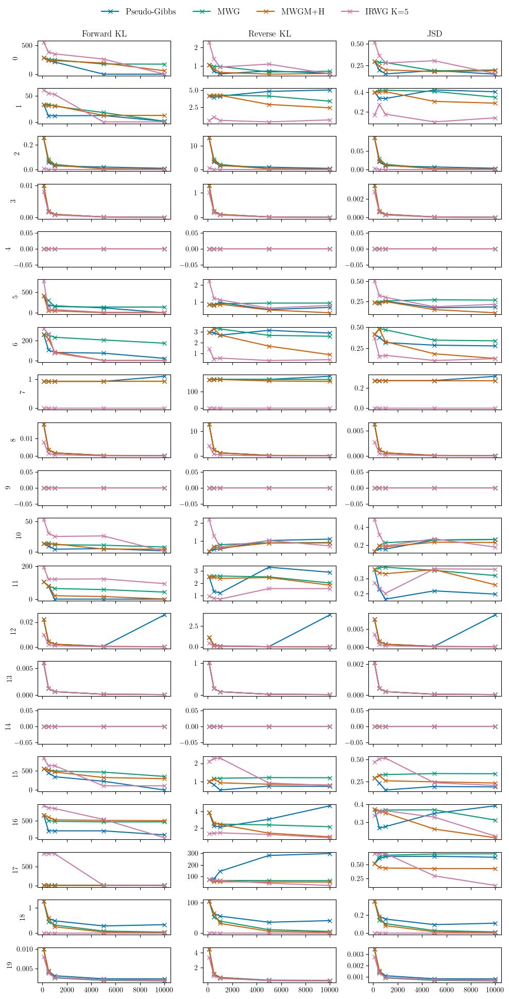

In [175]:
num_datapoints = 20
plot_log_log = False

fig, axes = plt.subplots(num_datapoints, 3, figsize=(10, 20), sharex=True)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

x = [100, 500, 1000, 5000, 10000]

for i, model in enumerate(klfows.keys()):
    for data_idx in range(num_datapoints):
        axes[data_idx, 0].plot(x, klfows[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 1].plot(x, klrevs[model][data_idx], 
                               color=colors[i], marker='x', label=model)

        axes[data_idx, 2].plot(x, jsds[model][data_idx], 
                               color=colors[i], marker='x', label=model)
        
        axes[data_idx, 0].set_ylabel(data_idx)
        if plot_log_log:
            axes[data_idx, 0].set_yscale('log')
            axes[data_idx, 0].set_xscale('log')
            axes[data_idx, 1].set_yscale('log')
            axes[data_idx, 1].set_xscale('log')
            axes[data_idx, 2].set_yscale('log')
            axes[data_idx, 2].set_xscale('log')
            
    
print(klfows.keys())

axes[0,0].set_title('Forward KL')
axes[0,1].set_title('Reverse KL')
axes[0,2].set_title('JSD')

fig.tight_layout(rect=(0, 0, 1, 0.95))
axes[0,0].legend(ncol=5, 
              bbox_to_anchor=(0.5, 0.96), 
              bbox_transform=fig.transFigure, 
              loc='center',
              fontsize=12,
              frameon=False)
